In [1]:
from binance.client import Client
import pytz
import datetime
import dateutil.parser
import pandas as pd
import smtplib 
from stockstats import StockDataFrame
import datetime as dt
from IPython.display import clear_output
import time
import numpy as np
import matplotlib.pyplot as py
import urllib3
from binance.client import Client
import plotly.graph_objects as go
import pandas as pd

In [2]:
def convert_datetime_timezone(dt, tz1, tz2):
    tz1 = pytz.timezone(tz1)
    tz2 = pytz.timezone(tz2)
    dt = datetime.datetime.strptime(dt,'%Y-%m-%d %H:%M:%S')
    dt = tz1.localize(dt)
    dt = dt.astimezone(tz2)
    dt = dt.strftime('%Y-%m-%d %H:%M:%S')
    return dt

In [3]:
def scrap_binance_price(unit,interval):

    api_key = 'LKa422RMjzx2tsXESIoSQ5qJzqi7LaC7iDFf9qdSrYjhJrZ6a8CcvOdniJWtfX13'
    api_secret = 'EvomPthpqwgTjeuqYFWBQM9HtE52Zeq6SuKrZSROqhd8g2tvbz086zVZqbbJGxsZ'

    client = Client(api_key, api_secret, {"verify": False, "timeout": 20})
    klines = client.get_historical_klines("BTCUSDT", unit, interval)

    data = pd.DataFrame();
    tradingdate = []
    openprice = []
    highprice = []
    lowprice = []
    closeprice = [] 
    for i in range(len(klines)):   
        time = datetime.datetime.utcfromtimestamp(klines[i][0]/1000).strftime('%Y-%m-%d %H:%M:%S')
        local_time = convert_datetime_timezone(time,'GMT','Australia/Adelaide')
        format_time = dateutil.parser.parse(local_time)
        tradingdate.append(format_time)
        openprice.append(float(klines[i][1]))
        highprice.append(float(klines[i][2]))
        lowprice.append(float(klines[i][3]))
        closeprice.append(float(klines[i][4]))
    data['datetime'] = tradingdate
    data['low'] = lowprice
    data['high'] = highprice
    data['open'] = openprice
    data['close'] = closeprice
    return data

In [4]:
def heikin_ashi(df):
    
    heikin_ashi_df = pd.DataFrame(index=df.index.values, columns=['open', 'high', 'low', 'close'])
    
    heikin_ashi_df['close'] = (df['open'] + df['high'] + df['low'] + df['close']) / 4
    
    for i in range(len(df)):
        if i == 0:
            heikin_ashi_df.iat[0, 0] = df['open'].iloc[0]
        else:
            heikin_ashi_df.iat[i, 0] = (heikin_ashi_df.iat[i-1, 0] + heikin_ashi_df.iat[i-1, 3]) / 2
        
    heikin_ashi_df['high'] = heikin_ashi_df.loc[:, ['open', 'close']].join(df['high']).max(axis=1)
    
    heikin_ashi_df['low'] = heikin_ashi_df.loc[:, ['open', 'close']].join(df['low']).min(axis=1)
    
    heikin_ashi_df['datetime'] = df['datetime']
    return heikin_ashi_df

In [5]:
def add_indicator(df1,df2):
    #1: buy indicator
    #w: sell indicator
    #0: no activity
    point = []
    #MACD_EMA_SHORT: default to 12
    #MACD_EMA_LONG: default to 26
    #MACD_EMA_SIGNAL: default to 9
    point.append(0)
    hasBitcoin = False
    for i in range(1,len(df2)):
        previous_open = df2['open'][i-1];
        previous_close = df2['close'][i-1];
        current_open = df2['open'][i]
        current_close = df2['close'][i];
        if(current_close > current_open and previous_close < previous_open):
            point.append(1)
            hasBitcoin = True
        elif(current_close < current_open and previous_close > previous_open):
            point.append(2)
            hasBitcoin = False
        else:
            point.append(0)
    df1['indicator'] = point
    return df1

In [6]:
def round_down(value, decimals):
    factor = 1 / (10 ** decimals)
    return (value // factor) * factor

In [7]:
def email_notification(message):
    info = pd.read_csv('C:\\Users\\Ray\\Desktop\\E_Info.csv')
    gmailaddress = info['username'][0]
    gmailpassword = info['password'][0]
    mailToOne = info['addressOne'][0]
    mailToTwo = info['addressTwo'][0]
    msg = "Buy the Bitcoin"
    mailServer = smtplib.SMTP('smtp.gmail.com' , 587)
    mailServer.starttls()
    mailServer.login(gmailaddress , gmailpassword)
    mailServer.sendmail(gmailaddress, mailToOne , message)
    #mailServer.sendmail(gmailaddress, mailToTwo , message)
    mailServer.quit()

In [8]:
def trading(treasure,test,money,bitcoin,bnb):
    
    initial_money = money
    initial_bitcoin = bitcoin
    initial_bnb = bnb
    #client.order_market_buy(symbol = 'BTCUSDT',quantity = round_down(initial_bnb,6))
    A = []
    B = []
    C = []
    D = []
    E = []
    F = []
    G = []
    
    commission_rate = 0.00075
    
    test.reset_index(drop = True, inplace = True)
    comission_state = True
    balance = 100
    index = 0
    for i in range (len(test)):
        #set the current transfer index    
        index += 1
        #set the transaction rule
        #set the rule of buy bitcoin
        if(test['indicator'][i] == 1 and money > 0 and comission_state == True and bnb>0):
            if(money/test['close'][i]<balance):
                if(i<len(test)-1):
                    bitcoin_exchange = round_down(money/test['close'][i],6)
                    bnb -= money/18*commission_rate
                    balance -= bitcoin_exchange
                    bitcoin += bitcoin_exchange
                    money -= bitcoin_exchange*test['close'][i]
                    record[test['datetime'][i]] = 1
                else:
                    bitcoin_exchange = round_down(money/test['close'][i],6)
                    bnb -= money/18*commission_rate
                    balance -= bitcoin_exchange
                    bitcoin += bitcoin_exchange
                    money -= bitcoin_exchange*test['close'][i]
                    if(record.get(test['datetime'][i]) != 1):
                        record[test['datetime'][i]] = 1
                        email_notification("Buy the Bitcoin Right Now! -- 1 Hour Economic Model.")
                    #client.order_market_buy(symbol = 'BTCUSDT',quantity = round_down(bitcoin_exchange,6))
            else:
                bitcoin += balance
                money -= balance*test['close'][i]
                bnb -= money/18*commission_rate
                comission_state = False
                record[test['datetime'][i]] = 1
                if(i<len(test)-1):
                    if(record.get(test['datetime'][i]) != 1):
                        record[test['datetime'][i]] = 1
                        email_notification("Buy the Bitcoin Right Now! -- 1 Hour Economic Model.")
                        #client.order_market_buy(symbol = 'BTCUSDT',quantity = round_down(balance,6) )
        #set the rule of sell bitcoin
        elif(test['indicator'][i] == 2 and bitcoin>0 and bnb>0):
            if(i<len(test)-1):
                #each extraction opertion the system would charge commission fee
                bnb -= bitcoin*test['close'][i]/18*commission_rate
                money += bitcoin*test['close'][i]
                bitcoin = 0
                record[test['datetime'][i]] = 2
            else:              
                #each extraction opertion the system would charge commission fee
                bnb -= bitcoin*test['close'][i]/18*commission_rate
                money += bitcoin*test['close'][i]
                bitcoin = 0
                if(record.get(test['datetime'][i]) != 2):
                    record[test['datetime'][i]] = 2
                    email_notification("Sell the Bitcoin Right Now! -- 1 Hour Economic Model.")
                #client.order_market_sell(symbol = 'BTCUSDT',quantity = round_down(bitcoin,6))
        #the system would run 24h daily 
        if(index>=24*4):
            index = 0
            balance = 100
            comission_state = True
            
        A.append(test['datetime'][i]);
        B.append(money)
        C.append(bitcoin)
        D.append(bitcoin*test['close'][i]+money)
        E.append(test['indicator'][i])
        F.append(i+1)
        G.append(test['close'][i])
 
    treasure['datetime'] = A
    treasure['index'] = F
    treasure['money'] = B
    treasure['bitcoin'] = C
    treasure['total'] = D
    treasure['indicator'] = E
    treasure['close'] = G
    
    initial_assert = initial_money+initial_bitcoin*test['close'][0]+initial_bnb*18
    TotalAssert = bitcoin*test['close'][len(test)-1]+money+bnb*18
    TransactionDate = test['datetime'][len(test)-1]-test['datetime'][0]
    print("Initial money is:" + str(initial_money))
    print("Initial bitcoin is:" + str(initial_bitcoin))
    print("Initial bnb is:" + str(initial_bnb))
    print("Investment Start Time:" + str(test['datetime'][0]) )
    print("Investment End Time:" + str(test['datetime'][len(test)-1]) )
    print("Investment Periods: "+str(TransactionDate.days) )
    print("Current Money:" + str(money) )
    print("Current Bitcoin: "+ str(bitcoin) )
    print("Current BNB: "+ str(bnb) )
    print("Return on Investment is:"+ str( (TotalAssert-initial_assert)/initial_assert*100)+"%")
    print("Current Total Assert is: "+ str(TotalAssert) )
    if(TotalAssert/initial_assert<0.9):
        print("Trading curb occured")
        money += bitcoin * test['close'][len(test)-1]*commission_rate
        bnb -= bitcoin*test['close'][len(test)-1]*commission_rate
        bitcoin = 0
        alarm = True
    #return TotalAssert
    

In [9]:
def display_candles(data):

    df = data

    fig = go.Figure(data=[go.Candlestick(x=df['datetime'],
                    open=df['open'],
                    high=df['high'],
                    low=df['low'],
                    close=df['close'])])
    fig.show()


In [15]:
def run_bot(time_interval,time_interval_name,time_range,record):


    urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)
    pd.set_option('display.float_format',lambda x : '%.2f' % x)

    api_key = 'LKa422RMjzx2tsXESIoSQ5qJzqi7LaC7iDFf9qdSrYjhJrZ6a8CcvOdniJWtfX13'
    api_secret = 'EvomPthpqwgTjeuqYFWBQM9HtE52Zeq6SuKrZSROqhd8g2tvbz086zVZqbbJGxsZ'

    client = Client(api_key, api_secret, {"verify": False, "timeout": 20})
    money = 500
    bitcoin = 0
    #bnb=bitcoin*0.3/0.002
    bnb = 5
    alarm = False
    initial_data = scrap_binance_price(time_interval,time_range)
    data = initial_data[:len(initial_data)-1]
    #loop
    code = 0
    while(bnb>0):
        #try:
        latest_data = scrap_binance_price(time_interval, time_interval_name+" ago UTC")
        if(data['datetime'][len(data)-1] == latest_data['datetime'][0]):
            data.drop(data.index[len(data)-1],inplace = True)
        data = pd.concat([data, latest_data], axis=0, join='outer', ignore_index=False, keys=None,
                  levels=None, names=None, verify_integrity=False, copy=True)
        data.reset_index(drop = True, inplace = True)
        heikin_ashi_data = data.copy()
        heikin_ashi_info = heikin_ashi(heikin_ashi_data)
        candle_sticks = data.copy()
        test = add_indicator(candle_sticks,heikin_ashi_info)
        treasure = pd.DataFrame()
        trading(treasure,test,money,bitcoin,bnb)

        x_positive = []
        y_positive = []
        yp_positive = []
        x_negative = []
        y_negative = []  
        yp_negative = []
        for i in range(len(treasure)):
            if(treasure['indicator'][i] == 1):
                x_positive.append(treasure['index'][i])
                y_positive.append(treasure['total'][i])
                yp_positive.append(treasure['close'][i])
            elif(treasure['indicator'][i] == 2):
                x_negative.append(treasure['index'][i])
                y_negative.append(treasure['total'][i])
                yp_negative.append(treasure['close'][i])

        #assert growth graph
        fig_assert = py.figure(figsize=(20,10))
        x = treasure['index'].values.tolist()
        y = treasure['total'].values.tolist()
        py.xticks(([0,len(treasure)//4,len(treasure)//4*2,len(treasure)//4*3,len(treasure)//4*4]), (str(treasure['datetime'][0]),str(treasure['datetime'][len(treasure)//4]),str(treasure['datetime'][len(treasure)//4*2]),str(treasure['datetime'][len(treasure)//4*3]),str(treasure['datetime'][len(treasure)-1])), rotation=20,fontsize = 20)
        py.yticks(fontsize = 20)
        py.plot(x,y)
        #buy point
        py.scatter(x_positive,y_positive,c='#00CC00',s=80)
        #sell point
        py.scatter(x_negative,y_negative,c='#CC3333',s=80)
        py.xlabel('Transaction Time -- Adelaide Time Zone',fontsize = 20)
        py.ylabel('total assert',fontsize = 20)
        py.show()

        #price flowing graph
        fig_price = py.figure(figsize=(20,10))
        xp = treasure['index'].values.tolist()
        yp = treasure['close'].values.tolist()
        py.xticks(([0,len(treasure)//4,len(treasure)//4*2,len(treasure)//4*3,len(treasure)//4*4]), (str(treasure['datetime'][0]),str(treasure['datetime'][len(treasure)//4]),str(treasure['datetime'][len(treasure)//4*2]),str(treasure['datetime'][len(treasure)//4*3]),str(treasure['datetime'][len(treasure)-1])), rotation=20,fontsize = 20)
        py.yticks(fontsize = 20)
        py.plot(xp,yp)
        #buy point
        py.scatter(x_positive,yp_positive,c='#00CC00',s=80)
        #sell point
        py.scatter(x_negative,yp_negative,c='#CC3333',s=80)
        py.xlabel('Transaction Time -- Adelaide Time Zone',fontsize = 20)
        py.ylabel('close price',fontsize = 20)
        py.show()
        #test.to_csv('1h_indicator.csv',index = None)
        code+=1
        print(record)
        display_candles(heikin_ashi_info)
        break
        if(alarm == True):
            email_notification("Sell the Bitcoin Right Now! -- 1 Hour Economic Model.")
            break
        #except:
        #    print("Something went wrong")
        time.sleep(30)
        clear_output()

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-12-02 14:30:00
Investment End Time:2019-12-09 10:30:00
Investment Periods: 6
Current Money:483.7525040199999
Current Bitcoin: 0
Current BNB: 4.7156953433879165
Return on Investment is:-3.6211830167826515%
Current Total Assert is: 568.6350202009824


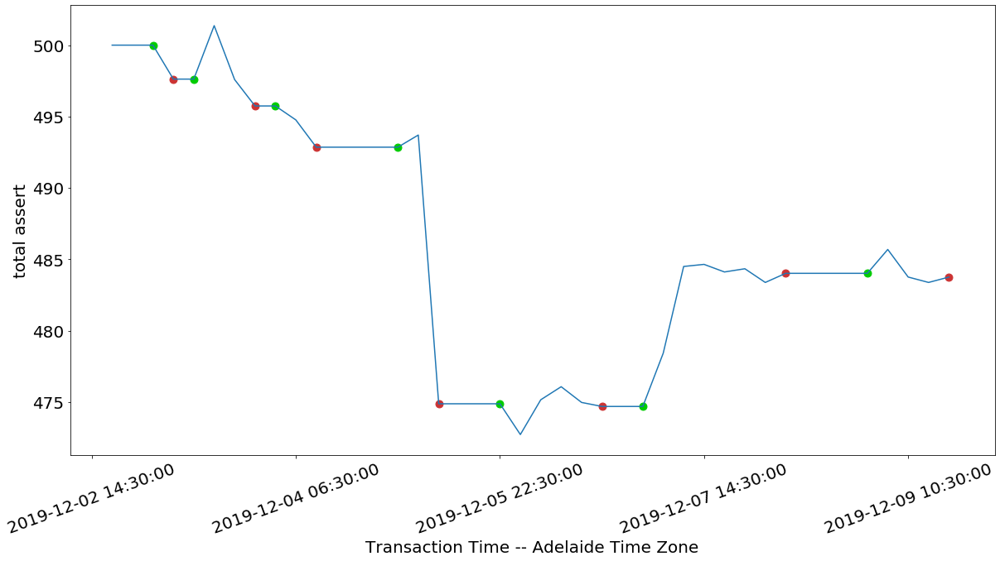

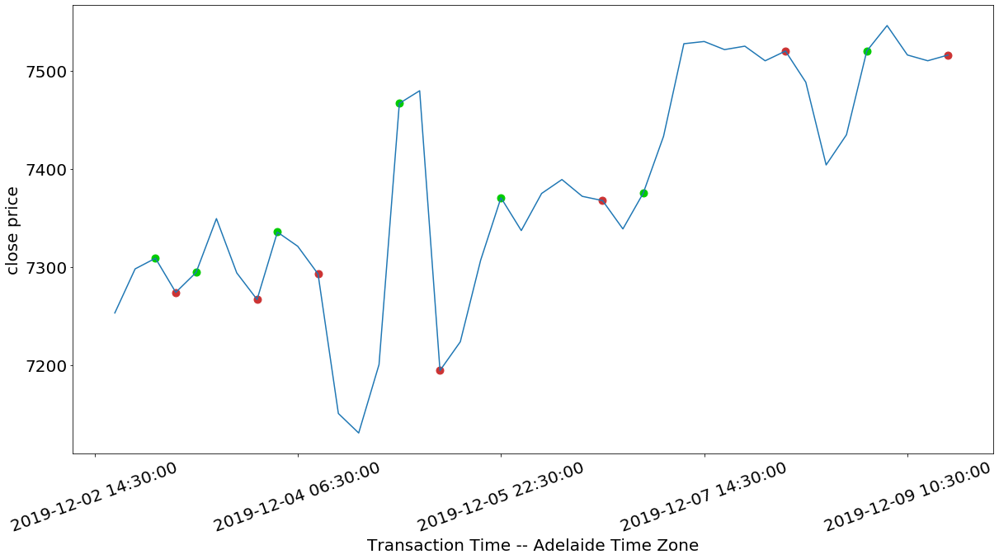

{Timestamp('2019-12-02 22:30:00'): 1, Timestamp('2019-12-03 02:30:00'): 2, Timestamp('2019-12-03 06:30:00'): 1, Timestamp('2019-12-03 18:30:00'): 2, Timestamp('2019-12-03 22:30:00'): 1, Timestamp('2019-12-04 06:30:00'): 2, Timestamp('2019-12-04 22:30:00'): 1, Timestamp('2019-12-05 06:30:00'): 2, Timestamp('2019-12-05 18:30:00'): 1, Timestamp('2019-12-06 14:30:00'): 2, Timestamp('2019-12-06 22:30:00'): 1, Timestamp('2019-12-08 02:30:00'): 2, Timestamp('2019-12-08 18:30:00'): 1, Timestamp('2019-12-09 10:30:00'): 2}


In [18]:
record = {}
run_bot('4h','4 hour','7 days ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-10-11 16:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 30
Current Money:0.00263989000006859
Current Bitcoin: 0.06439299999999999
Current BNB: 4.27234384154625
Return on Investment is:11.728558197937692%
Current Total Assert is: 659.1984933678324


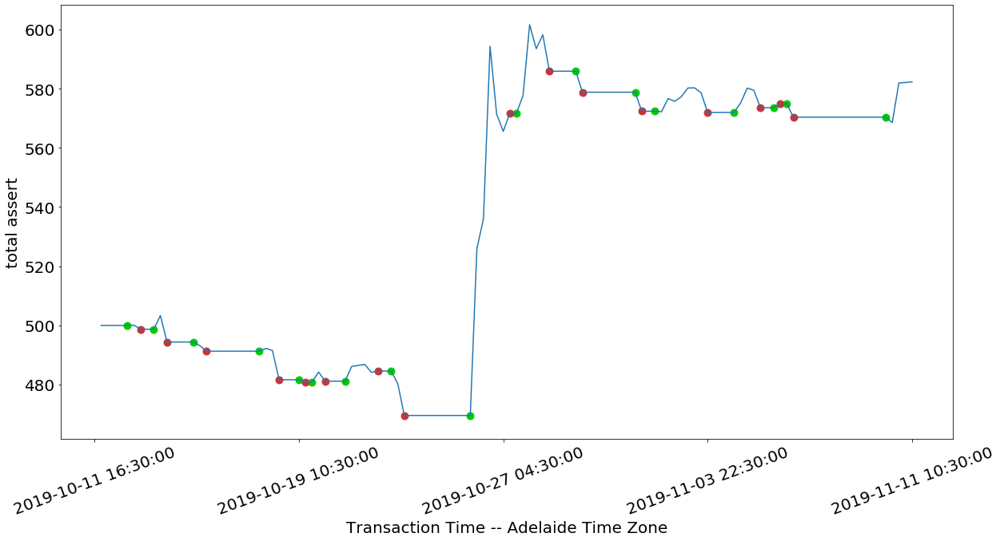

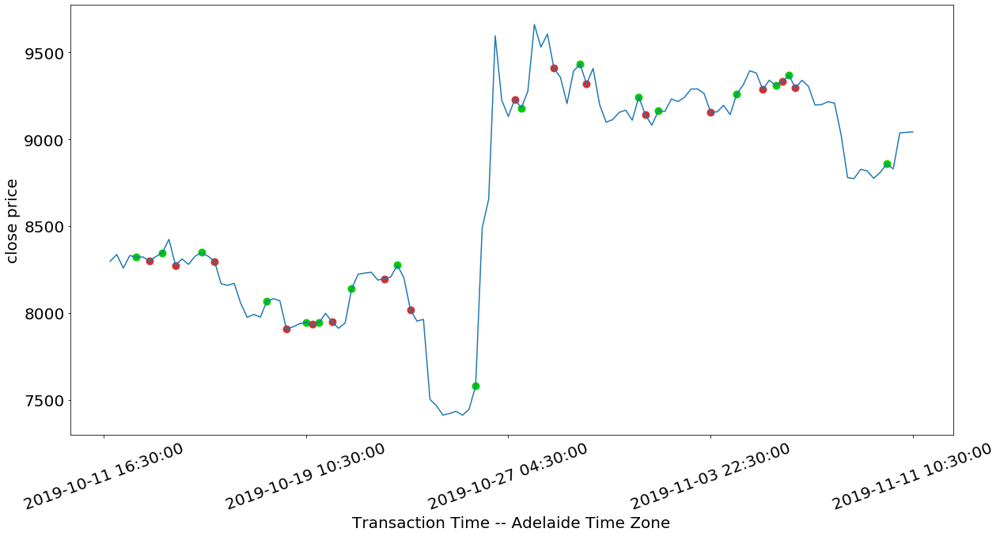

{Timestamp('2019-10-12 16:30:00'): 1, Timestamp('2019-10-13 04:30:00'): 2, Timestamp('2019-10-13 16:30:00'): 1, Timestamp('2019-10-14 04:30:00'): 2, Timestamp('2019-10-15 04:30:00'): 1, Timestamp('2019-10-15 16:30:00'): 2, Timestamp('2019-10-17 16:30:00'): 1, Timestamp('2019-10-18 10:30:00'): 2, Timestamp('2019-10-19 04:30:00'): 1, Timestamp('2019-10-19 10:30:00'): 2, Timestamp('2019-10-19 16:30:00'): 1, Timestamp('2019-10-20 04:30:00'): 2, Timestamp('2019-10-20 22:30:00'): 1, Timestamp('2019-10-22 04:30:00'): 2, Timestamp('2019-10-22 16:30:00'): 1, Timestamp('2019-10-23 04:30:00'): 2, Timestamp('2019-10-25 16:30:00'): 1, Timestamp('2019-10-27 04:30:00'): 2, Timestamp('2019-10-27 10:30:00'): 1, Timestamp('2019-10-28 16:30:00'): 2, Timestamp('2019-10-29 16:30:00'): 1, Timestamp('2019-10-29 22:30:00'): 2, Timestamp('2019-10-31 22:30:00'): 1, Timestamp('2019-11-01 04:30:00'): 2, Timestamp('2019-11-01 16:30:00'): 1, Timestamp('2019-11-03 16:30:00'): 2, Timestamp('2019-11-04 16:30:00'): 1, 

In [21]:
record = {}
run_bot('6h','6 hour','1 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-10-11 22:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 30
Current Money:0.008701119999841467
Current Bitcoin: 0.054007
Current BNB: 4.614896770762084
Return on Investment is:-3.187228912929274%
Current Total Assert is: 571.1953494137173


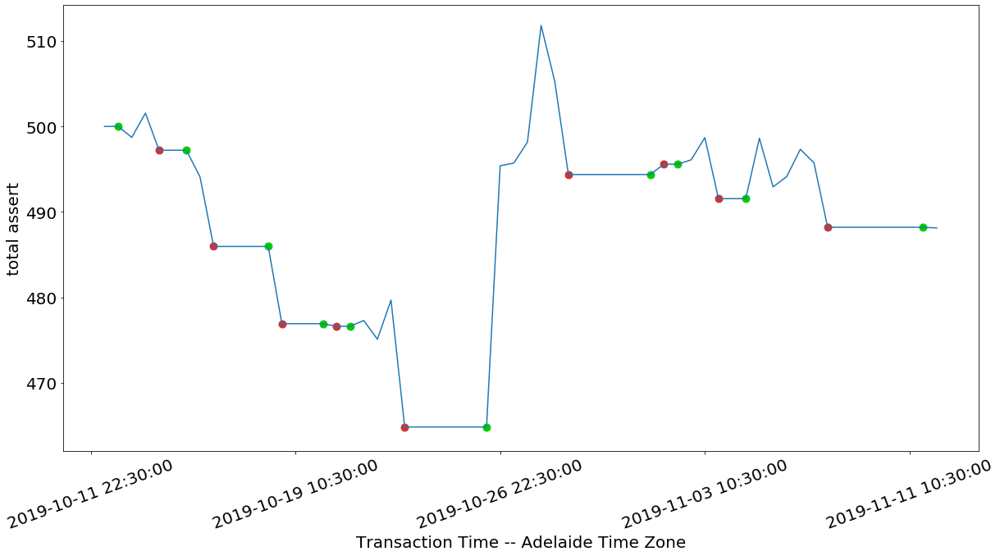

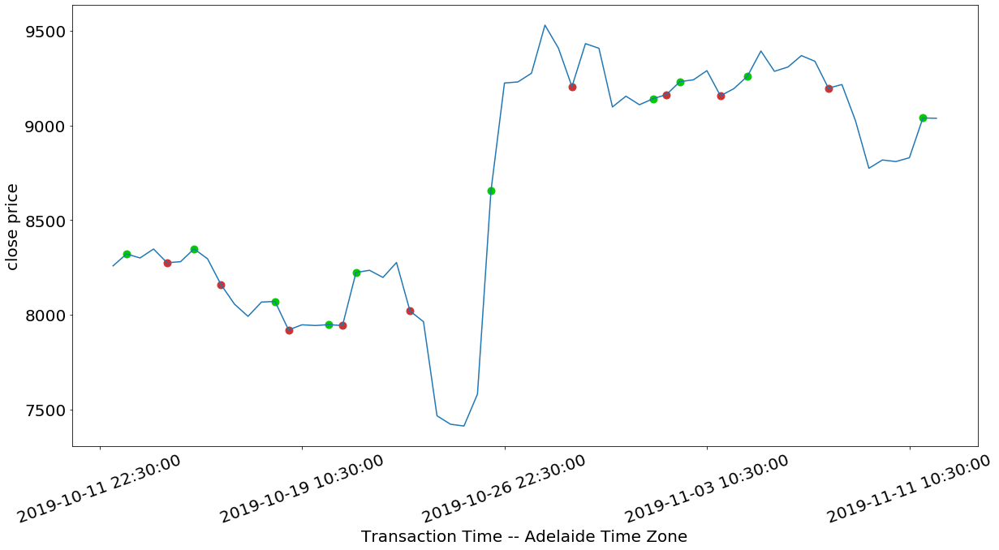

{Timestamp('2019-10-12 10:30:00'): 1, Timestamp('2019-10-13 22:30:00'): 2, Timestamp('2019-10-14 22:30:00'): 1, Timestamp('2019-10-15 22:30:00'): 2, Timestamp('2019-10-17 22:30:00'): 1, Timestamp('2019-10-18 10:30:00'): 2, Timestamp('2019-10-19 22:30:00'): 1, Timestamp('2019-10-20 10:30:00'): 2, Timestamp('2019-10-20 22:30:00'): 1, Timestamp('2019-10-22 22:30:00'): 2, Timestamp('2019-10-25 22:30:00'): 1, Timestamp('2019-10-28 22:30:00'): 2, Timestamp('2019-10-31 22:30:00'): 1, Timestamp('2019-11-01 10:30:00'): 2, Timestamp('2019-11-01 22:30:00'): 1, Timestamp('2019-11-03 10:30:00'): 2, Timestamp('2019-11-04 10:30:00'): 1, Timestamp('2019-11-07 10:30:00'): 2, Timestamp('2019-11-10 22:30:00'): 1}


In [22]:
record = {}
run_bot('12h','12 hour','1 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-10-12 10:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 30
Current Money:0.0011414000000513624
Current Bitcoin: 0.056582
Current BNB: 4.8529052841225
Return on Investment is:1.5374338566449157%
Current Total Assert is: 599.070859754205


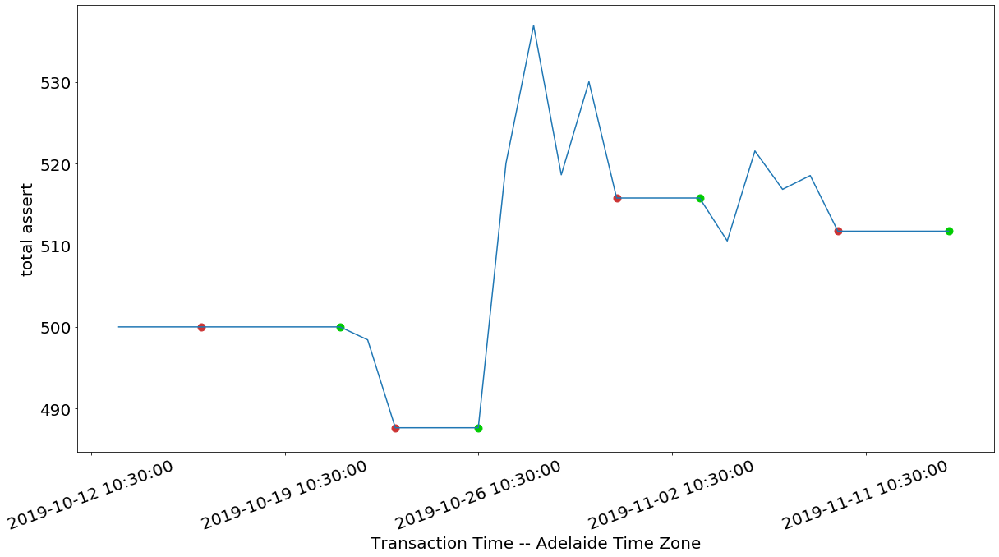

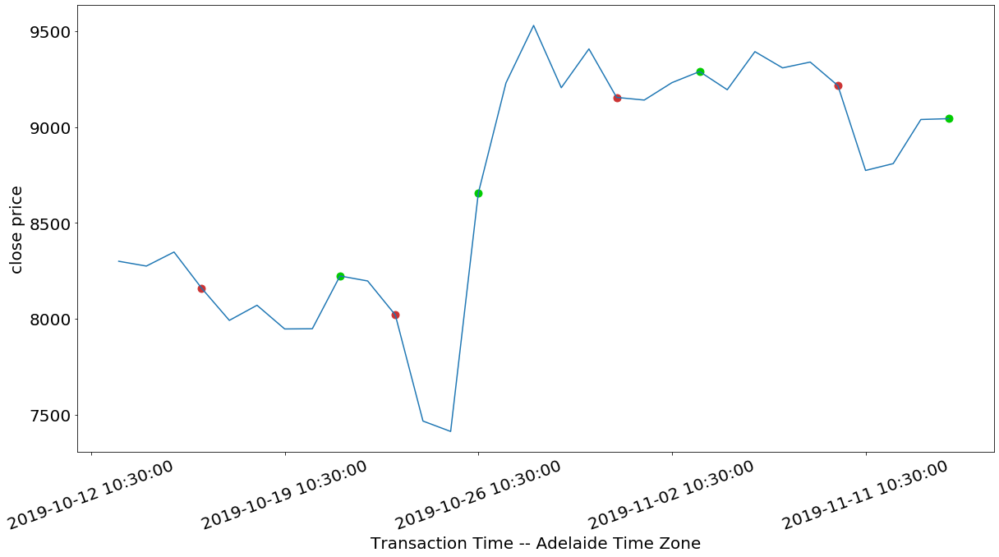

{Timestamp('2019-10-20 10:30:00'): 1, Timestamp('2019-10-22 10:30:00'): 2, Timestamp('2019-10-25 10:30:00'): 1, Timestamp('2019-10-30 10:30:00'): 2, Timestamp('2019-11-02 10:30:00'): 1, Timestamp('2019-11-07 10:30:00'): 2, Timestamp('2019-11-11 10:30:00'): 1}


In [23]:
record = {}
run_bot('1d','1 day','1 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-09-11 11:30:00
Investment End Time:2019-11-11 11:30:00
Investment Periods: 61
Current Money:0.0017357099995365388
Current Bitcoin: 0.053216
Current BNB: -0.002048094172500351
Return on Investment is:-18.484995211034832%
Current Total Assert is: 480.9385282548945
Trading curb occured


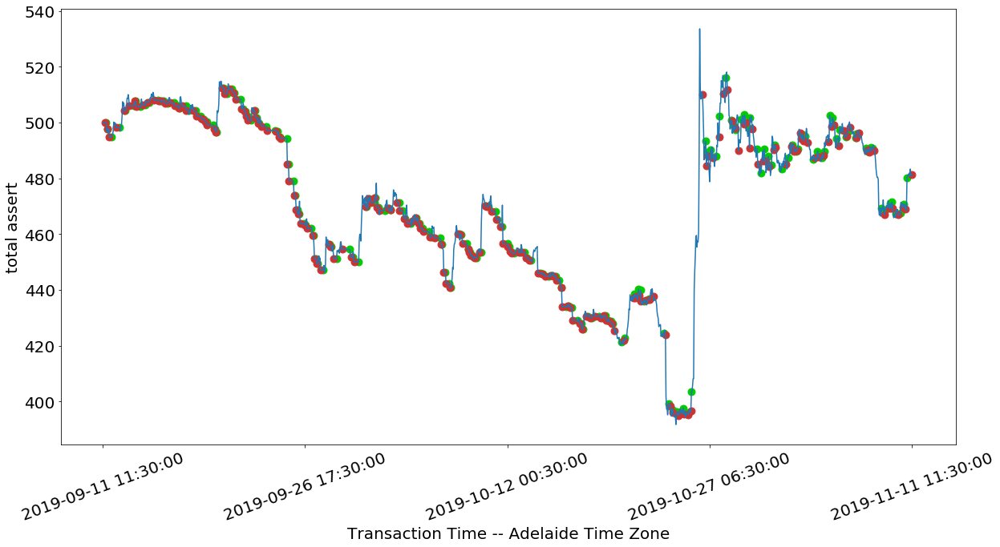

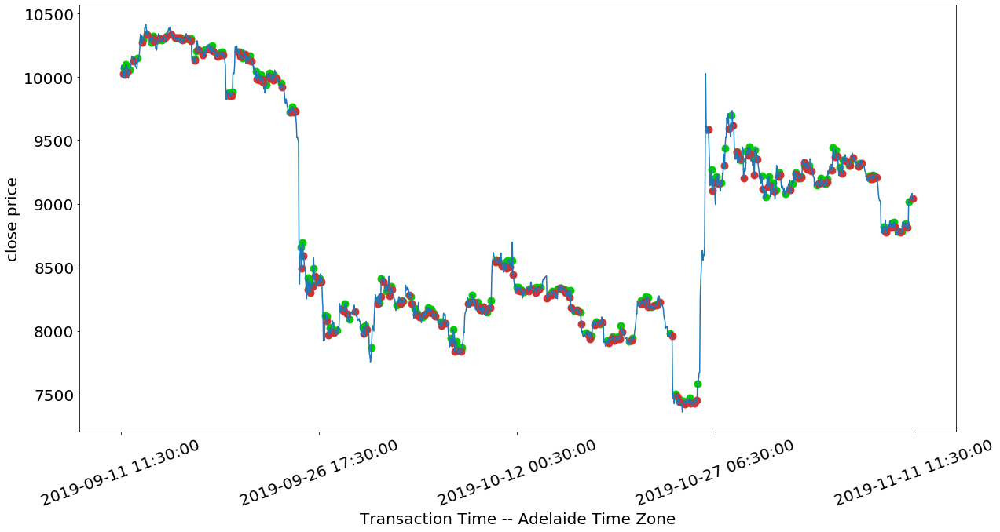

{Timestamp('2019-09-11 16:30:00'): 1, Timestamp('2019-09-11 18:30:00'): 2, Timestamp('2019-09-11 19:30:00'): 1, Timestamp('2019-09-11 22:30:00'): 2, Timestamp('2019-09-12 02:30:00'): 1, Timestamp('2019-09-12 10:30:00'): 2, Timestamp('2019-09-12 17:30:00'): 1, Timestamp('2019-09-13 01:30:00'): 2, Timestamp('2019-09-13 03:30:00'): 1, Timestamp('2019-09-13 10:30:00'): 2, Timestamp('2019-09-13 19:30:00'): 1, Timestamp('2019-09-13 20:30:00'): 2, Timestamp('2019-09-13 21:30:00'): 1, Timestamp('2019-09-13 23:30:00'): 2, Timestamp('2019-09-14 06:30:00'): 1, Timestamp('2019-09-14 10:30:00'): 2, Timestamp('2019-09-14 14:30:00'): 1, Timestamp('2019-09-14 19:30:00'): 2, Timestamp('2019-09-14 22:30:00'): 1, Timestamp('2019-09-15 07:30:00'): 2, Timestamp('2019-09-15 14:30:00'): 1, Timestamp('2019-09-15 16:30:00'): 2, Timestamp('2019-09-15 19:30:00'): 1, Timestamp('2019-09-15 21:30:00'): 2, Timestamp('2019-09-16 00:30:00'): 1, Timestamp('2019-09-16 03:30:00'): 2, Timestamp('2019-09-16 07:30:00'): 1, 

In [24]:
record = {}
run_bot('1h','1 hour','2 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-09-11 11:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 60
Current Money:0.007202309999570389
Current Bitcoin: 0.057762999999999995
Current BNB: 1.0356514739366718
Return on Investment is:-8.348598284600065%
Current Total Assert is: 540.7432701208596


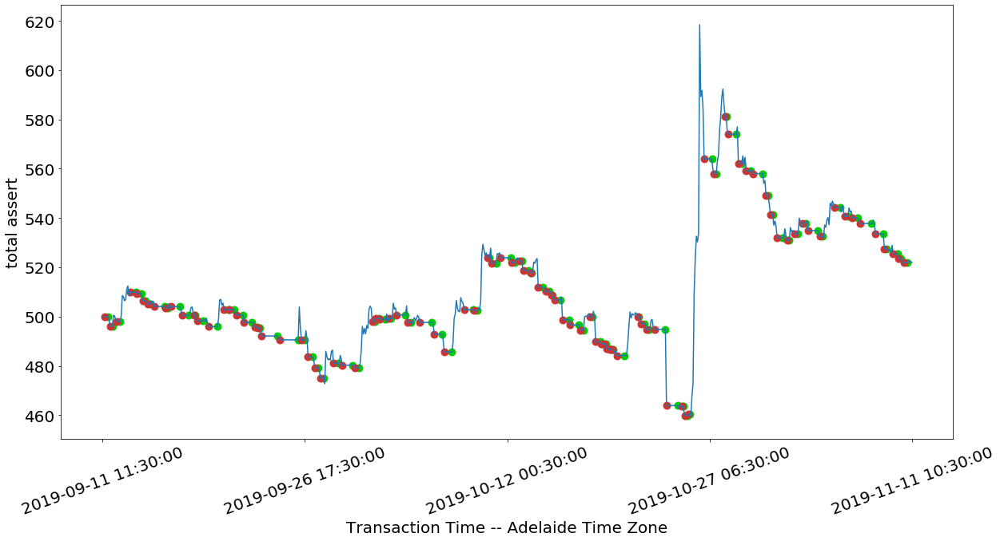

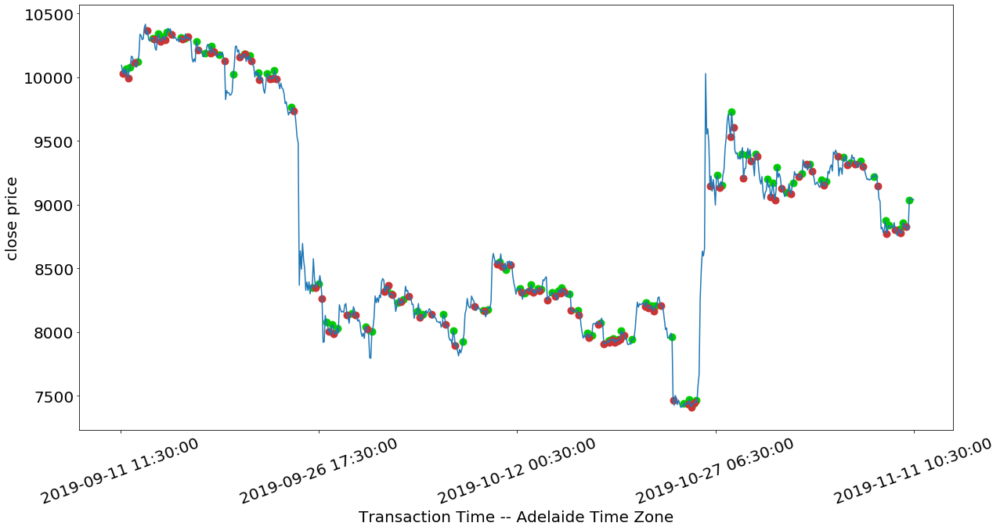

{Timestamp('2019-09-11 19:30:00'): 1, Timestamp('2019-09-11 23:30:00'): 2, Timestamp('2019-09-12 03:30:00'): 1, Timestamp('2019-09-12 11:30:00'): 2, Timestamp('2019-09-12 17:30:00'): 1, Timestamp('2019-09-13 11:30:00'): 2, Timestamp('2019-09-13 21:30:00'): 1, Timestamp('2019-09-13 23:30:00'): 2, Timestamp('2019-09-14 07:30:00'): 1, Timestamp('2019-09-14 11:30:00'): 2, Timestamp('2019-09-14 15:30:00'): 1, Timestamp('2019-09-14 19:30:00'): 2, Timestamp('2019-09-14 23:30:00'): 1, Timestamp('2019-09-15 07:30:00'): 2, Timestamp('2019-09-16 01:30:00'): 1, Timestamp('2019-09-16 03:30:00'): 2, Timestamp('2019-09-16 07:30:00'): 1, Timestamp('2019-09-16 13:30:00'): 2, Timestamp('2019-09-17 05:30:00'): 1, Timestamp('2019-09-17 09:30:00'): 2, Timestamp('2019-09-17 21:30:00'): 1, Timestamp('2019-09-18 07:30:00'): 2, Timestamp('2019-09-18 09:30:00'): 1, Timestamp('2019-09-18 13:30:00'): 2, Timestamp('2019-09-18 23:30:00'): 1, Timestamp('2019-09-19 09:30:00'): 2, Timestamp('2019-09-20 01:30:00'): 1, 

In [25]:
record = {}
run_bot('2h','2 hour','2 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-09-11 13:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 60
Current Money:0.007238980000408901
Current Bitcoin: 0.056262
Current BNB: 2.9184241834516618
Return on Investment is:-4.901817413198237%
Current Total Assert is: 561.0792772621304


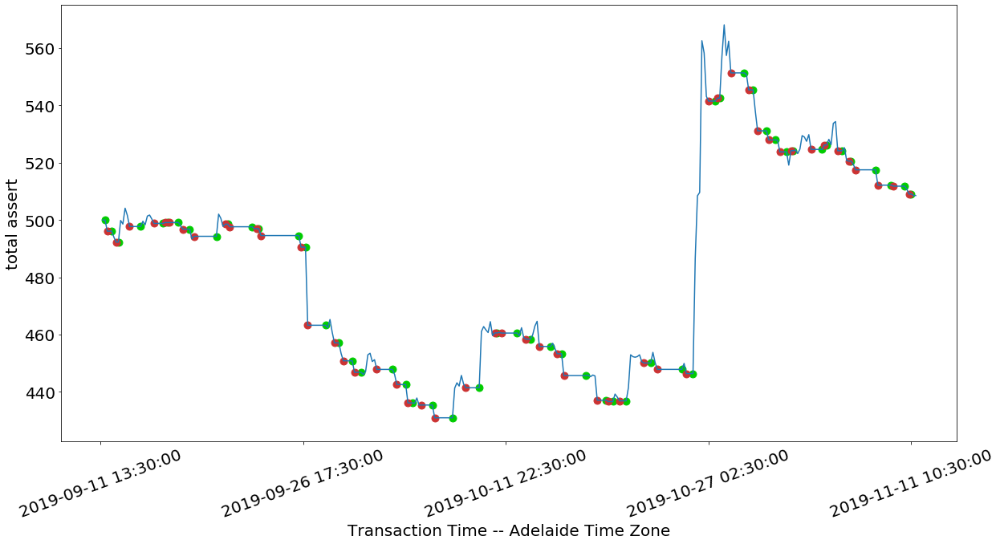

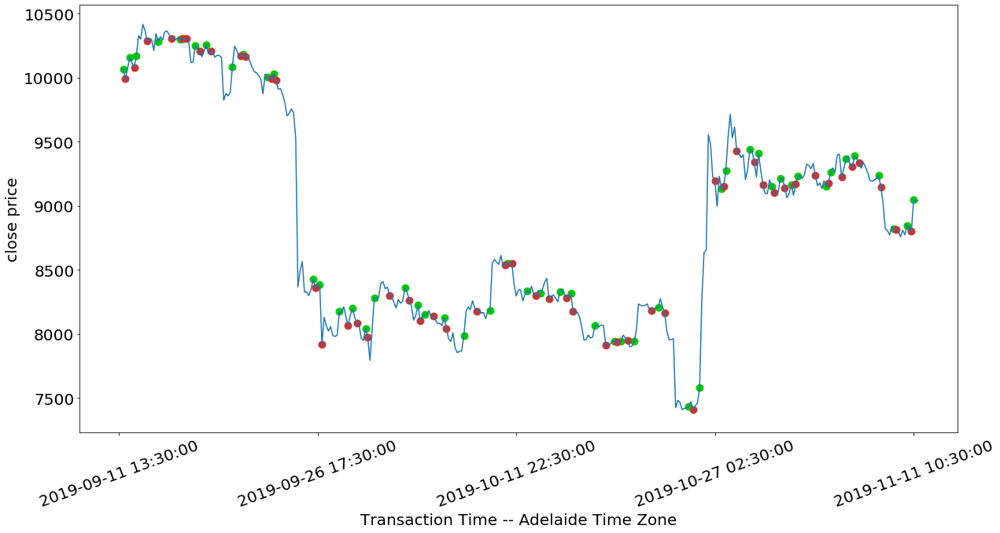

{Timestamp('2019-09-11 17:30:00'): 1, Timestamp('2019-09-11 21:30:00'): 2, Timestamp('2019-09-12 05:30:00'): 1, Timestamp('2019-09-12 13:30:00'): 2, Timestamp('2019-09-12 17:30:00'): 1, Timestamp('2019-09-13 13:30:00'): 2, Timestamp('2019-09-14 09:30:00'): 1, Timestamp('2019-09-15 09:30:00'): 2, Timestamp('2019-09-16 01:30:00'): 1, Timestamp('2019-09-16 05:30:00'): 2, Timestamp('2019-09-16 09:30:00'): 1, Timestamp('2019-09-16 13:30:00'): 2, Timestamp('2019-09-17 05:30:00'): 1, Timestamp('2019-09-17 13:30:00'): 2, Timestamp('2019-09-18 01:30:00'): 1, Timestamp('2019-09-18 09:30:00'): 2, Timestamp('2019-09-20 01:30:00'): 1, Timestamp('2019-09-20 17:30:00'): 2, Timestamp('2019-09-20 21:30:00'): 1, Timestamp('2019-09-21 01:30:00'): 2, Timestamp('2019-09-22 17:30:00'): 1, Timestamp('2019-09-23 01:30:00'): 2, Timestamp('2019-09-23 05:30:00'): 1, Timestamp('2019-09-23 09:30:00'): 2, Timestamp('2019-09-26 05:30:00'): 1, Timestamp('2019-09-26 09:30:00'): 2, Timestamp('2019-09-26 17:30:00'): 1, 

In [26]:
record = {}
run_bot('4h','4 hour','2 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-09-11 15:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 60
Current Money:0.00833345000035024
Current Bitcoin: 0.061992
Current BNB: 3.7322482764525002
Return on Investment is:6.359571543414481%
Current Total Assert is: 627.5214721061454


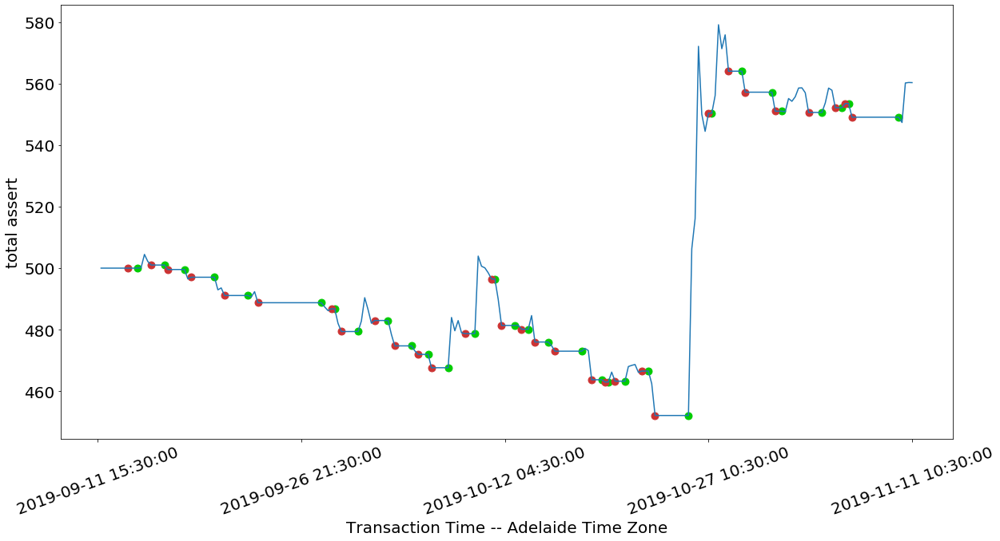

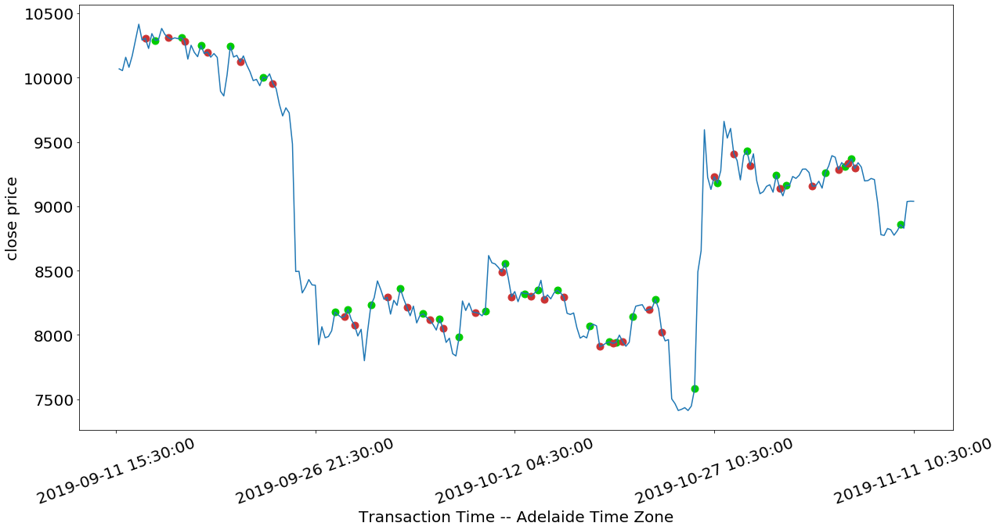

{Timestamp('2019-09-14 09:30:00'): 1, Timestamp('2019-09-15 09:30:00'): 2, Timestamp('2019-09-16 09:30:00'): 1, Timestamp('2019-09-16 15:30:00'): 2, Timestamp('2019-09-17 21:30:00'): 1, Timestamp('2019-09-18 09:30:00'): 2, Timestamp('2019-09-20 03:30:00'): 1, Timestamp('2019-09-20 21:30:00'): 2, Timestamp('2019-09-22 15:30:00'): 1, Timestamp('2019-09-23 09:30:00'): 2, Timestamp('2019-09-28 03:30:00'): 1, Timestamp('2019-09-28 21:30:00'): 2, Timestamp('2019-09-29 03:30:00'): 1, Timestamp('2019-09-29 15:30:00'): 2, Timestamp('2019-09-30 21:30:00'): 1, Timestamp('2019-10-02 03:30:00'): 2, Timestamp('2019-10-03 03:30:00'): 1, Timestamp('2019-10-03 15:30:00'): 2, Timestamp('2019-10-04 21:30:00'): 1, Timestamp('2019-10-05 09:30:00'): 2, Timestamp('2019-10-06 04:30:00'): 1, Timestamp('2019-10-06 10:30:00'): 2, Timestamp('2019-10-07 16:30:00'): 1, Timestamp('2019-10-08 22:30:00'): 2, Timestamp('2019-10-09 16:30:00'): 1, Timestamp('2019-10-10 22:30:00'): 2, Timestamp('2019-10-11 04:30:00'): 1, 

In [27]:
record = {}
run_bot('6h','6 hour','2 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-09-11 21:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 60
Current Money:0.004566669999860551
Current Bitcoin: 0.052511999999999996
Current BNB: 4.42114846124125
Return on Investment is:-6.062681448755538%
Current Total Assert is: 554.2301794523423


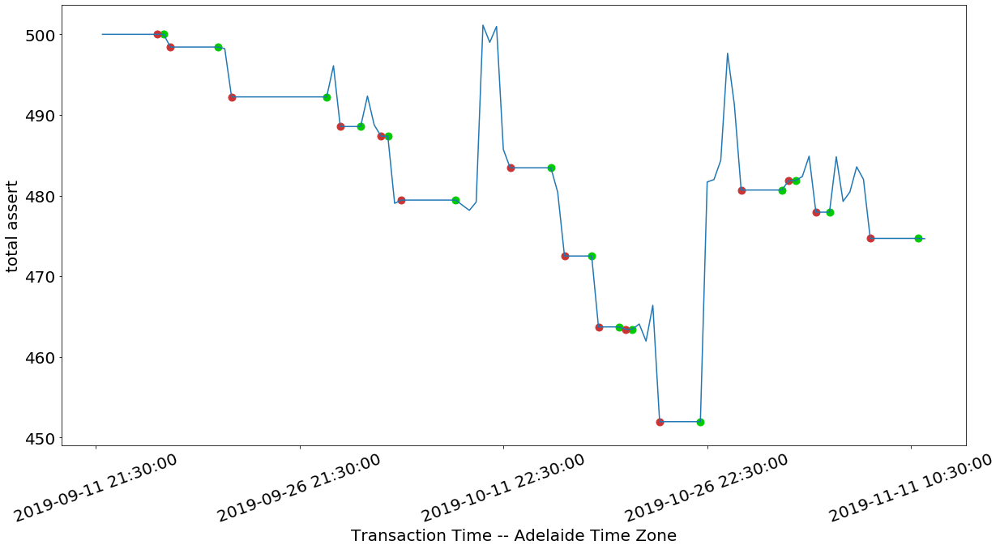

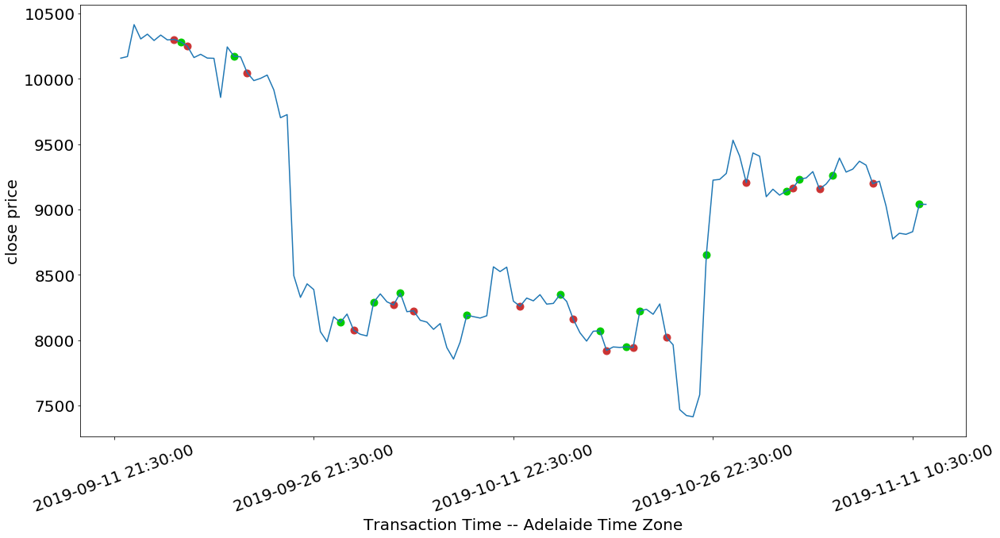

{Timestamp('2019-09-16 09:30:00'): 1, Timestamp('2019-09-16 21:30:00'): 2, Timestamp('2019-09-20 09:30:00'): 1, Timestamp('2019-09-21 09:30:00'): 2, Timestamp('2019-09-28 09:30:00'): 1, Timestamp('2019-09-29 09:30:00'): 2, Timestamp('2019-09-30 21:30:00'): 1, Timestamp('2019-10-02 09:30:00'): 2, Timestamp('2019-10-02 21:30:00'): 1, Timestamp('2019-10-03 21:30:00'): 2, Timestamp('2019-10-07 22:30:00'): 1, Timestamp('2019-10-11 22:30:00'): 2, Timestamp('2019-10-14 22:30:00'): 1, Timestamp('2019-10-15 22:30:00'): 2, Timestamp('2019-10-17 22:30:00'): 1, Timestamp('2019-10-18 10:30:00'): 2, Timestamp('2019-10-19 22:30:00'): 1, Timestamp('2019-10-20 10:30:00'): 2, Timestamp('2019-10-20 22:30:00'): 1, Timestamp('2019-10-22 22:30:00'): 2, Timestamp('2019-10-25 22:30:00'): 1, Timestamp('2019-10-28 22:30:00'): 2, Timestamp('2019-10-31 22:30:00'): 1, Timestamp('2019-11-01 10:30:00'): 2, Timestamp('2019-11-01 22:30:00'): 1, Timestamp('2019-11-03 10:30:00'): 2, Timestamp('2019-11-04 10:30:00'): 1, 

In [28]:
record = {}
run_bot('12h','12 hour','2 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-09-12 09:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 60
Current Money:0.004465469999843208
Current Bitcoin: 0.055437
Current BNB: 4.733653892643332
Return on Investment is:-0.6281971580373102%
Current Total Assert is: 586.2936367675799


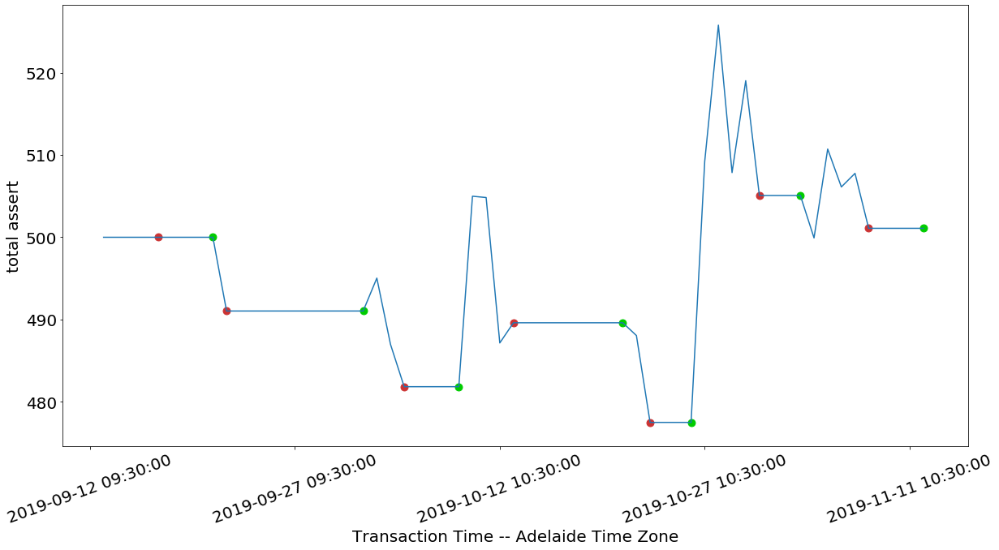

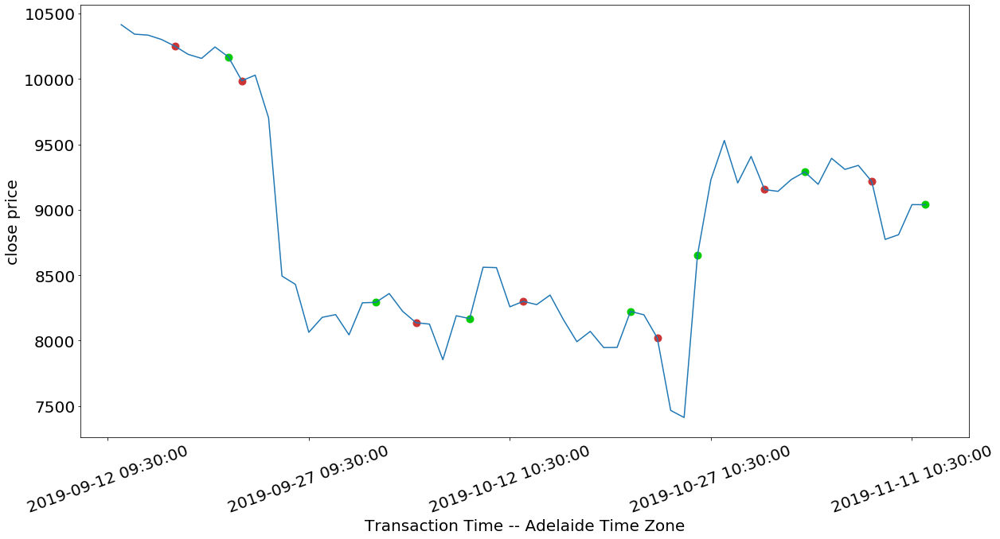

{Timestamp('2019-09-20 09:30:00'): 1, Timestamp('2019-09-21 09:30:00'): 2, Timestamp('2019-10-01 09:30:00'): 1, Timestamp('2019-10-04 09:30:00'): 2, Timestamp('2019-10-08 10:30:00'): 1, Timestamp('2019-10-12 10:30:00'): 2, Timestamp('2019-10-20 10:30:00'): 1, Timestamp('2019-10-22 10:30:00'): 2, Timestamp('2019-10-25 10:30:00'): 1, Timestamp('2019-10-30 10:30:00'): 2, Timestamp('2019-11-02 10:30:00'): 1, Timestamp('2019-11-07 10:30:00'): 2, Timestamp('2019-11-11 10:30:00'): 1}


In [29]:
record = {}
run_bot('1d','1 day','2 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-08-11 11:30:00
Investment End Time:2019-11-11 11:30:00
Investment Periods: 92
Current Money:449.47544546000023
Current Bitcoin: 0
Current BNB: -0.01656762056417061
Return on Investment is:-23.868266391551664%
Current Total Assert is: 449.1772282898452
Trading curb occured


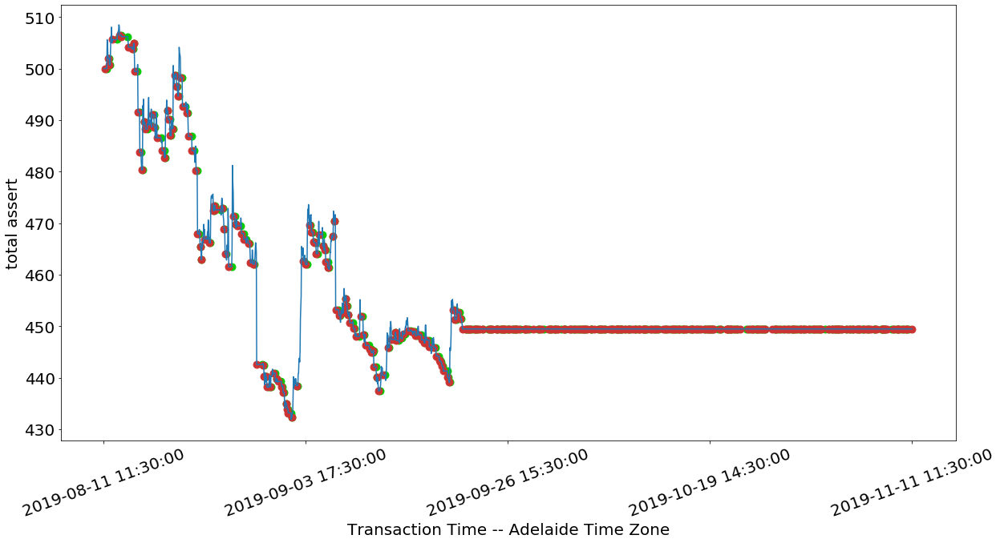

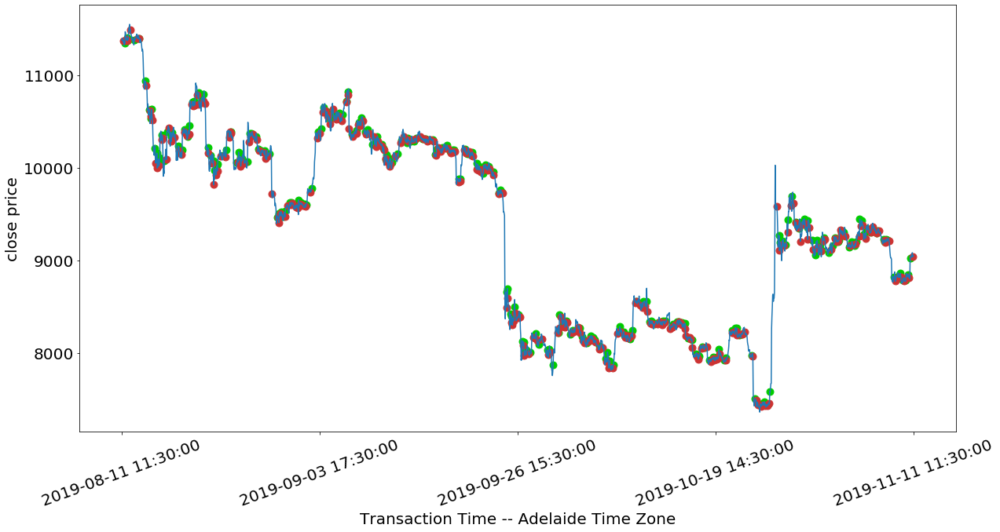

{Timestamp('2019-08-11 19:30:00'): 1, Timestamp('2019-08-11 23:30:00'): 2, Timestamp('2019-08-12 01:30:00'): 1, Timestamp('2019-08-12 02:30:00'): 2, Timestamp('2019-08-12 04:30:00'): 1, Timestamp('2019-08-12 10:30:00'): 2, Timestamp('2019-08-12 22:30:00'): 1, Timestamp('2019-08-13 06:30:00'): 2, Timestamp('2019-08-13 10:30:00'): 1, Timestamp('2019-08-13 11:30:00'): 2, Timestamp('2019-08-14 04:30:00'): 1, Timestamp('2019-08-14 06:30:00'): 2, Timestamp('2019-08-14 15:30:00'): 1, Timestamp('2019-08-14 16:30:00'): 2, Timestamp('2019-08-14 19:30:00'): 1, Timestamp('2019-08-14 20:30:00'): 2, Timestamp('2019-08-14 21:30:00'): 1, Timestamp('2019-08-14 23:30:00'): 2, Timestamp('2019-08-15 06:30:00'): 1, Timestamp('2019-08-15 08:30:00'): 2, Timestamp('2019-08-15 20:30:00'): 1, Timestamp('2019-08-15 21:30:00'): 2, Timestamp('2019-08-16 00:30:00'): 1, Timestamp('2019-08-16 02:30:00'): 2, Timestamp('2019-08-16 04:30:00'): 1, Timestamp('2019-08-16 09:30:00'): 2, Timestamp('2019-08-16 10:30:00'): 1, 

In [30]:
record = {}
run_bot('1h','1 hour','3 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-08-11 11:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 91
Current Money:0.006884110000100918
Current Bitcoin: 0.05798
Current BNB: -0.01722207772957782
Return on Investment is:-11.122339032056312%
Current Total Assert is: 524.3781997108678
Trading curb occured


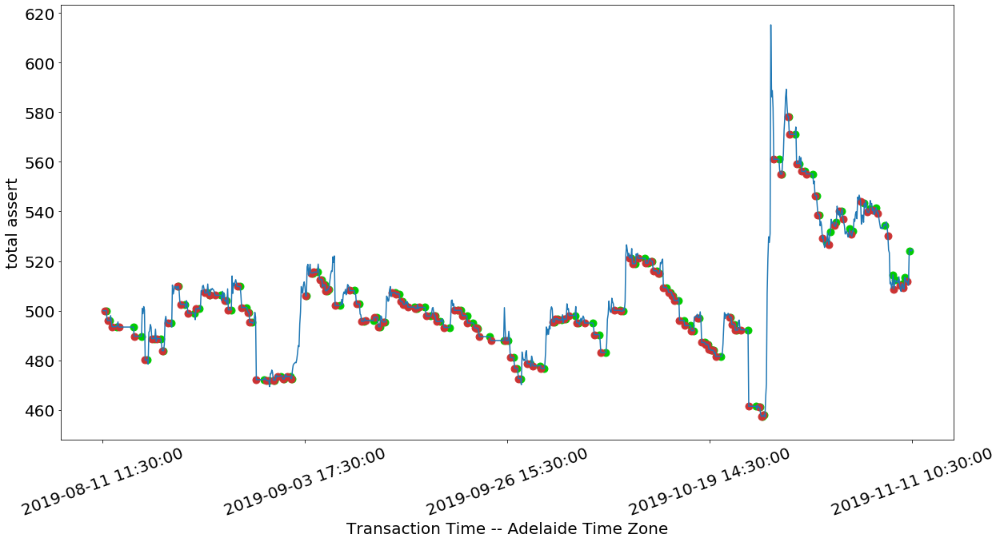

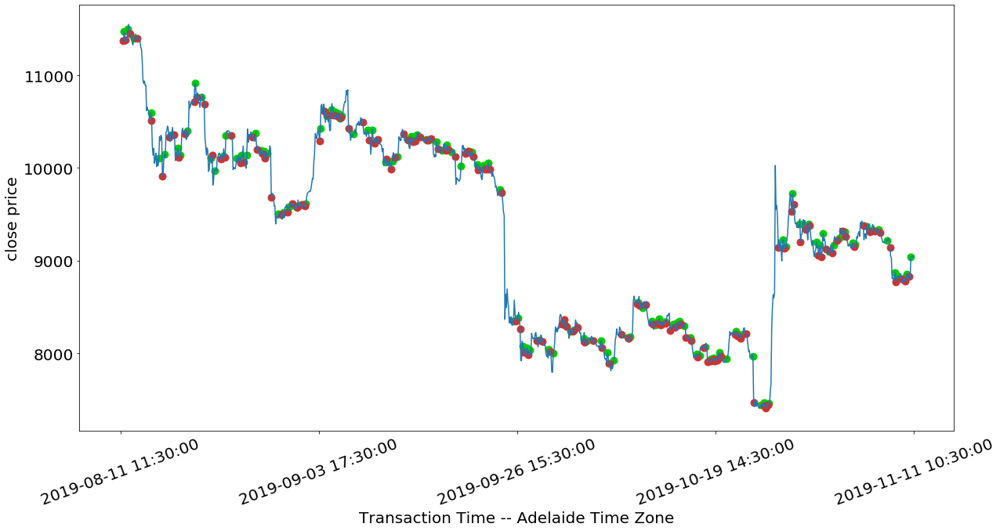

{Timestamp('2019-08-11 19:30:00'): 1, Timestamp('2019-08-11 23:30:00'): 2, Timestamp('2019-08-12 05:30:00'): 1, Timestamp('2019-08-12 11:30:00'): 2, Timestamp('2019-08-12 23:30:00'): 1, Timestamp('2019-08-13 07:30:00'): 2, Timestamp('2019-08-14 21:30:00'): 1, Timestamp('2019-08-14 23:30:00'): 2, Timestamp('2019-08-16 03:30:00'): 1, Timestamp('2019-08-16 13:30:00'): 2, Timestamp('2019-08-16 19:30:00'): 1, Timestamp('2019-08-17 07:30:00'): 2, Timestamp('2019-08-17 15:30:00'): 1, Timestamp('2019-08-17 21:30:00'): 2, Timestamp('2019-08-18 07:30:00'): 1, Timestamp('2019-08-18 11:30:00'): 2, Timestamp('2019-08-18 15:30:00'): 1, Timestamp('2019-08-19 03:30:00'): 2, Timestamp('2019-08-19 11:30:00'): 1, Timestamp('2019-08-20 05:30:00'): 2, Timestamp('2019-08-20 07:30:00'): 1, Timestamp('2019-08-20 13:30:00'): 2, Timestamp('2019-08-21 01:30:00'): 1, Timestamp('2019-08-21 09:30:00'): 2, Timestamp('2019-08-22 03:30:00'): 1, Timestamp('2019-08-22 07:30:00'): 2, Timestamp('2019-08-22 15:30:00'): 1, 

In [31]:
record = {}
run_bot('2h','2 hour','3 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-08-11 13:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 91
Current Money:0.0016610199999718134
Current Bitcoin: 0.051063
Current BNB: 1.994687810017502
Return on Investment is:-15.588781084692377%
Current Total Assert is: 498.026191600315
Trading curb occured


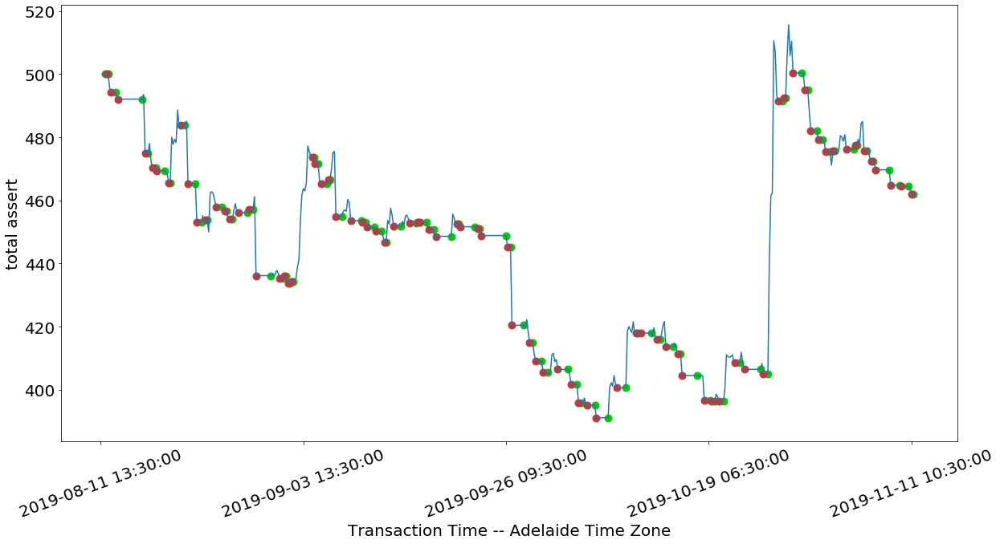

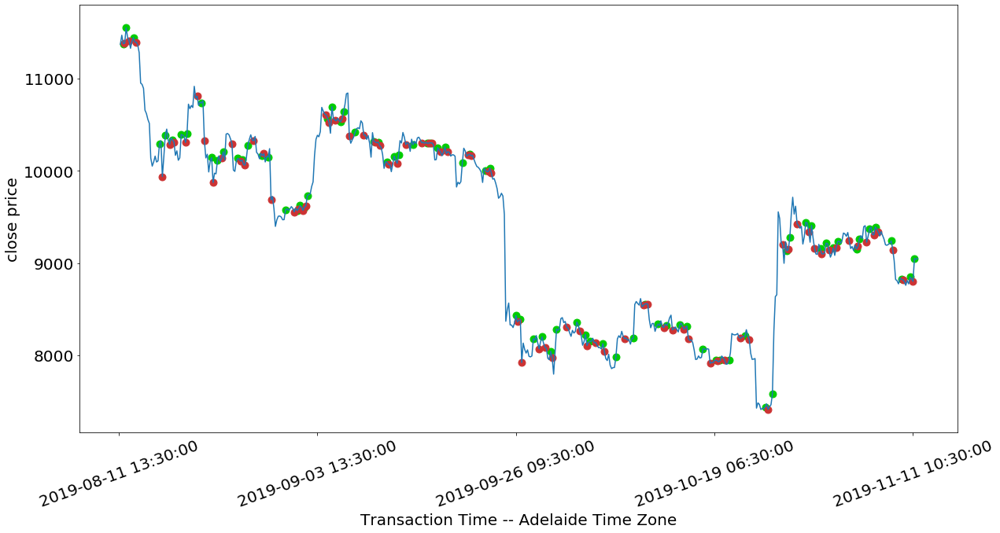

{Timestamp('2019-08-11 21:30:00'): 1, Timestamp('2019-08-12 01:30:00'): 2, Timestamp('2019-08-12 05:30:00'): 1, Timestamp('2019-08-12 13:30:00'): 2, Timestamp('2019-08-13 01:30:00'): 1, Timestamp('2019-08-13 09:30:00'): 2, Timestamp('2019-08-16 05:30:00'): 1, Timestamp('2019-08-16 13:30:00'): 2, Timestamp('2019-08-16 21:30:00'): 1, Timestamp('2019-08-17 09:30:00'): 2, Timestamp('2019-08-17 17:30:00'): 1, Timestamp('2019-08-17 21:30:00'): 2, Timestamp('2019-08-18 17:30:00'): 1, Timestamp('2019-08-19 05:30:00'): 2, Timestamp('2019-08-19 09:30:00'): 1, Timestamp('2019-08-20 13:30:00'): 2, Timestamp('2019-08-21 01:30:00'): 1, Timestamp('2019-08-21 09:30:00'): 2, Timestamp('2019-08-22 05:30:00'): 1, Timestamp('2019-08-22 09:30:00'): 2, Timestamp('2019-08-22 21:30:00'): 1, Timestamp('2019-08-23 09:30:00'): 2, Timestamp('2019-08-23 13:30:00'): 1, Timestamp('2019-08-24 13:30:00'): 2, Timestamp('2019-08-25 05:30:00'): 1, Timestamp('2019-08-25 13:30:00'): 2, Timestamp('2019-08-25 17:30:00'): 1, 

In [32]:
record = {}
run_bot('4h','4 hour','3 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-08-11 15:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 91
Current Money:0.003835850000427854
Current Bitcoin: 0.056225
Current BNB: 3.208438925133332
Return on Investment is:-3.9674599148473986%
Current Total Assert is: 566.5919865024003


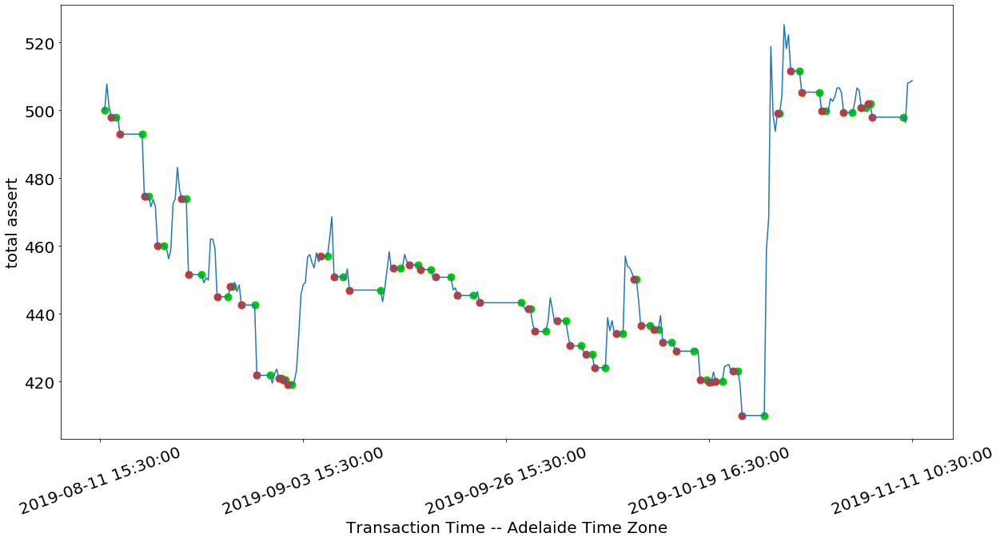

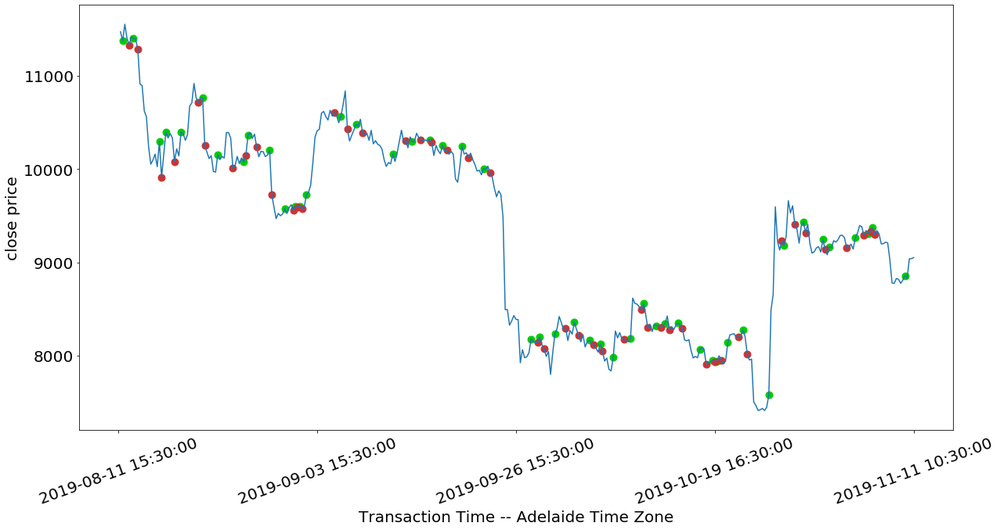

{Timestamp('2019-08-11 21:30:00'): 1, Timestamp('2019-08-12 15:30:00'): 2, Timestamp('2019-08-13 03:30:00'): 1, Timestamp('2019-08-13 15:30:00'): 2, Timestamp('2019-08-16 03:30:00'): 1, Timestamp('2019-08-16 09:30:00'): 2, Timestamp('2019-08-16 21:30:00'): 1, Timestamp('2019-08-17 21:30:00'): 2, Timestamp('2019-08-18 15:30:00'): 1, Timestamp('2019-08-20 15:30:00'): 2, Timestamp('2019-08-21 03:30:00'): 1, Timestamp('2019-08-21 09:30:00'): 2, Timestamp('2019-08-22 21:30:00'): 1, Timestamp('2019-08-24 15:30:00'): 2, Timestamp('2019-08-25 21:30:00'): 1, Timestamp('2019-08-26 03:30:00'): 2, Timestamp('2019-08-26 09:30:00'): 1, Timestamp('2019-08-27 09:30:00'): 2, Timestamp('2019-08-28 21:30:00'): 1, Timestamp('2019-08-29 03:30:00'): 2, Timestamp('2019-08-30 15:30:00'): 1, Timestamp('2019-08-31 15:30:00'): 2, Timestamp('2019-08-31 21:30:00'): 1, Timestamp('2019-09-01 03:30:00'): 2, Timestamp('2019-09-01 09:30:00'): 1, Timestamp('2019-09-01 15:30:00'): 2, Timestamp('2019-09-02 03:30:00'): 1, 

In [33]:
record = {}
run_bot('6h','6 hour','3 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-08-11 21:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 91
Current Money:0.0013008399998852838
Current Bitcoin: 0.053325
Current BNB: 4.169196613178333
Return on Investment is:-5.484979130981366%
Current Total Assert is: 557.6386231272099


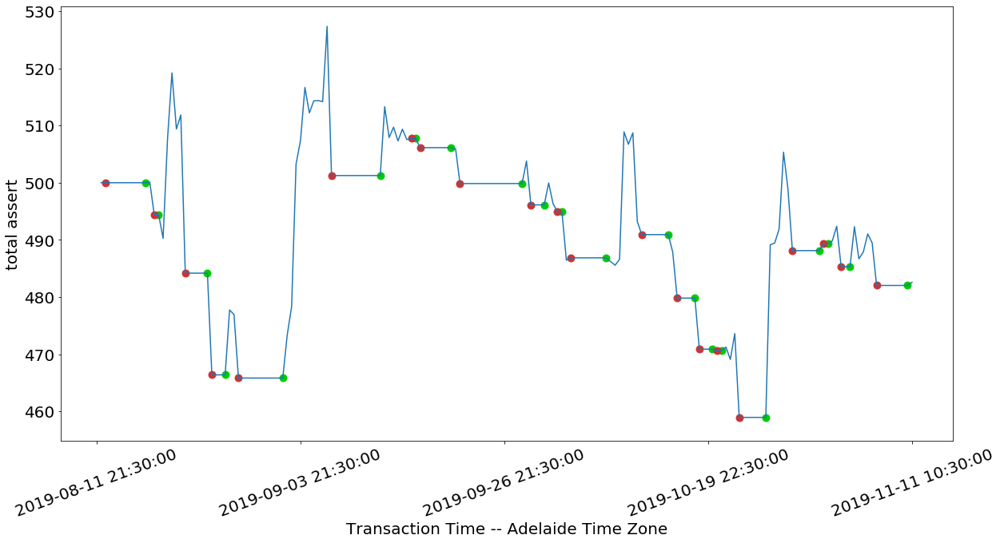

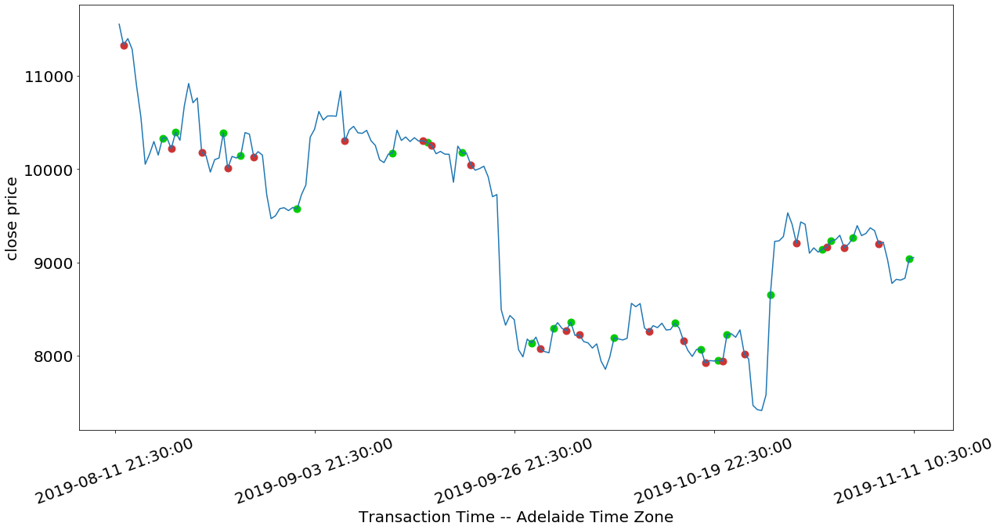

{Timestamp('2019-08-16 21:30:00'): 1, Timestamp('2019-08-17 21:30:00'): 2, Timestamp('2019-08-18 09:30:00'): 1, Timestamp('2019-08-21 09:30:00'): 2, Timestamp('2019-08-23 21:30:00'): 1, Timestamp('2019-08-24 09:30:00'): 2, Timestamp('2019-08-25 21:30:00'): 1, Timestamp('2019-08-27 09:30:00'): 2, Timestamp('2019-09-01 09:30:00'): 1, Timestamp('2019-09-06 21:30:00'): 2, Timestamp('2019-09-12 09:30:00'): 1, Timestamp('2019-09-15 21:30:00'): 2, Timestamp('2019-09-16 09:30:00'): 1, Timestamp('2019-09-16 21:30:00'): 2, Timestamp('2019-09-20 09:30:00'): 1, Timestamp('2019-09-21 09:30:00'): 2, Timestamp('2019-09-28 09:30:00'): 1, Timestamp('2019-09-29 09:30:00'): 2, Timestamp('2019-09-30 21:30:00'): 1, Timestamp('2019-10-02 09:30:00'): 2, Timestamp('2019-10-02 21:30:00'): 1, Timestamp('2019-10-03 21:30:00'): 2, Timestamp('2019-10-07 22:30:00'): 1, Timestamp('2019-10-11 22:30:00'): 2, Timestamp('2019-10-14 22:30:00'): 1, Timestamp('2019-10-15 22:30:00'): 2, Timestamp('2019-10-17 22:30:00'): 1, 

In [34]:
record = {}
run_bot('12h','12 hour','3 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-08-12 09:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 91
Current Money:0.007802869999693485
Current Bitcoin: 0.050259
Current BNB: 4.605059806059166
Return on Investment is:-8.857062378124631%
Current Total Assert is: 537.7433319690647


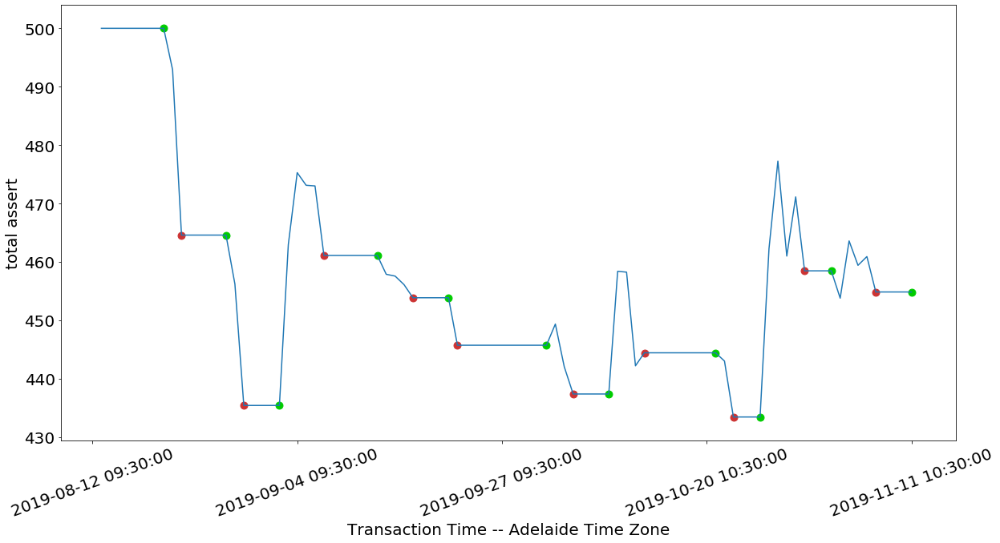

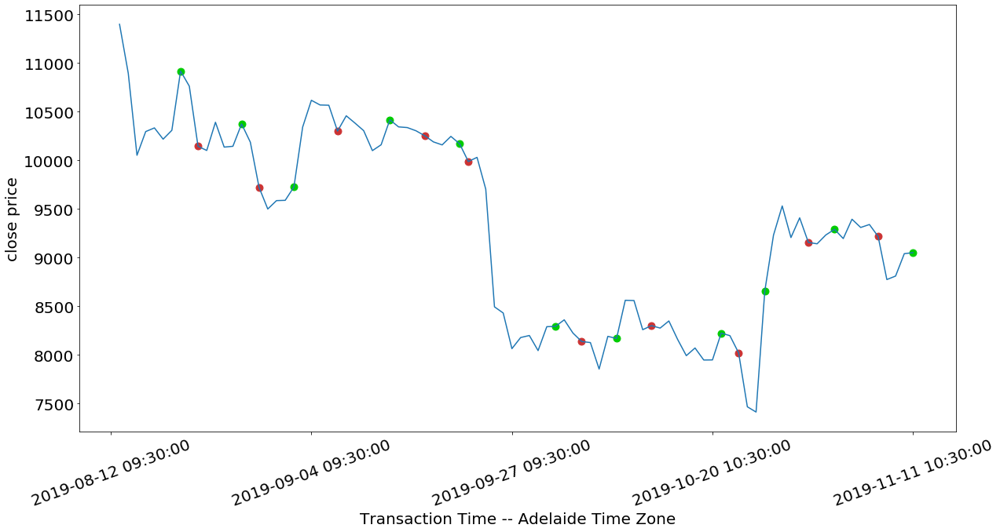

{Timestamp('2019-08-19 09:30:00'): 1, Timestamp('2019-08-21 09:30:00'): 2, Timestamp('2019-08-26 09:30:00'): 1, Timestamp('2019-08-28 09:30:00'): 2, Timestamp('2019-09-01 09:30:00'): 1, Timestamp('2019-09-06 09:30:00'): 2, Timestamp('2019-09-12 09:30:00'): 1, Timestamp('2019-09-16 09:30:00'): 2, Timestamp('2019-09-20 09:30:00'): 1, Timestamp('2019-09-21 09:30:00'): 2, Timestamp('2019-10-01 09:30:00'): 1, Timestamp('2019-10-04 09:30:00'): 2, Timestamp('2019-10-08 10:30:00'): 1, Timestamp('2019-10-12 10:30:00'): 2, Timestamp('2019-10-20 10:30:00'): 1, Timestamp('2019-10-22 10:30:00'): 2, Timestamp('2019-10-25 10:30:00'): 1, Timestamp('2019-10-30 10:30:00'): 2, Timestamp('2019-11-02 10:30:00'): 1, Timestamp('2019-11-07 10:30:00'): 2, Timestamp('2019-11-11 10:30:00'): 1}


In [35]:
record = {}
run_bot('1d','1 day','3 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-07-11 11:30:00
Investment End Time:2019-11-11 11:30:00
Investment Periods: 123
Current Money:443.0034615399995
Current Bitcoin: 0
Current BNB: -0.005589347411664759
Return on Investment is:-24.931719781933985%
Current Total Assert is: 442.9028532865895
Trading curb occured


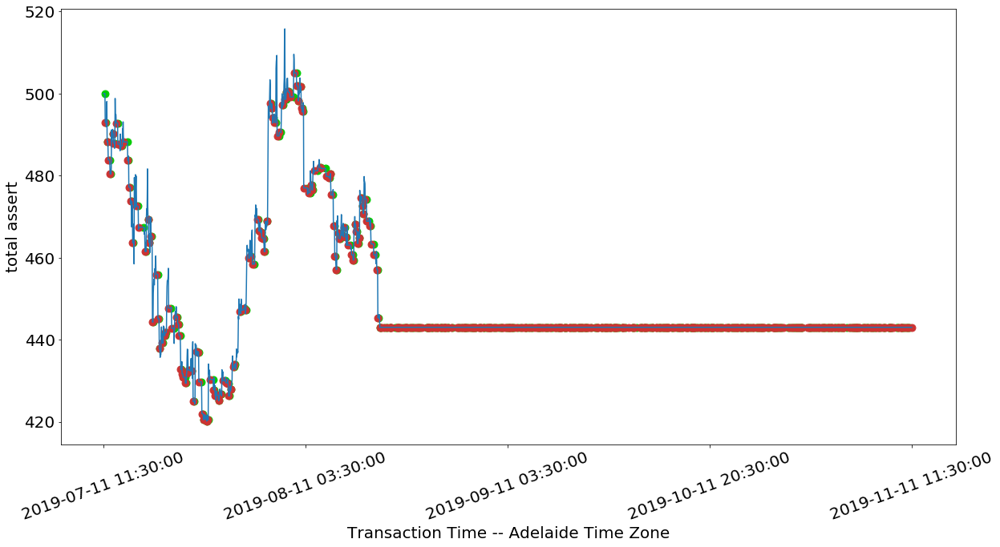

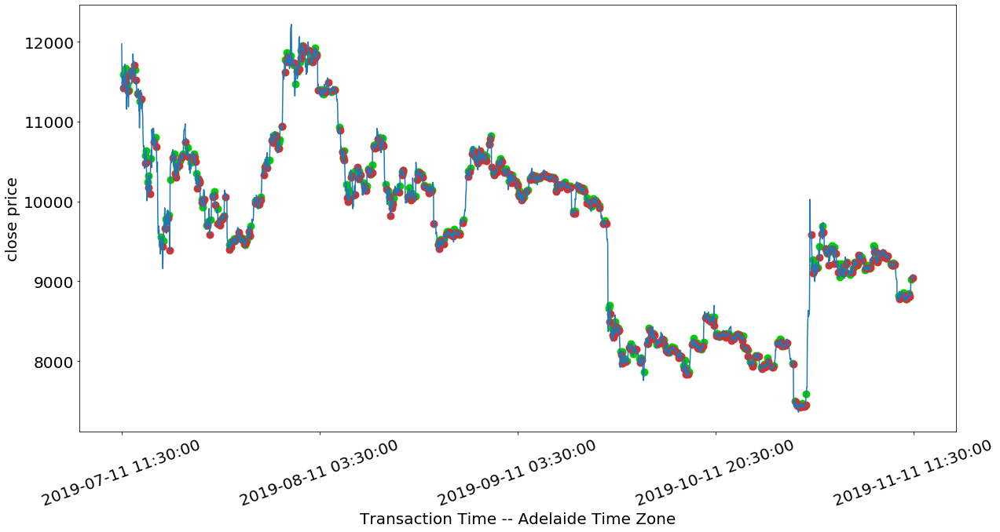

{Timestamp('2019-07-11 16:30:00'): 1, Timestamp('2019-07-11 17:30:00'): 2, Timestamp('2019-07-11 20:30:00'): 1, Timestamp('2019-07-12 00:30:00'): 2, Timestamp('2019-07-12 02:30:00'): 1, Timestamp('2019-07-12 04:30:00'): 2, Timestamp('2019-07-12 09:30:00'): 1, Timestamp('2019-07-12 11:30:00'): 2, Timestamp('2019-07-12 14:30:00'): 1, Timestamp('2019-07-12 21:30:00'): 2, Timestamp('2019-07-12 22:30:00'): 1, Timestamp('2019-07-12 23:30:00'): 2, Timestamp('2019-07-13 02:30:00'): 1, Timestamp('2019-07-13 09:30:00'): 2, Timestamp('2019-07-13 14:30:00'): 1, Timestamp('2019-07-13 15:30:00'): 2, Timestamp('2019-07-13 22:30:00'): 1, Timestamp('2019-07-14 02:30:00'): 2, Timestamp('2019-07-14 07:30:00'): 1, Timestamp('2019-07-14 12:30:00'): 2, Timestamp('2019-07-15 02:30:00'): 1, Timestamp('2019-07-15 03:30:00'): 2, Timestamp('2019-07-15 05:30:00'): 1, Timestamp('2019-07-15 07:30:00'): 2, Timestamp('2019-07-15 12:30:00'): 1, Timestamp('2019-07-15 14:30:00'): 2, Timestamp('2019-07-15 16:30:00'): 1, 

In [36]:
record = {}
run_bot('1h','1 hour','4 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-07-11 11:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 122
Current Money:500.7847983199999
Current Bitcoin: 0
Current BNB: -0.010270935795831524
Return on Investment is:-15.152555682088995%
Current Total Assert is: 500.59992147567493
Trading curb occured


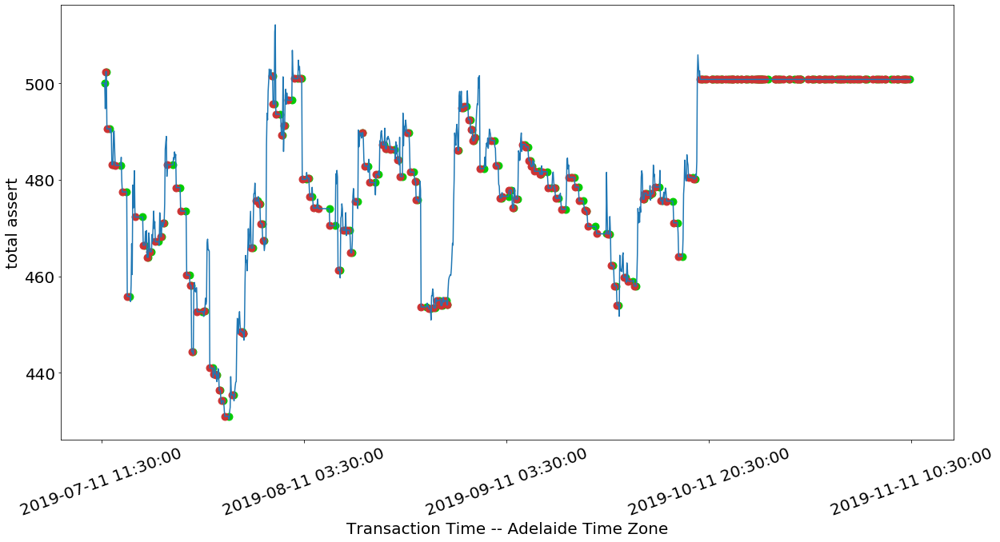

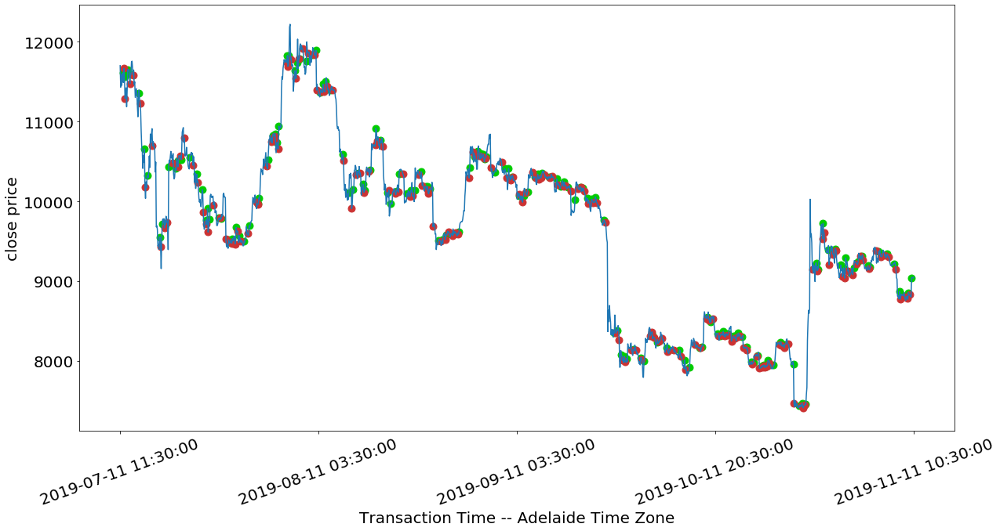

{Timestamp('2019-07-11 21:30:00'): 1, Timestamp('2019-07-12 01:30:00'): 2, Timestamp('2019-07-12 03:30:00'): 1, Timestamp('2019-07-12 05:30:00'): 2, Timestamp('2019-07-12 15:30:00'): 1, Timestamp('2019-07-12 23:30:00'): 2, Timestamp('2019-07-13 03:30:00'): 1, Timestamp('2019-07-13 11:30:00'): 2, Timestamp('2019-07-14 07:30:00'): 1, Timestamp('2019-07-14 13:30:00'): 2, Timestamp('2019-07-15 05:30:00'): 1, Timestamp('2019-07-15 07:30:00'): 2, Timestamp('2019-07-15 15:30:00'): 1, Timestamp('2019-07-16 11:30:00'): 2, Timestamp('2019-07-17 15:30:00'): 1, Timestamp('2019-07-17 17:30:00'): 2, Timestamp('2019-07-17 23:30:00'): 1, Timestamp('2019-07-18 07:30:00'): 2, Timestamp('2019-07-18 11:30:00'): 1, Timestamp('2019-07-18 17:30:00'): 2, Timestamp('2019-07-18 23:30:00'): 1, Timestamp('2019-07-19 13:30:00'): 2, Timestamp('2019-07-20 01:30:00'): 1, Timestamp('2019-07-20 09:30:00'): 2, Timestamp('2019-07-20 11:30:00'): 1, Timestamp('2019-07-20 19:30:00'): 2, Timestamp('2019-07-20 21:30:00'): 1, 

In [37]:
record = {}
run_bot('2h','2 hour','4 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-07-11 13:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 122
Current Money:0.004313560000412053
Current Bitcoin: 0.053493
Current BNB: 0.8391528230270845
Return on Investment is:-15.383146283985091%
Current Total Assert is: 499.23943692448796
Trading curb occured


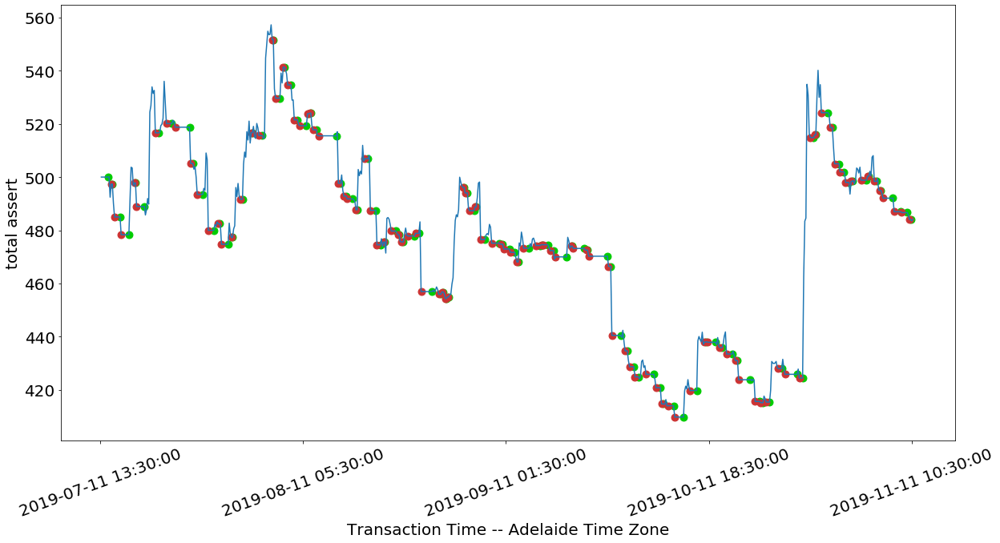

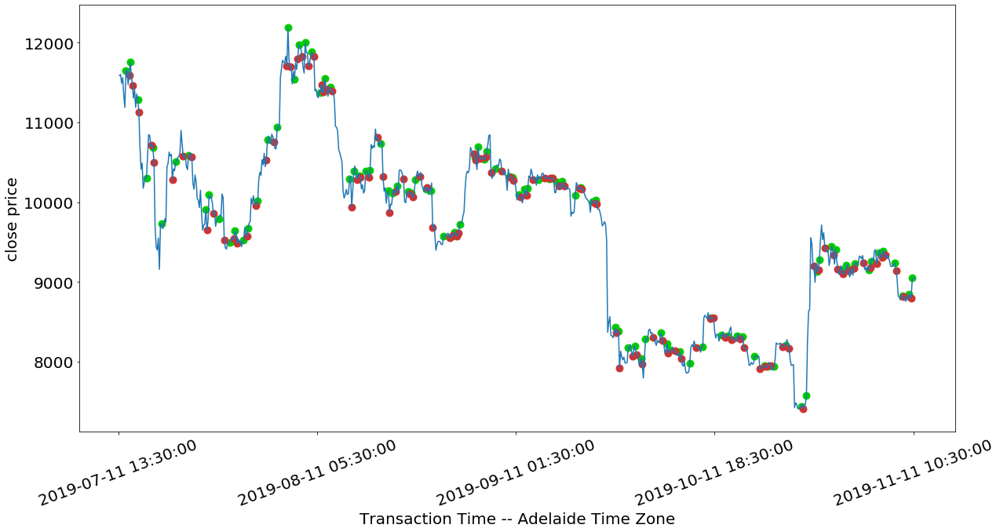

{Timestamp('2019-07-12 13:30:00'): 1, Timestamp('2019-07-13 01:30:00'): 2, Timestamp('2019-07-13 05:30:00'): 1, Timestamp('2019-07-13 13:30:00'): 2, Timestamp('2019-07-14 09:30:00'): 1, Timestamp('2019-07-14 13:30:00'): 2, Timestamp('2019-07-15 17:30:00'): 1, Timestamp('2019-07-16 13:30:00'): 2, Timestamp('2019-07-16 17:30:00'): 1, Timestamp('2019-07-16 21:30:00'): 2, Timestamp('2019-07-18 01:30:00'): 1, Timestamp('2019-07-19 17:30:00'): 2, Timestamp('2019-07-20 05:30:00'): 1, Timestamp('2019-07-21 09:30:00'): 2, Timestamp('2019-07-22 05:30:00'): 1, Timestamp('2019-07-22 17:30:00'): 2, Timestamp('2019-07-24 21:30:00'): 1, Timestamp('2019-07-25 01:30:00'): 2, Timestamp('2019-07-25 09:30:00'): 1, Timestamp('2019-07-26 01:30:00'): 2, Timestamp('2019-07-26 21:30:00'): 1, Timestamp('2019-07-27 17:30:00'): 2, Timestamp('2019-07-28 13:30:00'): 1, Timestamp('2019-07-29 05:30:00'): 2, Timestamp('2019-07-29 09:30:00'): 1, Timestamp('2019-07-29 17:30:00'): 2, Timestamp('2019-07-30 17:30:00'): 1, 

In [38]:
record = {}
run_bot('4h','4 hour','4 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-07-11 15:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 122
Current Money:0.0016000000002236447
Current Bitcoin: 0.056631999999999995
Current BNB: 2.5855301052645823
Return on Investment is:-5.239622661904628%
Current Total Assert is: 559.0862262947627


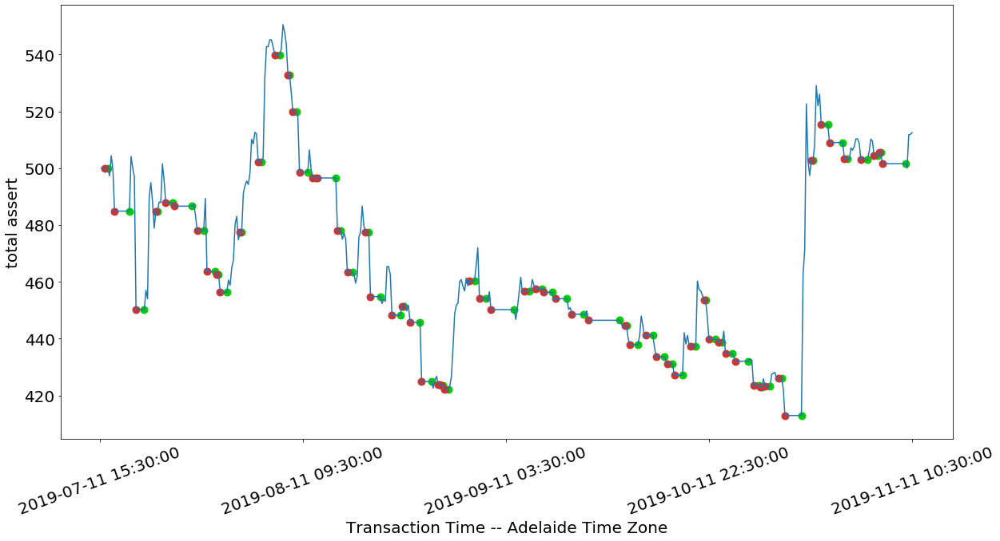

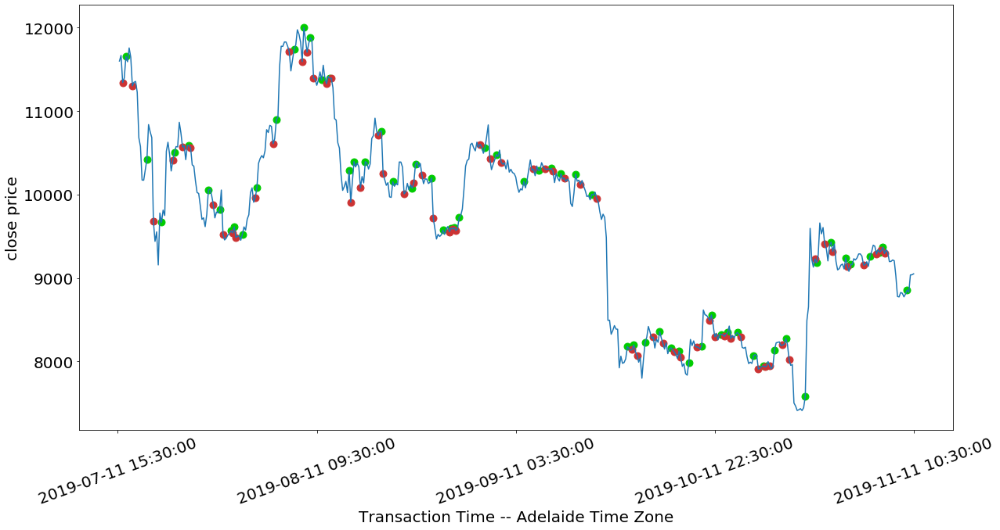

{Timestamp('2019-07-12 15:30:00'): 1, Timestamp('2019-07-13 15:30:00'): 2, Timestamp('2019-07-15 21:30:00'): 1, Timestamp('2019-07-16 21:30:00'): 2, Timestamp('2019-07-18 03:30:00'): 1, Timestamp('2019-07-19 21:30:00'): 2, Timestamp('2019-07-20 03:30:00'): 1, Timestamp('2019-07-21 09:30:00'): 2, Timestamp('2019-07-22 09:30:00'): 1, Timestamp('2019-07-22 15:30:00'): 2, Timestamp('2019-07-25 09:30:00'): 1, Timestamp('2019-07-26 03:30:00'): 2, Timestamp('2019-07-27 03:30:00'): 1, Timestamp('2019-07-27 15:30:00'): 2, Timestamp('2019-07-28 21:30:00'): 1, Timestamp('2019-07-29 03:30:00'): 2, Timestamp('2019-07-29 09:30:00'): 1, Timestamp('2019-07-29 15:30:00'): 2, Timestamp('2019-07-30 15:30:00'): 1, Timestamp('2019-08-01 15:30:00'): 2, Timestamp('2019-08-01 21:30:00'): 1, Timestamp('2019-08-04 09:30:00'): 2, Timestamp('2019-08-04 21:30:00'): 1, Timestamp('2019-08-06 21:30:00'): 2, Timestamp('2019-08-07 15:30:00'): 1, Timestamp('2019-08-08 21:30:00'): 2, Timestamp('2019-08-09 03:30:00'): 1, 

In [39]:
record = {}
run_bot('6h','6 hour','4 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-07-11 21:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 122
Current Money:0.003996160000042437
Current Bitcoin: 0.055261
Current BNB: 3.8215041961883314
Return on Investment is:-3.5739624946796673%
Current Total Assert is: 568.91362128139


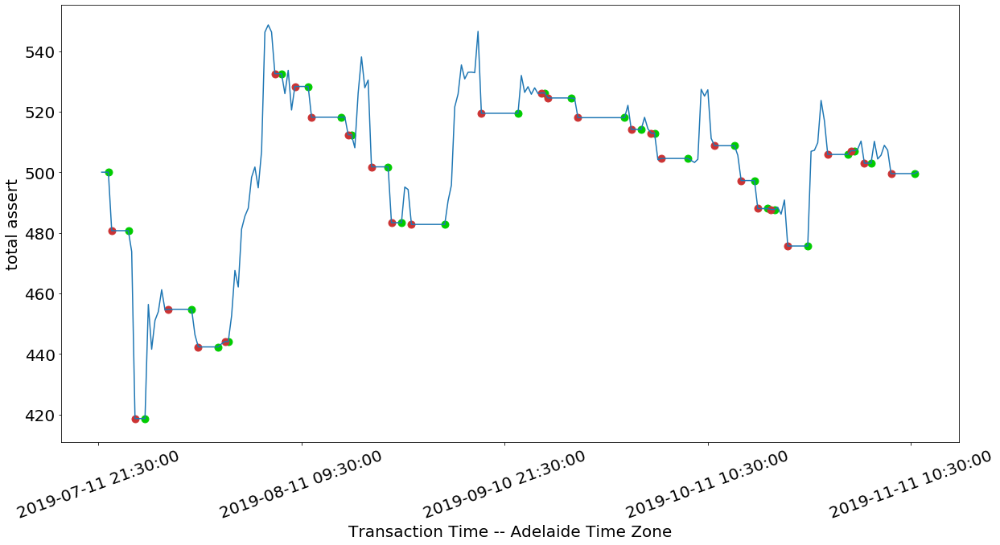

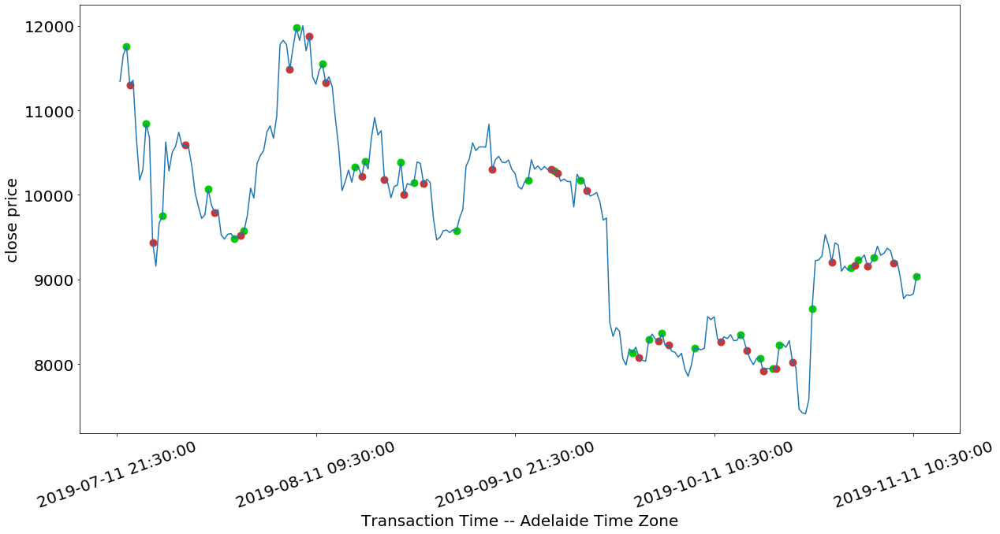

{Timestamp('2019-07-12 21:30:00'): 1, Timestamp('2019-07-13 09:30:00'): 2, Timestamp('2019-07-15 21:30:00'): 1, Timestamp('2019-07-16 21:30:00'): 2, Timestamp('2019-07-18 09:30:00'): 1, Timestamp('2019-07-21 21:30:00'): 2, Timestamp('2019-07-25 09:30:00'): 1, Timestamp('2019-07-26 09:30:00'): 2, Timestamp('2019-07-29 09:30:00'): 1, Timestamp('2019-07-30 09:30:00'): 2, Timestamp('2019-07-30 21:30:00'): 1, Timestamp('2019-08-06 21:30:00'): 2, Timestamp('2019-08-07 21:30:00'): 1, Timestamp('2019-08-09 21:30:00'): 2, Timestamp('2019-08-11 21:30:00'): 1, Timestamp('2019-08-12 09:30:00'): 2, Timestamp('2019-08-16 21:30:00'): 1, Timestamp('2019-08-17 21:30:00'): 2, Timestamp('2019-08-18 09:30:00'): 1, Timestamp('2019-08-21 09:30:00'): 2, Timestamp('2019-08-23 21:30:00'): 1, Timestamp('2019-08-24 09:30:00'): 2, Timestamp('2019-08-25 21:30:00'): 1, Timestamp('2019-08-27 09:30:00'): 2, Timestamp('2019-09-01 09:30:00'): 1, Timestamp('2019-09-06 21:30:00'): 2, Timestamp('2019-09-12 09:30:00'): 1, 

In [40]:
record = {}
run_bot('12h','12 hour','4 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-07-12 09:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 122
Current Money:0.007207159999609303
Current Bitcoin: 0.054846
Current BNB: 4.4847613651308365
Return on Investment is:-2.1613109945161666%
Current Total Assert is: 577.2482651323546


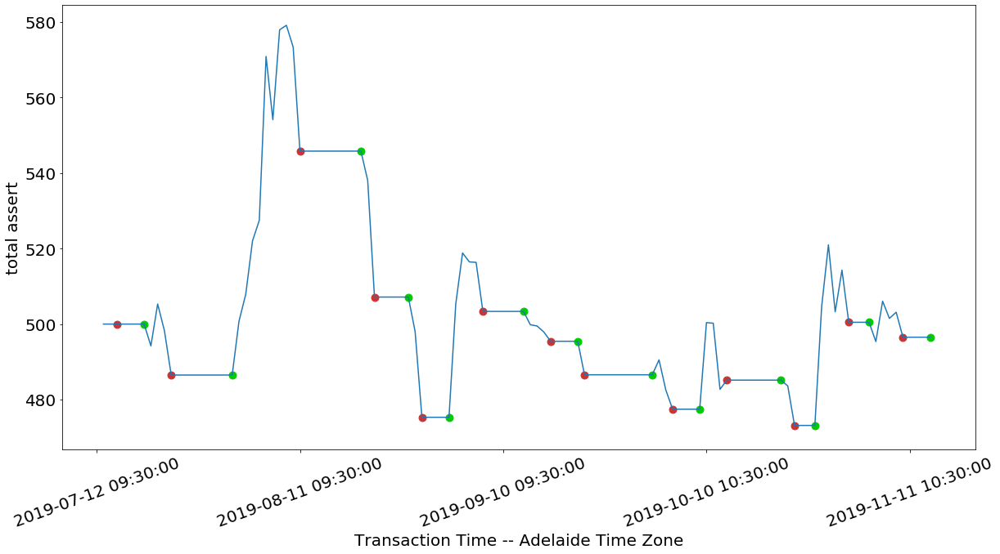

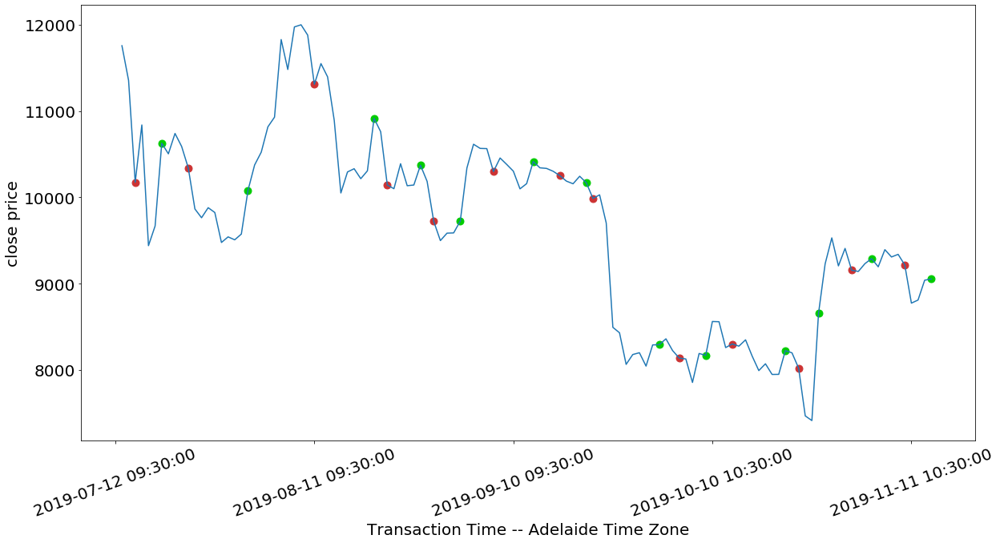

{Timestamp('2019-07-18 09:30:00'): 1, Timestamp('2019-07-22 09:30:00'): 2, Timestamp('2019-07-31 09:30:00'): 1, Timestamp('2019-08-10 09:30:00'): 2, Timestamp('2019-08-19 09:30:00'): 1, Timestamp('2019-08-21 09:30:00'): 2, Timestamp('2019-08-26 09:30:00'): 1, Timestamp('2019-08-28 09:30:00'): 2, Timestamp('2019-09-01 09:30:00'): 1, Timestamp('2019-09-06 09:30:00'): 2, Timestamp('2019-09-12 09:30:00'): 1, Timestamp('2019-09-16 09:30:00'): 2, Timestamp('2019-09-20 09:30:00'): 1, Timestamp('2019-09-21 09:30:00'): 2, Timestamp('2019-10-01 09:30:00'): 1, Timestamp('2019-10-04 09:30:00'): 2, Timestamp('2019-10-08 10:30:00'): 1, Timestamp('2019-10-12 10:30:00'): 2, Timestamp('2019-10-20 10:30:00'): 1, Timestamp('2019-10-22 10:30:00'): 2, Timestamp('2019-10-25 10:30:00'): 1, Timestamp('2019-10-30 10:30:00'): 2, Timestamp('2019-11-02 10:30:00'): 1, Timestamp('2019-11-07 10:30:00'): 2, Timestamp('2019-11-11 10:30:00'): 1}


In [41]:
record = {}
run_bot('1d','1 day','4 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-06-11 11:30:00
Investment End Time:2019-11-11 11:30:00
Investment Periods: 153
Current Money:0.002480150000735648
Current Bitcoin: 0.050758
Current BNB: -0.01324785424750156
Return on Investment is:-22.113562241771913%
Current Total Assert is: 459.5299827735457
Trading curb occured


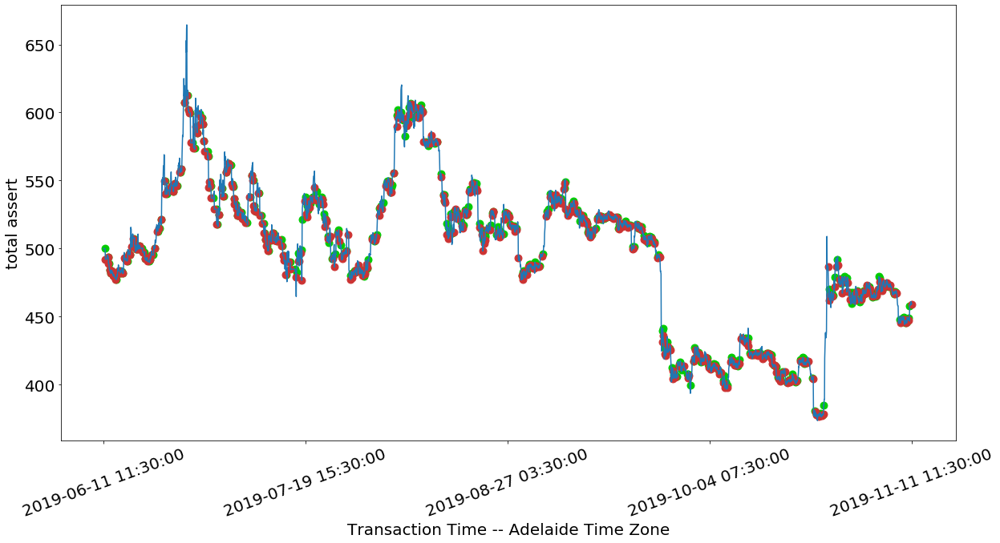

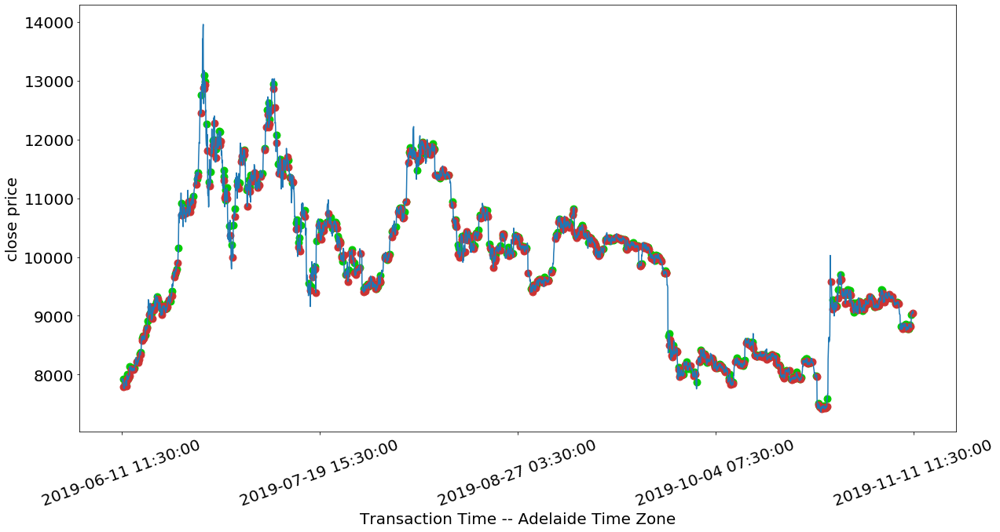

{Timestamp('2019-06-11 17:30:00'): 1, Timestamp('2019-06-11 19:30:00'): 2, Timestamp('2019-06-12 01:30:00'): 1, Timestamp('2019-06-12 07:30:00'): 2, Timestamp('2019-06-12 08:30:00'): 1, Timestamp('2019-06-12 09:30:00'): 2, Timestamp('2019-06-12 11:30:00'): 1, Timestamp('2019-06-12 14:30:00'): 2, Timestamp('2019-06-12 16:30:00'): 1, Timestamp('2019-06-12 18:30:00'): 2, Timestamp('2019-06-12 19:30:00'): 1, Timestamp('2019-06-12 23:30:00'): 2, Timestamp('2019-06-13 00:30:00'): 1, Timestamp('2019-06-13 05:30:00'): 2, Timestamp('2019-06-13 07:30:00'): 1, Timestamp('2019-06-13 10:30:00'): 2, Timestamp('2019-06-13 13:30:00'): 1, Timestamp('2019-06-13 15:30:00'): 2, Timestamp('2019-06-13 16:30:00'): 1, Timestamp('2019-06-13 18:30:00'): 2, Timestamp('2019-06-13 22:30:00'): 1, Timestamp('2019-06-14 08:30:00'): 2, Timestamp('2019-06-14 13:30:00'): 1, Timestamp('2019-06-14 15:30:00'): 2, Timestamp('2019-06-14 16:30:00'): 1, Timestamp('2019-06-14 20:30:00'): 2, Timestamp('2019-06-14 21:30:00'): 1, 

In [42]:
record = {}
run_bot('1h','1 hour','5 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-06-11 11:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 152
Current Money:656.4386163399998
Current Bitcoin: 0
Current BNB: -0.01536070810749543
Return on Investment is:11.213919253231348%
Current Total Assert is: 656.162123594065


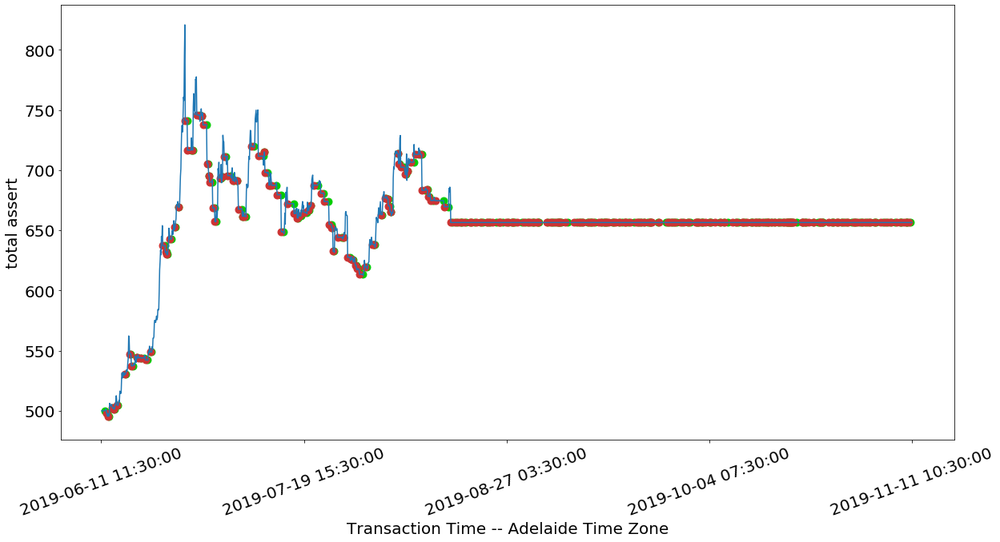

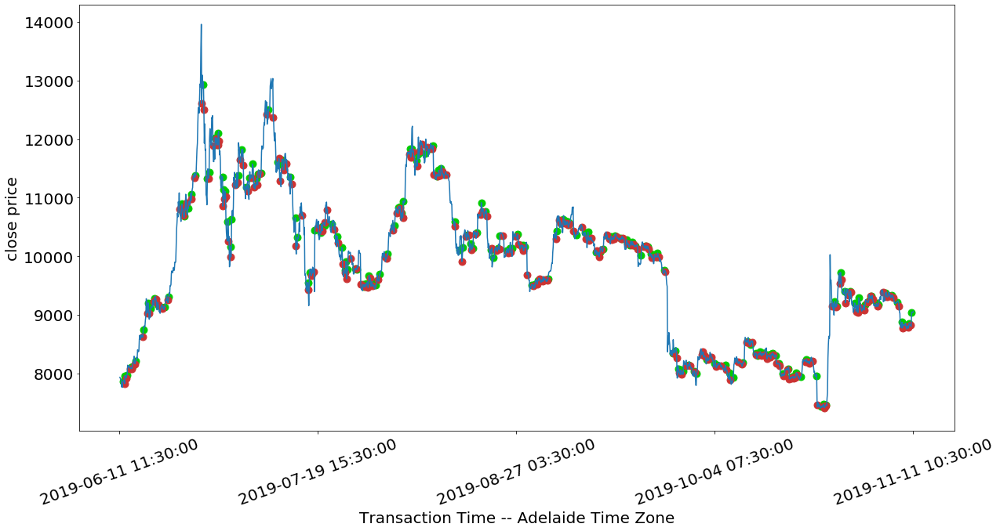

{Timestamp('2019-06-12 01:30:00'): 1, Timestamp('2019-06-12 09:30:00'): 2, Timestamp('2019-06-12 11:30:00'): 1, Timestamp('2019-06-12 17:30:00'): 2, Timestamp('2019-06-12 19:30:00'): 1, Timestamp('2019-06-13 11:30:00'): 2, Timestamp('2019-06-13 15:30:00'): 1, Timestamp('2019-06-13 17:30:00'): 2, Timestamp('2019-06-13 21:30:00'): 1, Timestamp('2019-06-14 09:30:00'): 2, Timestamp('2019-06-14 13:30:00'): 1, Timestamp('2019-06-15 19:30:00'): 2, Timestamp('2019-06-15 23:30:00'): 1, Timestamp('2019-06-16 17:30:00'): 2, Timestamp('2019-06-16 21:30:00'): 1, Timestamp('2019-06-17 01:30:00'): 2, Timestamp('2019-06-17 09:30:00'): 1, Timestamp('2019-06-18 01:30:00'): 2, Timestamp('2019-06-18 03:30:00'): 1, Timestamp('2019-06-18 09:30:00'): 2, Timestamp('2019-06-18 19:30:00'): 1, Timestamp('2019-06-18 21:30:00'): 2, Timestamp('2019-06-19 09:30:00'): 1, Timestamp('2019-06-19 17:30:00'): 2, Timestamp('2019-06-20 01:30:00'): 1, Timestamp('2019-06-20 15:30:00'): 2, Timestamp('2019-06-20 21:30:00'): 1, 

In [43]:
record = {}
run_bot('2h','2 hour','5 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-06-11 13:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 152
Current Money:0.005155970000146226
Current Bitcoin: 0.083206
Current BNB: -0.02270059746416425
Return on Investment is:27.718828524685623%
Current Total Assert is: 753.5410882956452


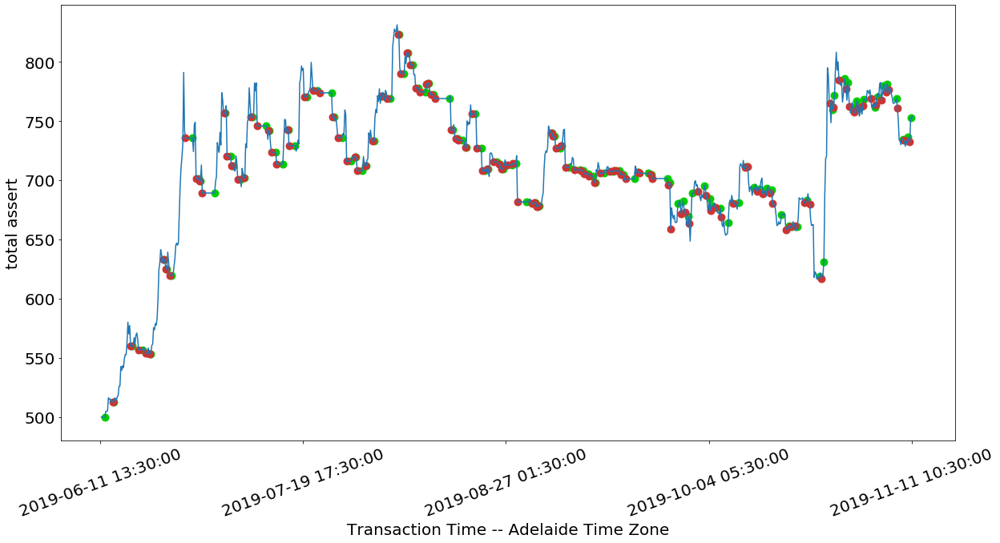

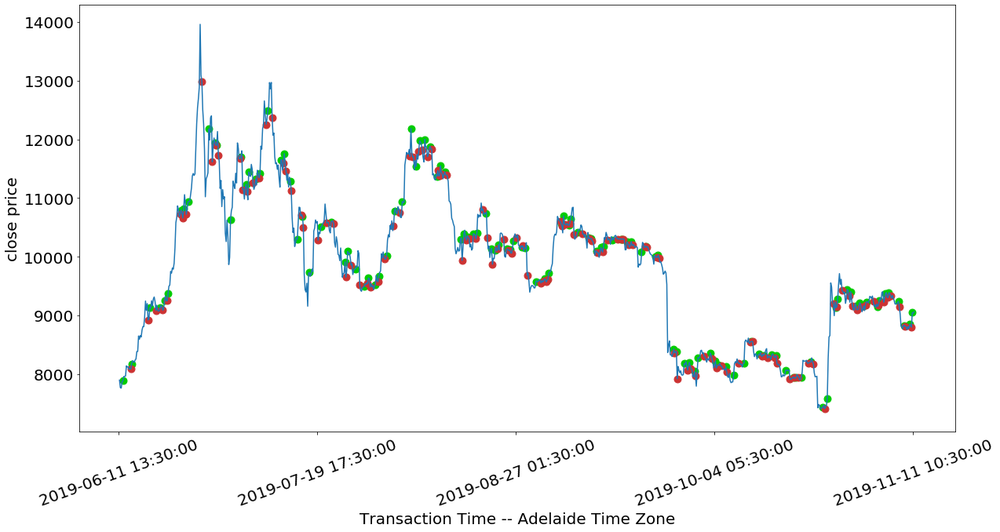

{Timestamp('2019-06-12 05:30:00'): 1, Timestamp('2019-06-13 17:30:00'): 2, Timestamp('2019-06-13 21:30:00'): 1, Timestamp('2019-06-17 01:30:00'): 2, Timestamp('2019-06-17 09:30:00'): 1, Timestamp('2019-06-18 13:30:00'): 2, Timestamp('2019-06-19 09:30:00'): 1, Timestamp('2019-06-19 21:30:00'): 2, Timestamp('2019-06-20 05:30:00'): 1, Timestamp('2019-06-20 17:30:00'): 2, Timestamp('2019-06-20 21:30:00'): 1, Timestamp('2019-06-23 05:30:00'): 2, Timestamp('2019-06-23 09:30:00'): 1, Timestamp('2019-06-23 17:30:00'): 2, Timestamp('2019-06-23 21:30:00'): 1, Timestamp('2019-06-24 09:30:00'): 2, Timestamp('2019-06-24 17:30:00'): 1, Timestamp('2019-06-27 09:30:00'): 2, Timestamp('2019-06-28 17:30:00'): 1, Timestamp('2019-06-29 09:30:00'): 2, Timestamp('2019-06-29 21:30:00'): 1, Timestamp('2019-06-30 01:30:00'): 2, Timestamp('2019-06-30 05:30:00'): 1, Timestamp('2019-06-30 13:30:00'): 2, Timestamp('2019-07-02 21:30:00'): 1, Timestamp('2019-07-04 17:30:00'): 2, Timestamp('2019-07-04 21:30:00'): 1, 

In [44]:
record = {}
run_bot('4h','4 hour','5 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-06-11 15:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 152
Current Money:0.00027950000026066846
Current Bitcoin: 0.087672
Current BNB: 0.6597593680716682
Return on Investment is:36.61301942462547%
Current Total Assert is: 806.0168146052903


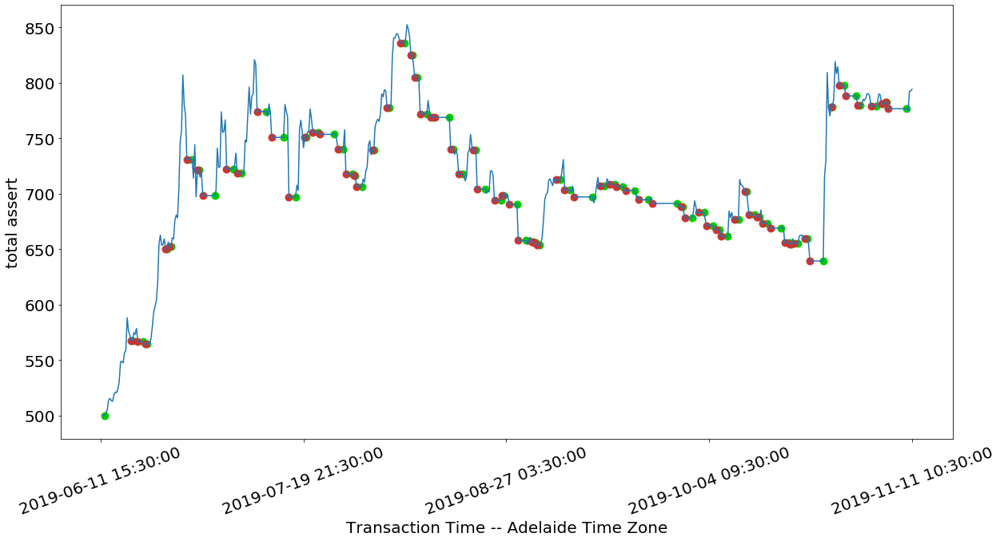

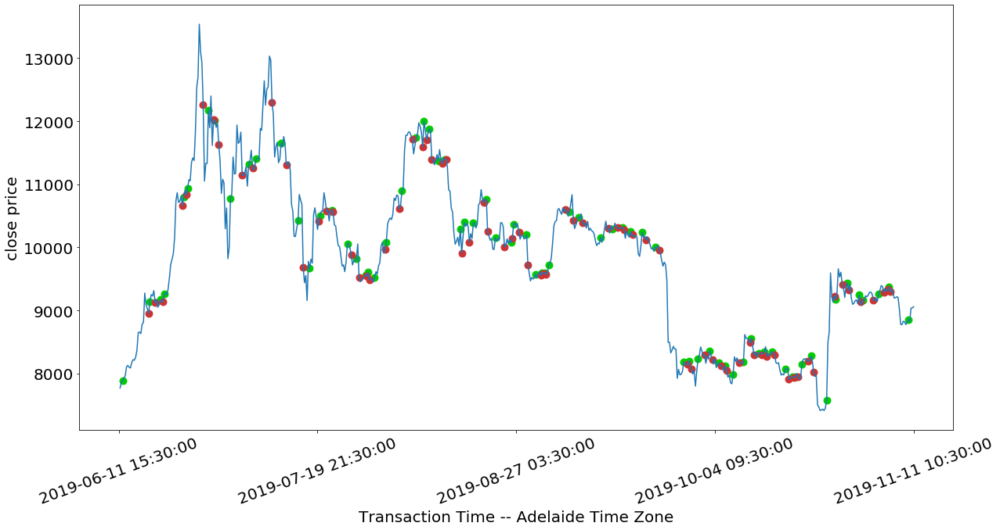

{Timestamp('2019-06-12 03:30:00'): 1, Timestamp('2019-06-17 03:30:00'): 2, Timestamp('2019-06-17 09:30:00'): 1, Timestamp('2019-06-18 09:30:00'): 2, Timestamp('2019-06-19 09:30:00'): 1, Timestamp('2019-06-19 21:30:00'): 2, Timestamp('2019-06-20 03:30:00'): 1, Timestamp('2019-06-23 15:30:00'): 2, Timestamp('2019-06-23 21:30:00'): 1, Timestamp('2019-06-24 09:30:00'): 2, Timestamp('2019-06-24 15:30:00'): 1, Timestamp('2019-06-27 15:30:00'): 2, Timestamp('2019-06-28 15:30:00'): 1, Timestamp('2019-06-29 15:30:00'): 2, Timestamp('2019-06-29 21:30:00'): 1, Timestamp('2019-06-30 15:30:00'): 2, Timestamp('2019-07-02 21:30:00'): 1, Timestamp('2019-07-05 03:30:00'): 2, Timestamp('2019-07-06 09:30:00'): 1, Timestamp('2019-07-07 03:30:00'): 2, Timestamp('2019-07-07 21:30:00'): 1, Timestamp('2019-07-10 21:30:00'): 2, Timestamp('2019-07-12 15:30:00'): 1, Timestamp('2019-07-13 15:30:00'): 2, Timestamp('2019-07-15 21:30:00'): 1, Timestamp('2019-07-16 21:30:00'): 2, Timestamp('2019-07-18 03:30:00'): 1, 

In [45]:
record = {}
run_bot('6h','6 hour','5 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-06-11 21:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 152
Current Money:0.0014631000000235872
Current Bitcoin: 0.068552
Current BNB: 3.293850461136249
Return on Investment is:15.295077471263138%
Current Total Assert is: 680.2409570804525


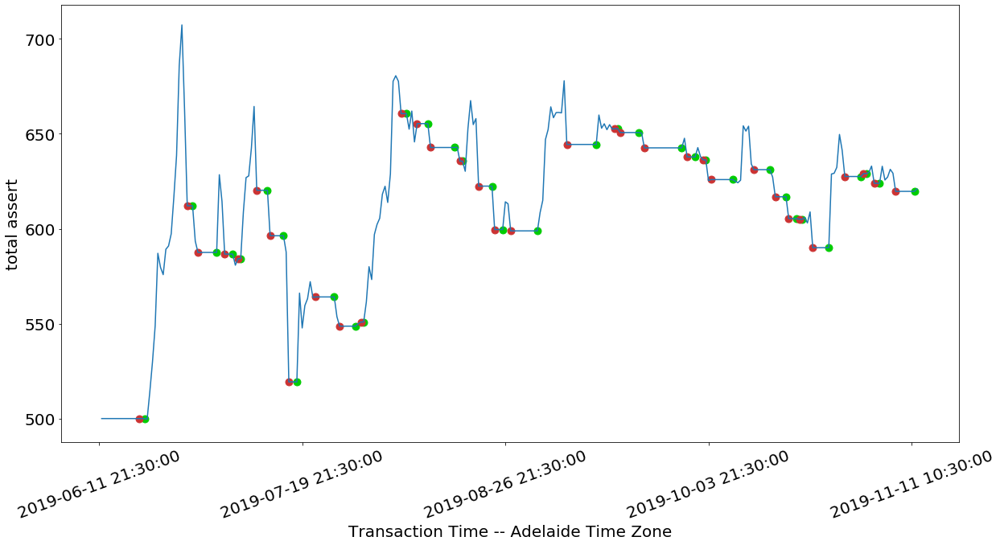

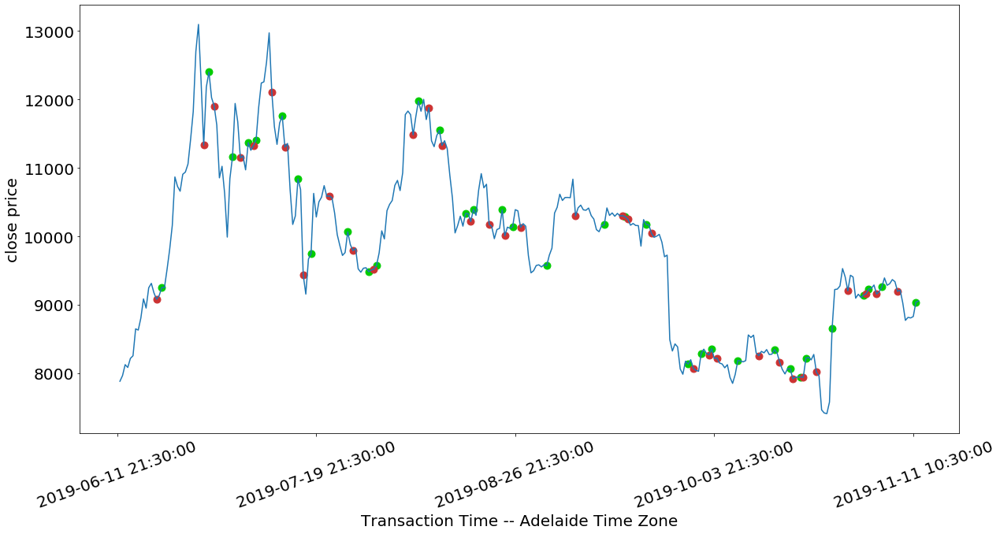

{Timestamp('2019-06-19 21:30:00'): 1, Timestamp('2019-06-27 21:30:00'): 2, Timestamp('2019-06-28 21:30:00'): 1, Timestamp('2019-06-29 21:30:00'): 2, Timestamp('2019-07-03 09:30:00'): 1, Timestamp('2019-07-04 21:30:00'): 2, Timestamp('2019-07-06 09:30:00'): 1, Timestamp('2019-07-07 09:30:00'): 2, Timestamp('2019-07-07 21:30:00'): 1, Timestamp('2019-07-10 21:30:00'): 2, Timestamp('2019-07-12 21:30:00'): 1, Timestamp('2019-07-13 09:30:00'): 2, Timestamp('2019-07-15 21:30:00'): 1, Timestamp('2019-07-16 21:30:00'): 2, Timestamp('2019-07-18 09:30:00'): 1, Timestamp('2019-07-21 21:30:00'): 2, Timestamp('2019-07-25 09:30:00'): 1, Timestamp('2019-07-26 09:30:00'): 2, Timestamp('2019-07-29 09:30:00'): 1, Timestamp('2019-07-30 09:30:00'): 2, Timestamp('2019-07-30 21:30:00'): 1, Timestamp('2019-08-06 21:30:00'): 2, Timestamp('2019-08-07 21:30:00'): 1, Timestamp('2019-08-09 21:30:00'): 2, Timestamp('2019-08-11 21:30:00'): 1, Timestamp('2019-08-12 09:30:00'): 2, Timestamp('2019-08-16 21:30:00'): 1, 

In [46]:
record = {}
run_bot('12h','12 hour','5 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-06-12 09:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 152
Current Money:0.0002627300000312971
Current Bitcoin: 0.046272999999999995
Current BNB: 4.453668135222082
Return on Investment is:-15.36108615016992%
Current Total Assert is: 499.36959171399747
Trading curb occured


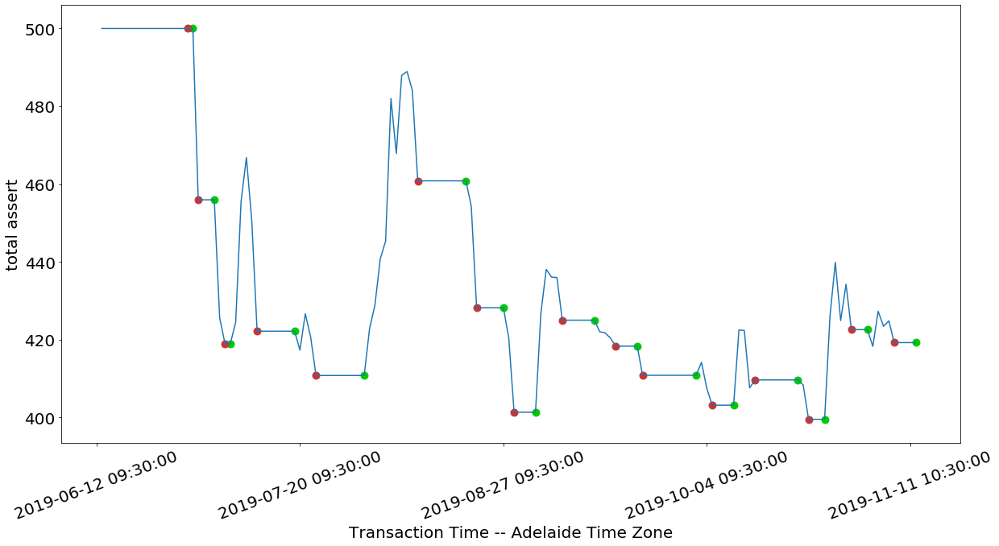

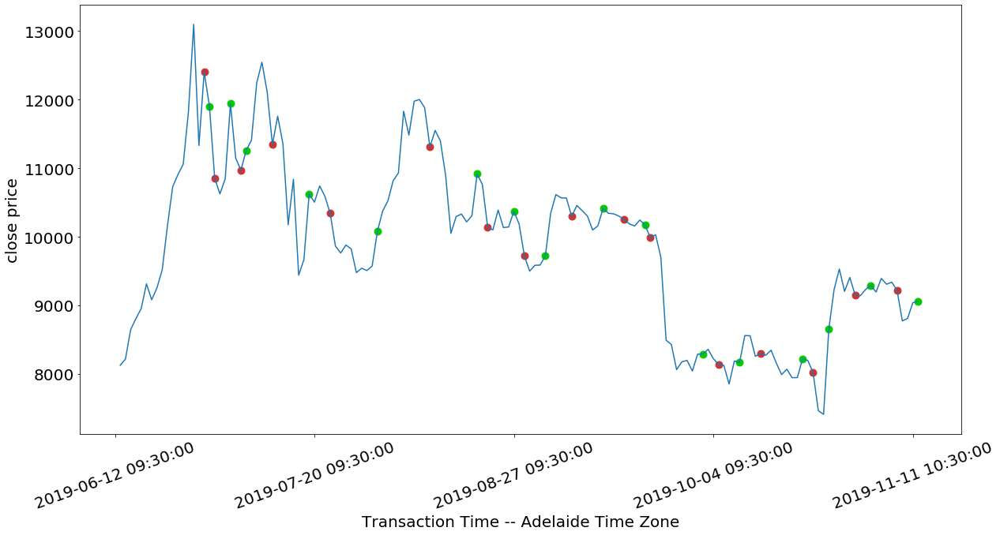

{Timestamp('2019-06-29 09:30:00'): 1, Timestamp('2019-06-30 09:30:00'): 2, Timestamp('2019-07-03 09:30:00'): 1, Timestamp('2019-07-05 09:30:00'): 2, Timestamp('2019-07-06 09:30:00'): 1, Timestamp('2019-07-11 09:30:00'): 2, Timestamp('2019-07-18 09:30:00'): 1, Timestamp('2019-07-22 09:30:00'): 2, Timestamp('2019-07-31 09:30:00'): 1, Timestamp('2019-08-10 09:30:00'): 2, Timestamp('2019-08-19 09:30:00'): 1, Timestamp('2019-08-21 09:30:00'): 2, Timestamp('2019-08-26 09:30:00'): 1, Timestamp('2019-08-28 09:30:00'): 2, Timestamp('2019-09-01 09:30:00'): 1, Timestamp('2019-09-06 09:30:00'): 2, Timestamp('2019-09-12 09:30:00'): 1, Timestamp('2019-09-16 09:30:00'): 2, Timestamp('2019-09-20 09:30:00'): 1, Timestamp('2019-09-21 09:30:00'): 2, Timestamp('2019-10-01 09:30:00'): 1, Timestamp('2019-10-04 09:30:00'): 2, Timestamp('2019-10-08 10:30:00'): 1, Timestamp('2019-10-12 10:30:00'): 2, Timestamp('2019-10-20 10:30:00'): 1, Timestamp('2019-10-22 10:30:00'): 2, Timestamp('2019-10-25 10:30:00'): 1, 

In [47]:
record = {}
run_bot('1d','1 day','5 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-05-11 12:30:00
Investment End Time:2019-11-11 12:30:00
Investment Periods: 184
Current Money:535.0808599099993
Current Bitcoin: 0
Current BNB: -0.021197628857914937
Return on Investment is:-9.372999560922569%
Current Total Assert is: 534.6993025905568


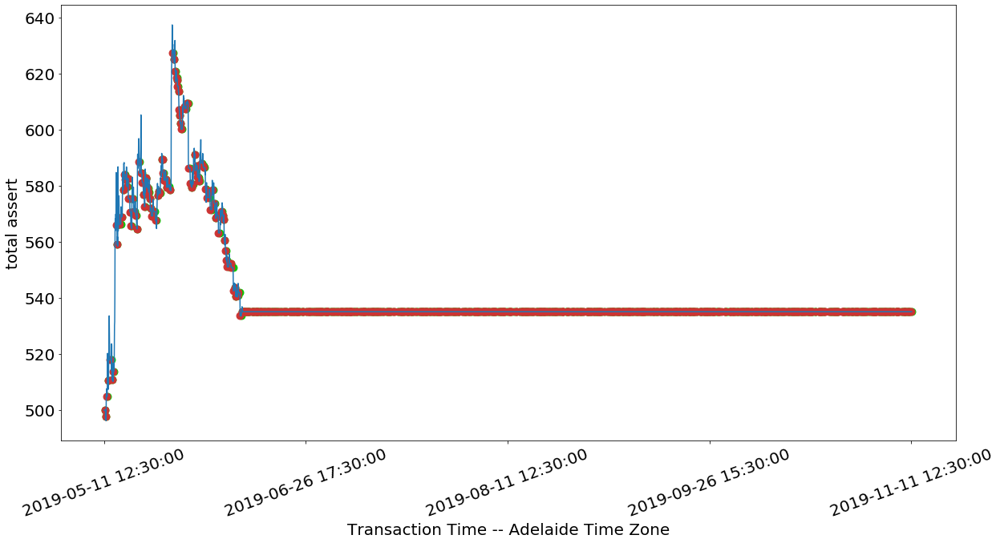

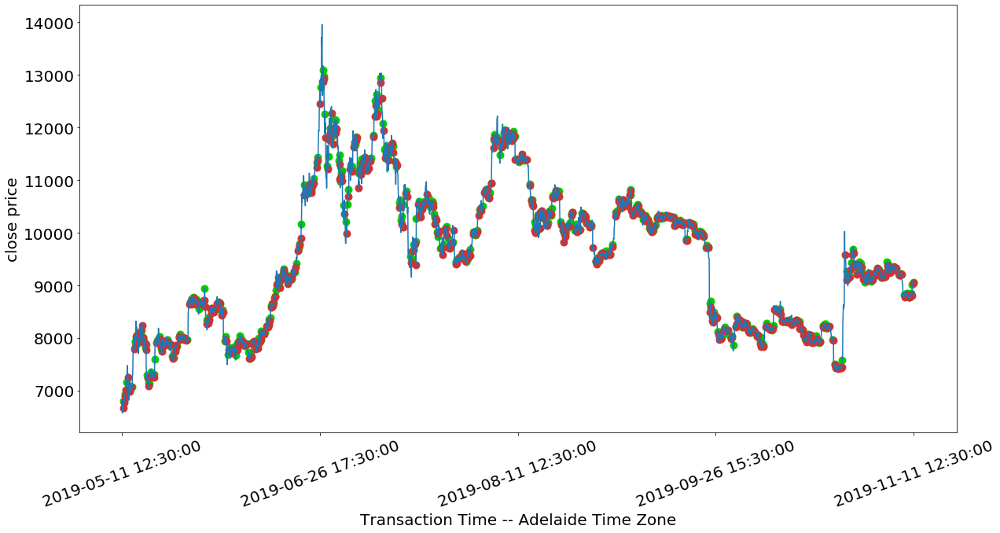

{Timestamp('2019-05-11 19:30:00'): 1, Timestamp('2019-05-11 21:30:00'): 2, Timestamp('2019-05-11 22:30:00'): 1, Timestamp('2019-05-12 04:30:00'): 2, Timestamp('2019-05-12 05:30:00'): 1, Timestamp('2019-05-12 09:30:00'): 2, Timestamp('2019-05-12 10:30:00'): 1, Timestamp('2019-05-12 19:30:00'): 2, Timestamp('2019-05-13 03:30:00'): 1, Timestamp('2019-05-13 07:30:00'): 2, Timestamp('2019-05-13 10:30:00'): 1, Timestamp('2019-05-13 15:30:00'): 2, Timestamp('2019-05-13 18:30:00'): 1, Timestamp('2019-05-14 08:30:00'): 2, Timestamp('2019-05-14 10:30:00'): 1, Timestamp('2019-05-14 11:30:00'): 2, Timestamp('2019-05-14 12:30:00'): 1, Timestamp('2019-05-14 18:30:00'): 2, Timestamp('2019-05-14 20:30:00'): 1, Timestamp('2019-05-14 23:30:00'): 2, Timestamp('2019-05-15 07:30:00'): 1, Timestamp('2019-05-15 11:30:00'): 2, Timestamp('2019-05-16 00:30:00'): 1, Timestamp('2019-05-16 06:30:00'): 2, Timestamp('2019-05-16 07:30:00'): 1, Timestamp('2019-05-16 12:30:00'): 2, Timestamp('2019-05-16 16:30:00'): 1, 

In [48]:
record = {}
run_bot('1h','1 hour','6 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-05-11 13:30:00
Investment End Time:2019-11-11 12:30:00
Investment Periods: 183
Current Money:807.0830928200003
Current Bitcoin: 0
Current BNB: -0.004742075909165436
Return on Investment is:36.77927719553141%
Current Total Assert is: 806.9977354536353


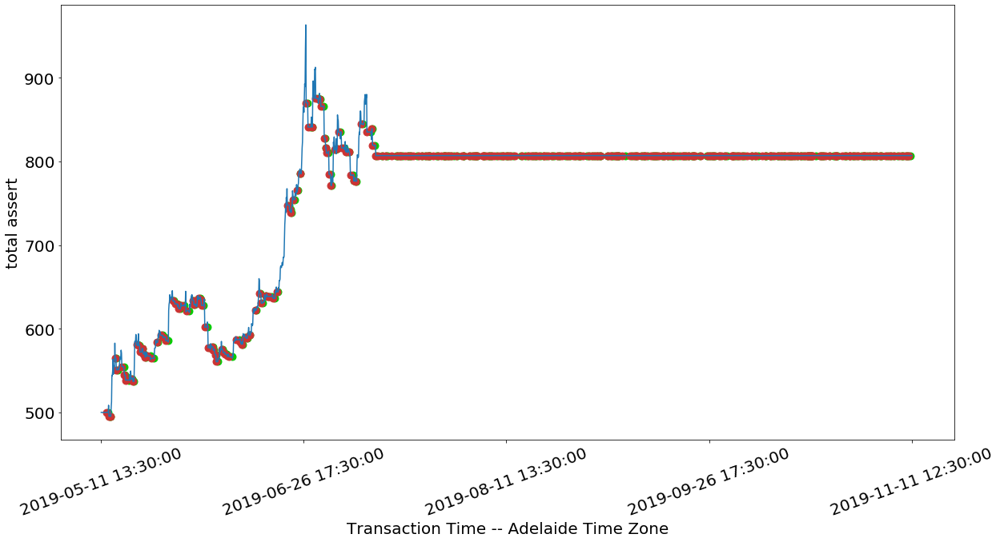

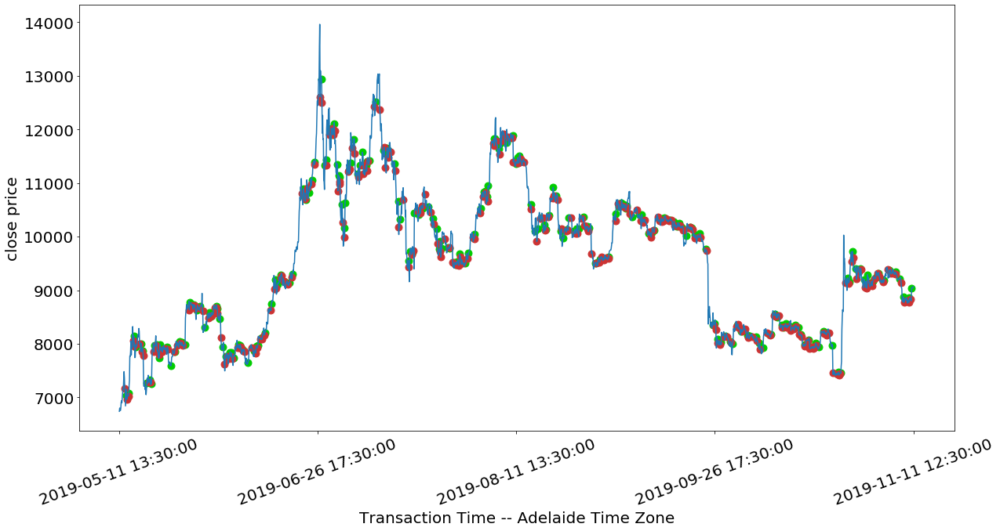

{Timestamp('2019-05-13 03:30:00'): 1, Timestamp('2019-05-13 07:30:00'): 2, Timestamp('2019-05-13 11:30:00'): 1, Timestamp('2019-05-13 15:30:00'): 2, Timestamp('2019-05-13 17:30:00'): 1, Timestamp('2019-05-14 19:30:00'): 2, Timestamp('2019-05-14 21:30:00'): 1, Timestamp('2019-05-14 23:30:00'): 2, Timestamp('2019-05-15 07:30:00'): 1, Timestamp('2019-05-16 13:30:00'): 2, Timestamp('2019-05-16 23:30:00'): 1, Timestamp('2019-05-17 03:30:00'): 2, Timestamp('2019-05-17 07:30:00'): 1, Timestamp('2019-05-17 09:30:00'): 2, Timestamp('2019-05-18 05:30:00'): 1, Timestamp('2019-05-18 17:30:00'): 2, Timestamp('2019-05-18 21:30:00'): 1, Timestamp('2019-05-19 01:30:00'): 2, Timestamp('2019-05-19 07:30:00'): 1, Timestamp('2019-05-19 21:30:00'): 2, Timestamp('2019-05-20 01:30:00'): 1, Timestamp('2019-05-20 09:30:00'): 2, Timestamp('2019-05-20 13:30:00'): 1, Timestamp('2019-05-20 15:30:00'): 2, Timestamp('2019-05-21 01:30:00'): 1, Timestamp('2019-05-21 03:30:00'): 2, Timestamp('2019-05-21 05:30:00'): 1, 

In [49]:
record = {}
run_bot('2h','2 hour','6 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-05-11 13:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 183
Current Money:0.0071203600001581435
Current Bitcoin: 0.067893
Current BNB: -0.0004165675637527039
Return on Investment is:4.268624482008922%
Current Total Assert is: 615.1848844438526


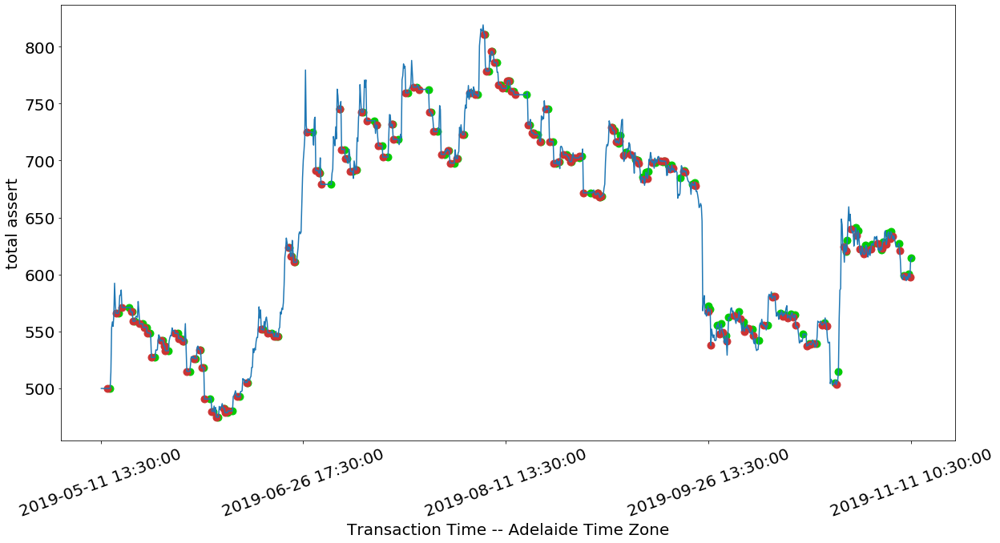

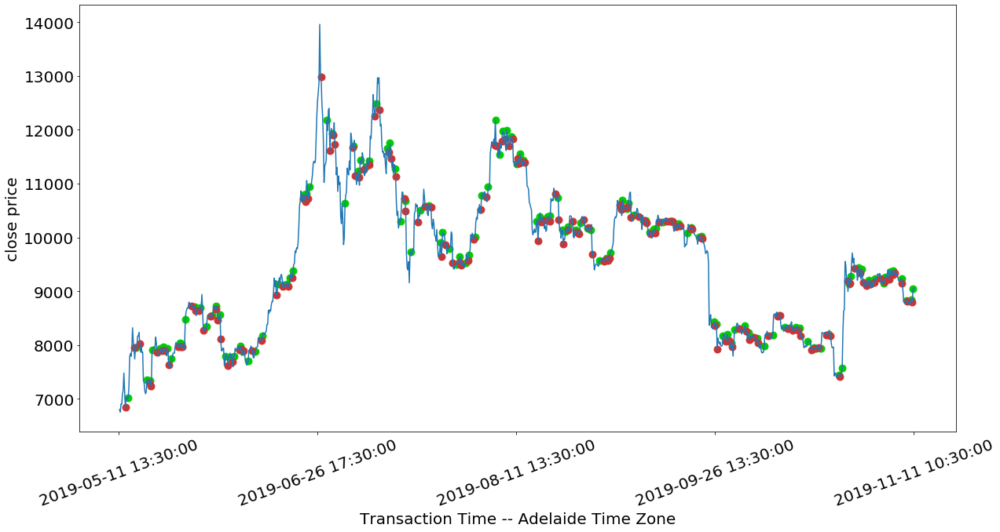

{Timestamp('2019-05-13 13:30:00'): 1, Timestamp('2019-05-14 21:30:00'): 2, Timestamp('2019-05-15 09:30:00'): 1, Timestamp('2019-05-16 13:30:00'): 2, Timestamp('2019-05-18 05:30:00'): 1, Timestamp('2019-05-18 17:30:00'): 2, Timestamp('2019-05-18 21:30:00'): 1, Timestamp('2019-05-19 01:30:00'): 2, Timestamp('2019-05-19 09:30:00'): 1, Timestamp('2019-05-20 13:30:00'): 2, Timestamp('2019-05-21 05:30:00'): 1, Timestamp('2019-05-21 13:30:00'): 2, Timestamp('2019-05-22 01:30:00'): 1, Timestamp('2019-05-22 09:30:00'): 2, Timestamp('2019-05-22 21:30:00'): 1, Timestamp('2019-05-23 05:30:00'): 2, Timestamp('2019-05-23 21:30:00'): 1, Timestamp('2019-05-25 09:30:00'): 2, Timestamp('2019-05-25 17:30:00'): 1, Timestamp('2019-05-26 01:30:00'): 2, Timestamp('2019-05-26 05:30:00'): 1, Timestamp('2019-05-26 09:30:00'): 2, Timestamp('2019-05-27 01:30:00'): 1, Timestamp('2019-05-28 13:30:00'): 2, Timestamp('2019-05-29 05:30:00'): 1, Timestamp('2019-05-29 09:30:00'): 2, Timestamp('2019-05-29 21:30:00'): 1, 

In [50]:
record = {}
run_bot('4h','4 hour','6 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-05-11 15:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 183
Current Money:786.7660804900013
Current Bitcoin: 0
Current BNB: -0.018609473358336237
Return on Investment is:33.29340846941547%
Current Total Assert is: 786.4311099695512


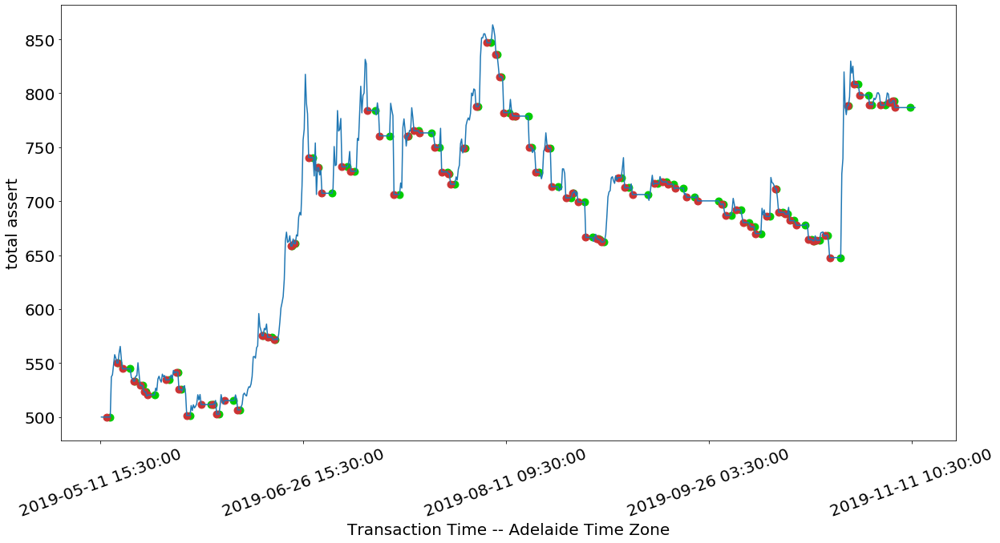

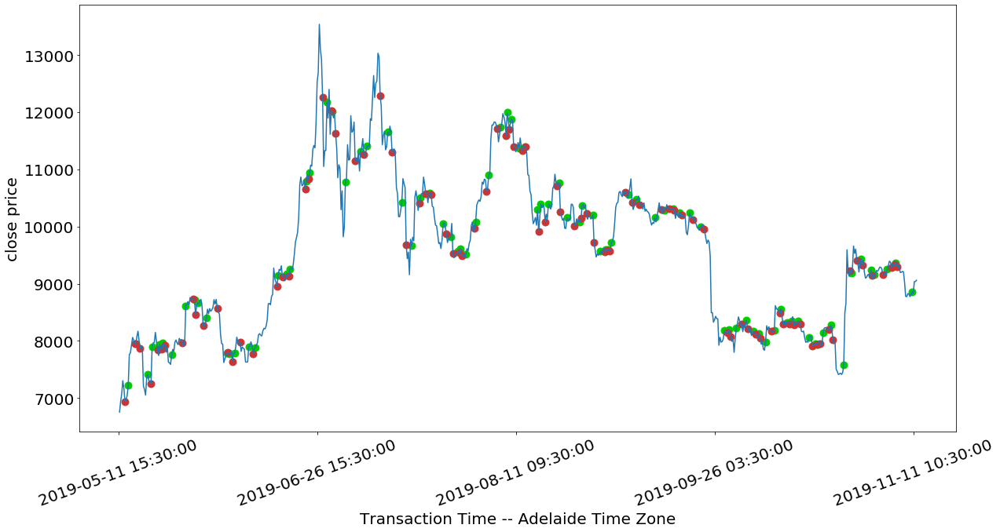

{Timestamp('2019-05-13 15:30:00'): 1, Timestamp('2019-05-15 03:30:00'): 2, Timestamp('2019-05-15 09:30:00'): 1, Timestamp('2019-05-16 15:30:00'): 2, Timestamp('2019-05-18 09:30:00'): 1, Timestamp('2019-05-19 03:30:00'): 2, Timestamp('2019-05-19 09:30:00'): 1, Timestamp('2019-05-20 15:30:00'): 2, Timestamp('2019-05-21 03:30:00'): 1, Timestamp('2019-05-21 15:30:00'): 2, Timestamp('2019-05-21 21:30:00'): 1, Timestamp('2019-05-22 09:30:00'): 2, Timestamp('2019-05-23 21:30:00'): 1, Timestamp('2019-05-26 09:30:00'): 2, Timestamp('2019-05-27 03:30:00'): 1, Timestamp('2019-05-28 21:30:00'): 2, Timestamp('2019-05-29 03:30:00'): 1, Timestamp('2019-05-29 09:30:00'): 2, Timestamp('2019-05-29 21:30:00'): 1, Timestamp('2019-05-31 03:30:00'): 2, Timestamp('2019-05-31 21:30:00'): 1, Timestamp('2019-06-03 09:30:00'): 2, Timestamp('2019-06-05 15:30:00'): 1, Timestamp('2019-06-05 21:30:00'): 2, Timestamp('2019-06-06 03:30:00'): 1, Timestamp('2019-06-06 21:30:00'): 2, Timestamp('2019-06-07 09:30:00'): 1, 

In [51]:
record = {}
run_bot('6h','6 hour','6 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-05-11 21:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 183
Current Money:0.0020286099996837947
Current Bitcoin: 0.07323099999999999
Current BNB: 2.8103699828675004
Return on Investment is:21.01782380196856%
Current Total Assert is: 714.0051604316145


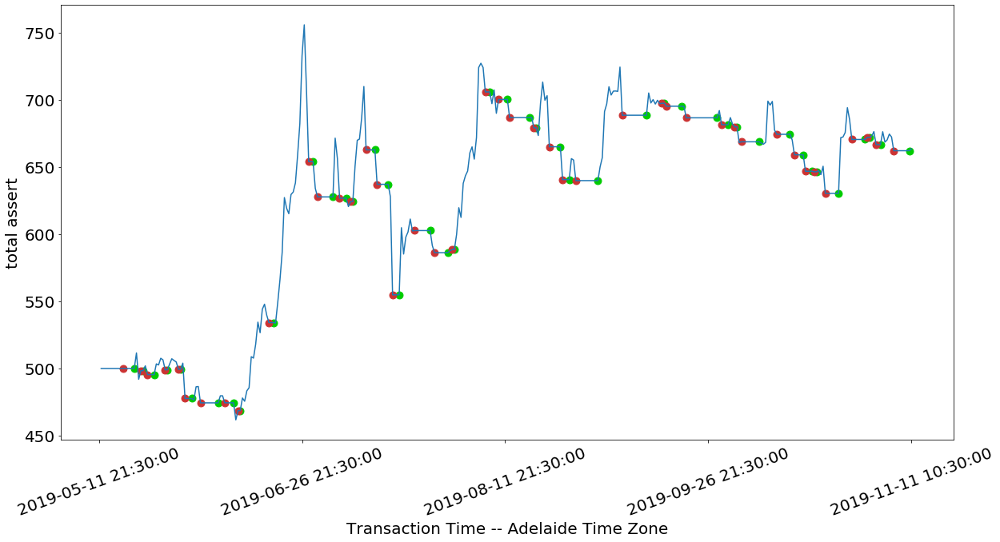

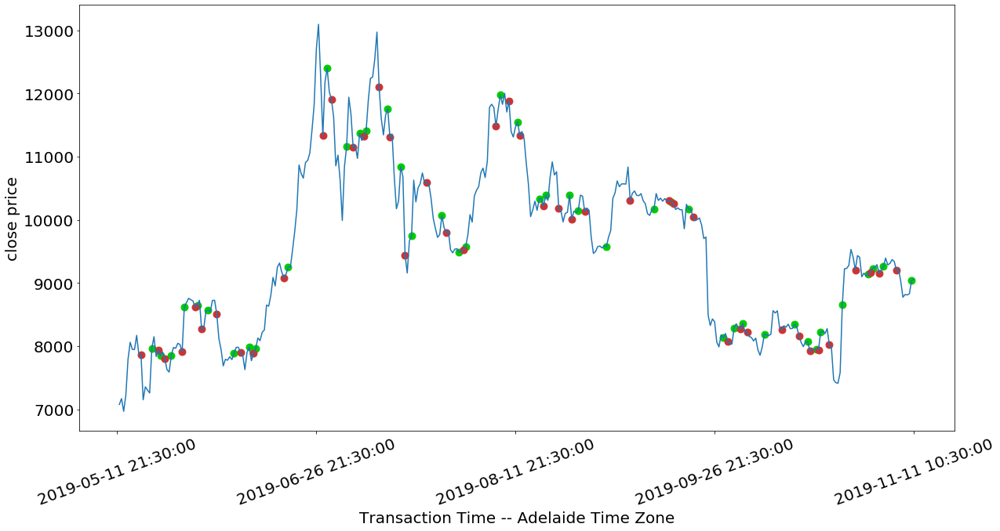

{Timestamp('2019-05-19 09:30:00'): 1, Timestamp('2019-05-20 21:30:00'): 2, Timestamp('2019-05-21 09:30:00'): 1, Timestamp('2019-05-22 09:30:00'): 2, Timestamp('2019-05-23 21:30:00'): 1, Timestamp('2019-05-26 09:30:00'): 2, Timestamp('2019-05-26 21:30:00'): 1, Timestamp('2019-05-29 09:30:00'): 2, Timestamp('2019-05-29 21:30:00'): 1, Timestamp('2019-05-30 21:30:00'): 2, Timestamp('2019-06-01 09:30:00'): 1, Timestamp('2019-06-03 09:30:00'): 2, Timestamp('2019-06-07 09:30:00'): 1, Timestamp('2019-06-08 21:30:00'): 2, Timestamp('2019-06-10 21:30:00'): 1, Timestamp('2019-06-11 21:30:00'): 2, Timestamp('2019-06-12 09:30:00'): 1, Timestamp('2019-06-18 21:30:00'): 2, Timestamp('2019-06-19 21:30:00'): 1, Timestamp('2019-06-27 21:30:00'): 2, Timestamp('2019-06-28 21:30:00'): 1, Timestamp('2019-06-29 21:30:00'): 2, Timestamp('2019-07-03 09:30:00'): 1, Timestamp('2019-07-04 21:30:00'): 2, Timestamp('2019-07-06 09:30:00'): 1, Timestamp('2019-07-07 09:30:00'): 2, Timestamp('2019-07-07 21:30:00'): 1, 

In [52]:
record = {}
run_bot('12h','12 hour','6 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2019-05-12 09:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 183
Current Money:0.005430749999732143
Current Bitcoin: 0.064218
Current BNB: 4.037244185229583
Return on Investment is:10.92990013968343%
Current Total Assert is: 654.4864108241322


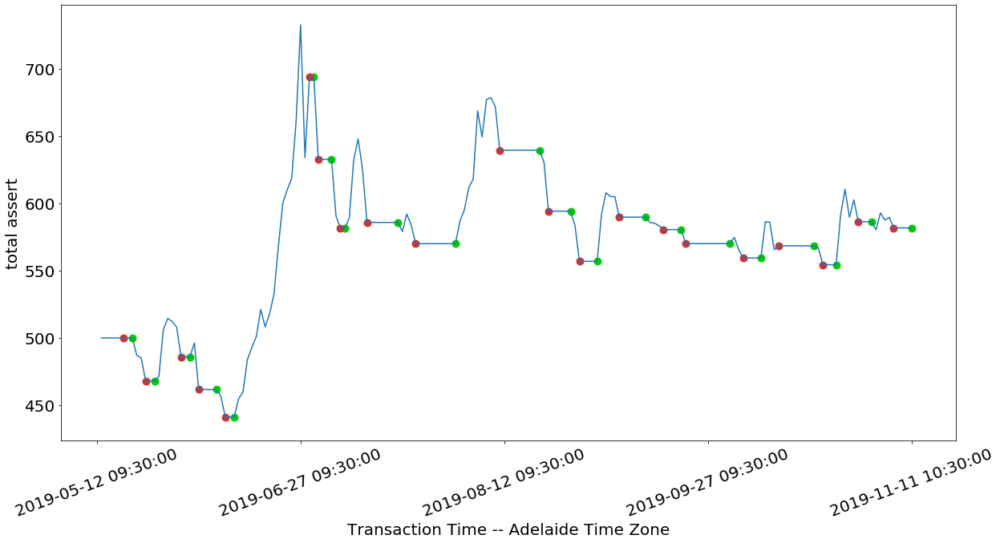

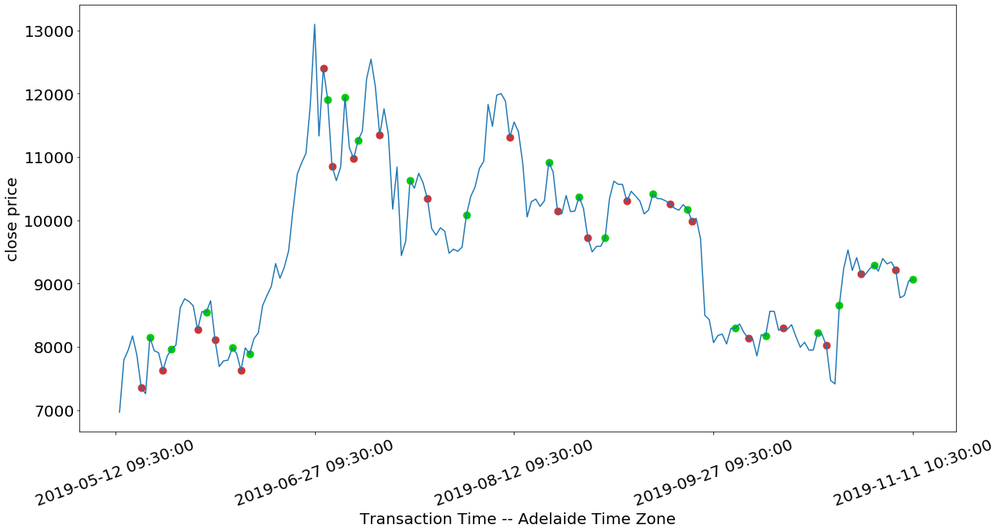

{Timestamp('2019-05-19 09:30:00'): 1, Timestamp('2019-05-22 09:30:00'): 2, Timestamp('2019-05-24 09:30:00'): 1, Timestamp('2019-05-30 09:30:00'): 2, Timestamp('2019-06-01 09:30:00'): 1, Timestamp('2019-06-03 09:30:00'): 2, Timestamp('2019-06-07 09:30:00'): 1, Timestamp('2019-06-09 09:30:00'): 2, Timestamp('2019-06-11 09:30:00'): 1, Timestamp('2019-06-28 09:30:00'): 2, Timestamp('2019-06-29 09:30:00'): 1, Timestamp('2019-06-30 09:30:00'): 2, Timestamp('2019-07-03 09:30:00'): 1, Timestamp('2019-07-05 09:30:00'): 2, Timestamp('2019-07-06 09:30:00'): 1, Timestamp('2019-07-11 09:30:00'): 2, Timestamp('2019-07-18 09:30:00'): 1, Timestamp('2019-07-22 09:30:00'): 2, Timestamp('2019-07-31 09:30:00'): 1, Timestamp('2019-08-10 09:30:00'): 2, Timestamp('2019-08-19 09:30:00'): 1, Timestamp('2019-08-21 09:30:00'): 2, Timestamp('2019-08-26 09:30:00'): 1, Timestamp('2019-08-28 09:30:00'): 2, Timestamp('2019-09-01 09:30:00'): 1, Timestamp('2019-09-06 09:30:00'): 2, Timestamp('2019-09-12 09:30:00'): 1, 

In [53]:
record = {}
run_bot('1d','1 day','6 months ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2018-11-11 13:30:00
Investment End Time:2019-11-11 12:30:00
Investment Periods: 364
Current Money:315.39811304000017
Current Bitcoin: 0
Current BNB: -0.004256665384579391
Return on Investment is:-46.55567914185123%
Current Total Assert is: 315.32149306307775
Trading curb occured


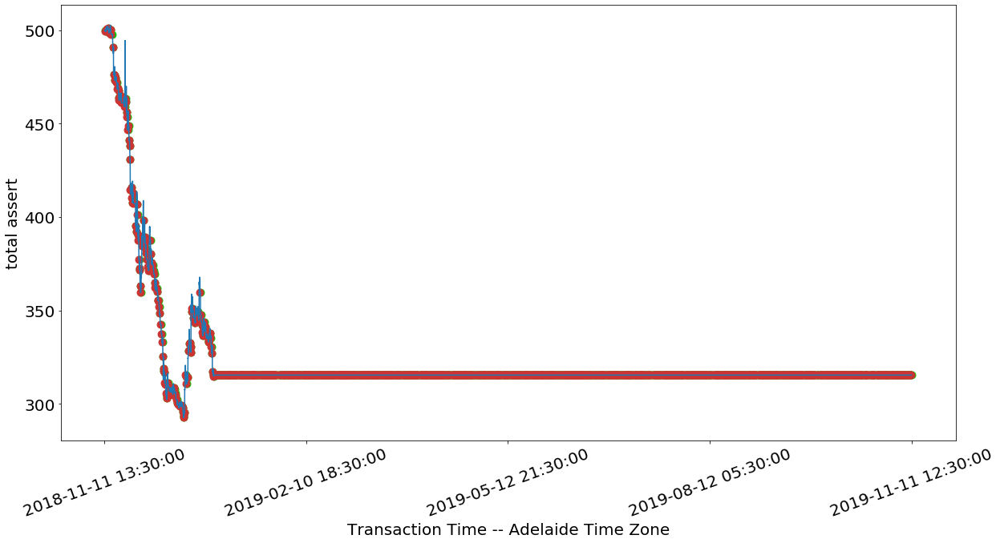

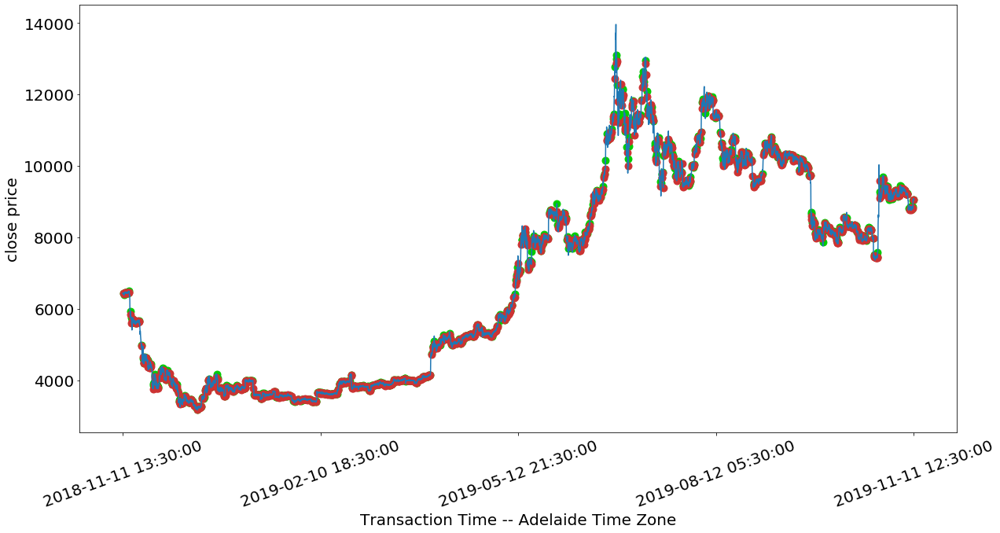

{Timestamp('2018-11-11 16:30:00'): 1, Timestamp('2018-11-11 19:30:00'): 2, Timestamp('2018-11-12 03:30:00'): 1, Timestamp('2018-11-12 08:30:00'): 2, Timestamp('2018-11-12 09:30:00'): 1, Timestamp('2018-11-12 14:30:00'): 2, Timestamp('2018-11-12 22:30:00'): 1, Timestamp('2018-11-13 01:30:00'): 2, Timestamp('2018-11-13 05:30:00'): 1, Timestamp('2018-11-13 07:30:00'): 2, Timestamp('2018-11-13 09:30:00'): 1, Timestamp('2018-11-13 10:30:00'): 2, Timestamp('2018-11-13 13:30:00'): 1, Timestamp('2018-11-13 17:30:00'): 2, Timestamp('2018-11-13 21:30:00'): 1, Timestamp('2018-11-14 00:30:00'): 2, Timestamp('2018-11-14 01:30:00'): 1, Timestamp('2018-11-14 04:30:00'): 2, Timestamp('2018-11-14 06:30:00'): 1, Timestamp('2018-11-14 09:30:00'): 2, Timestamp('2018-11-15 09:30:00'): 1, Timestamp('2018-11-15 11:30:00'): 2, Timestamp('2018-11-15 17:30:00'): 1, Timestamp('2018-11-15 20:30:00'): 2, Timestamp('2018-11-16 01:30:00'): 1, Timestamp('2018-11-16 06:30:00'): 2, Timestamp('2018-11-16 08:30:00'): 1, 

In [54]:
record = {}
run_bot('1h','1 hour','1 year ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2018-11-11 14:30:00
Investment End Time:2019-11-11 12:30:00
Investment Periods: 364
Current Money:402.7179400199998
Current Bitcoin: 0
Current BNB: -0.014721585227916136
Return on Investment is:-31.78763534137334%
Current Total Assert is: 402.4529514858973
Trading curb occured


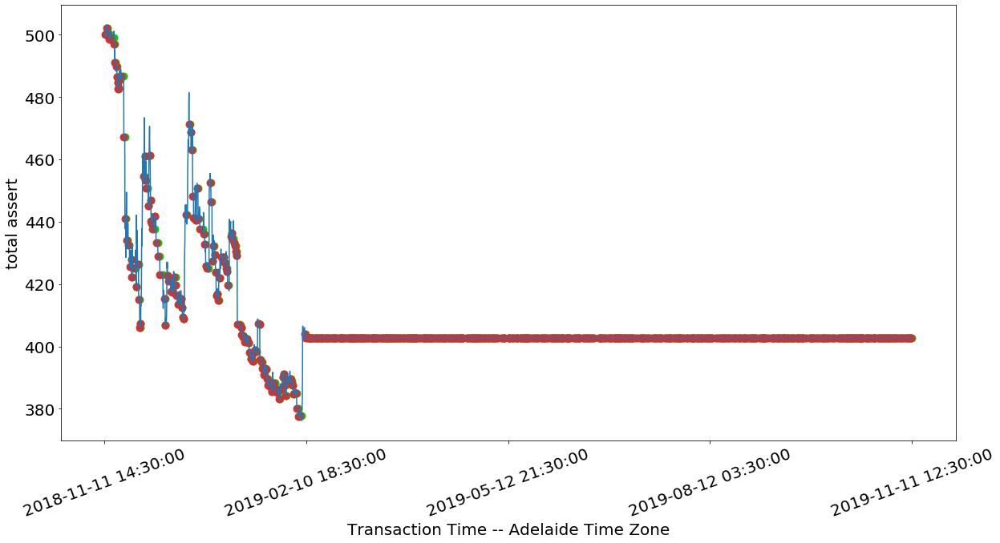

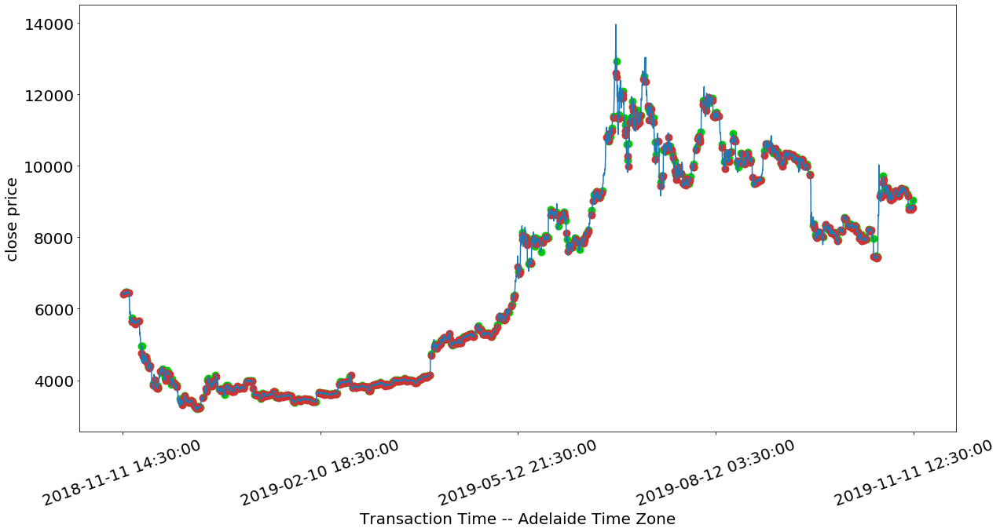

{Timestamp('2018-11-12 04:30:00'): 1, Timestamp('2018-11-12 16:30:00'): 2, Timestamp('2018-11-12 22:30:00'): 1, Timestamp('2018-11-13 02:30:00'): 2, Timestamp('2018-11-13 14:30:00'): 1, Timestamp('2018-11-13 18:30:00'): 2, Timestamp('2018-11-13 22:30:00'): 1, Timestamp('2018-11-14 08:30:00'): 2, Timestamp('2018-11-16 02:30:00'): 1, Timestamp('2018-11-16 06:30:00'): 2, Timestamp('2018-11-16 08:30:00'): 1, Timestamp('2018-11-16 14:30:00'): 2, Timestamp('2018-11-16 22:30:00'): 1, Timestamp('2018-11-17 02:30:00'): 2, Timestamp('2018-11-17 10:30:00'): 1, Timestamp('2018-11-17 12:30:00'): 2, Timestamp('2018-11-17 16:30:00'): 1, Timestamp('2018-11-17 20:30:00'): 2, Timestamp('2018-11-17 22:30:00'): 1, Timestamp('2018-11-18 00:30:00'): 2, Timestamp('2018-11-18 02:30:00'): 1, Timestamp('2018-11-18 04:30:00'): 2, Timestamp('2018-11-18 06:30:00'): 1, Timestamp('2018-11-18 18:30:00'): 2, Timestamp('2018-11-19 02:30:00'): 1, Timestamp('2018-11-19 08:30:00'): 2, Timestamp('2018-11-20 12:30:00'): 1, 

In [55]:
record = {}
run_bot('2h','2 hour','1 year ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2018-11-11 14:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 364
Current Money:0.0008213600004864929
Current Bitcoin: 0.10721399999999999
Current BNB: -0.011868894155000486
Return on Investment is:64.57648853647633%
Current Total Assert is: 971.0012823652104


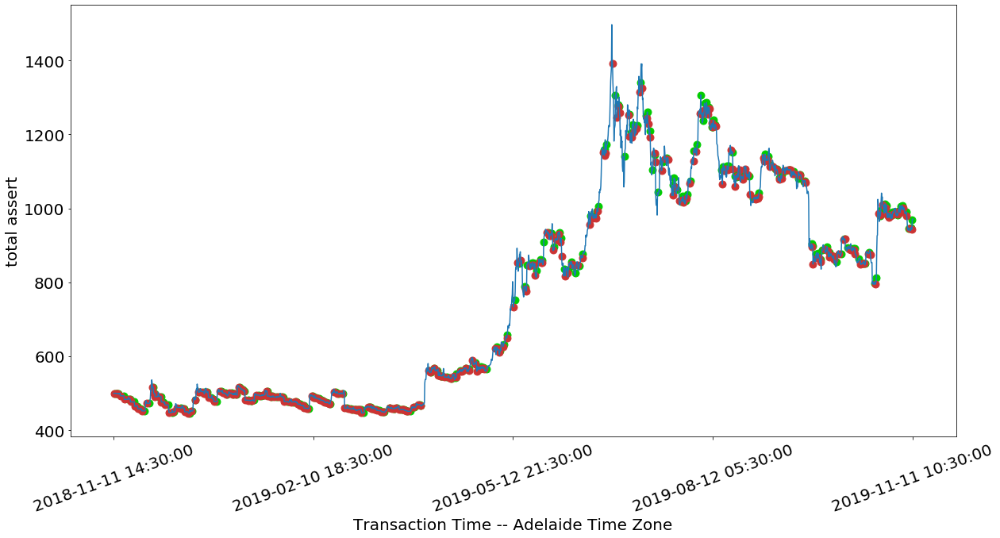

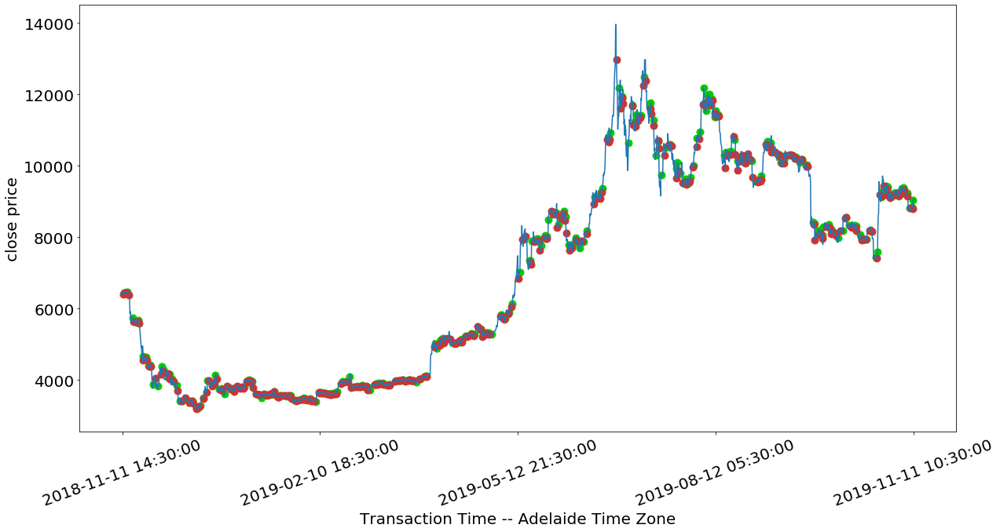

{Timestamp('2018-11-12 06:30:00'): 1, Timestamp('2018-11-12 18:30:00'): 2, Timestamp('2018-11-12 22:30:00'): 1, Timestamp('2018-11-13 06:30:00'): 2, Timestamp('2018-11-13 14:30:00'): 1, Timestamp('2018-11-14 18:30:00'): 2, Timestamp('2018-11-16 06:30:00'): 1, Timestamp('2018-11-16 14:30:00'): 2, Timestamp('2018-11-18 02:30:00'): 1, Timestamp('2018-11-18 18:30:00'): 2, Timestamp('2018-11-19 02:30:00'): 1, Timestamp('2018-11-19 10:30:00'): 2, Timestamp('2018-11-21 02:30:00'): 1, Timestamp('2018-11-21 06:30:00'): 2, Timestamp('2018-11-21 18:30:00'): 1, Timestamp('2018-11-21 22:30:00'): 2, Timestamp('2018-11-22 10:30:00'): 1, Timestamp('2018-11-22 18:30:00'): 2, Timestamp('2018-11-23 18:30:00'): 1, Timestamp('2018-11-24 02:30:00'): 2, Timestamp('2018-11-24 06:30:00'): 1, Timestamp('2018-11-24 14:30:00'): 2, Timestamp('2018-11-25 22:30:00'): 1, Timestamp('2018-11-26 18:30:00'): 2, Timestamp('2018-11-28 02:30:00'): 1, Timestamp('2018-11-29 10:30:00'): 2, Timestamp('2018-11-29 18:30:00'): 1, 

In [56]:
record = {}
run_bot('4h','4 hour','1 year ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2018-11-11 16:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 364
Current Money:841.4337627400006
Current Bitcoin: 0
Current BNB: -0.03222372516625021
Return on Investment is:42.51758231983188%
Current Total Assert is: 840.8537356870081


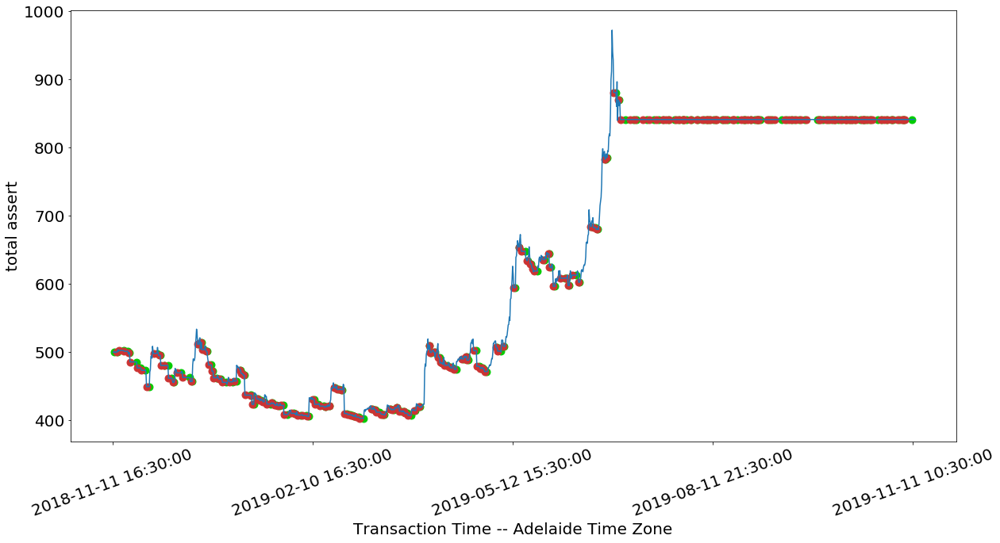

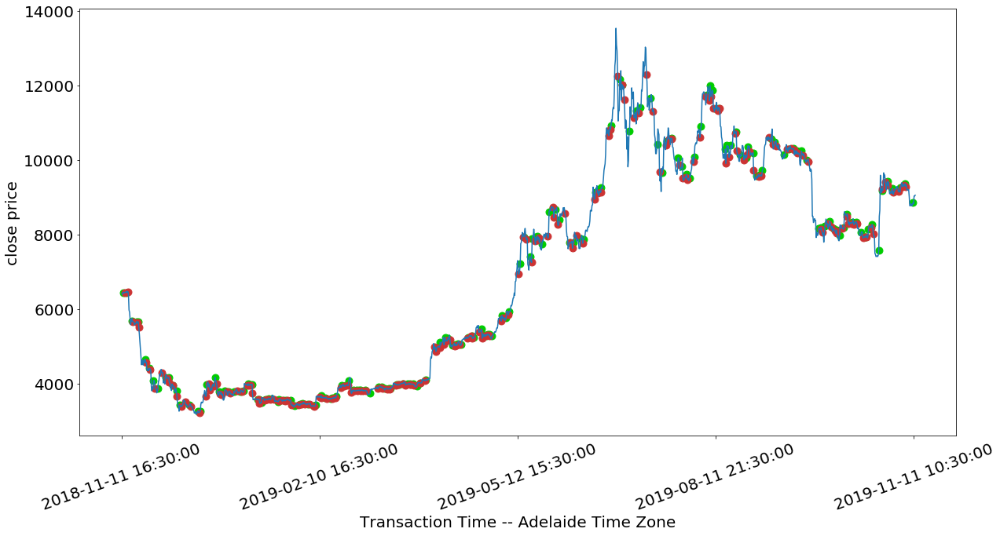

{Timestamp('2018-11-12 04:30:00'): 1, Timestamp('2018-11-13 04:30:00'): 2, Timestamp('2018-11-13 16:30:00'): 1, Timestamp('2018-11-14 10:30:00'): 2, Timestamp('2018-11-16 10:30:00'): 1, Timestamp('2018-11-16 16:30:00'): 2, Timestamp('2018-11-18 10:30:00'): 1, Timestamp('2018-11-18 22:30:00'): 2, Timestamp('2018-11-19 04:30:00'): 1, Timestamp('2018-11-19 10:30:00'): 2, Timestamp('2018-11-22 10:30:00'): 1, Timestamp('2018-11-22 16:30:00'): 2, Timestamp('2018-11-24 04:30:00'): 1, Timestamp('2018-11-24 16:30:00'): 2, Timestamp('2018-11-26 04:30:00'): 1, Timestamp('2018-11-26 22:30:00'): 2, Timestamp('2018-11-28 04:30:00'): 1, Timestamp('2018-11-30 04:30:00'): 2, Timestamp('2018-12-01 16:30:00'): 1, Timestamp('2018-12-02 16:30:00'): 2, Timestamp('2018-12-03 04:30:00'): 1, Timestamp('2018-12-03 10:30:00'): 2, Timestamp('2018-12-04 22:30:00'): 1, Timestamp('2018-12-05 04:30:00'): 2, Timestamp('2018-12-06 16:30:00'): 1, Timestamp('2018-12-06 22:30:00'): 2, Timestamp('2018-12-08 10:30:00'): 1, 

In [57]:
record = {}
run_bot('6h','6 hour','1 year ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2018-11-11 22:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 364
Current Money:0.002873359999625791
Current Bitcoin: 0.107957
Current BNB: 0.08717143037250057
Return on Investment is:65.99671378588212%
Current Total Assert is: 979.3806113367045


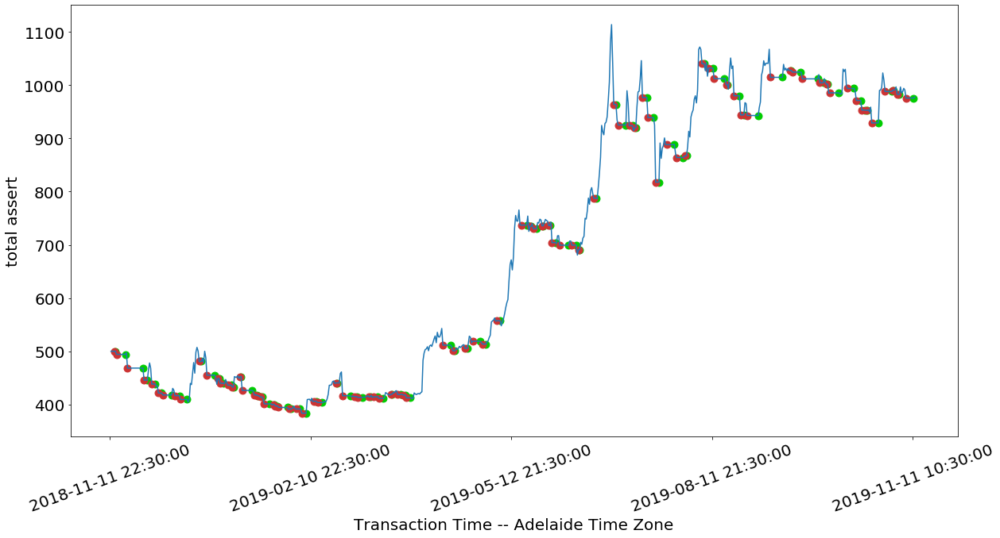

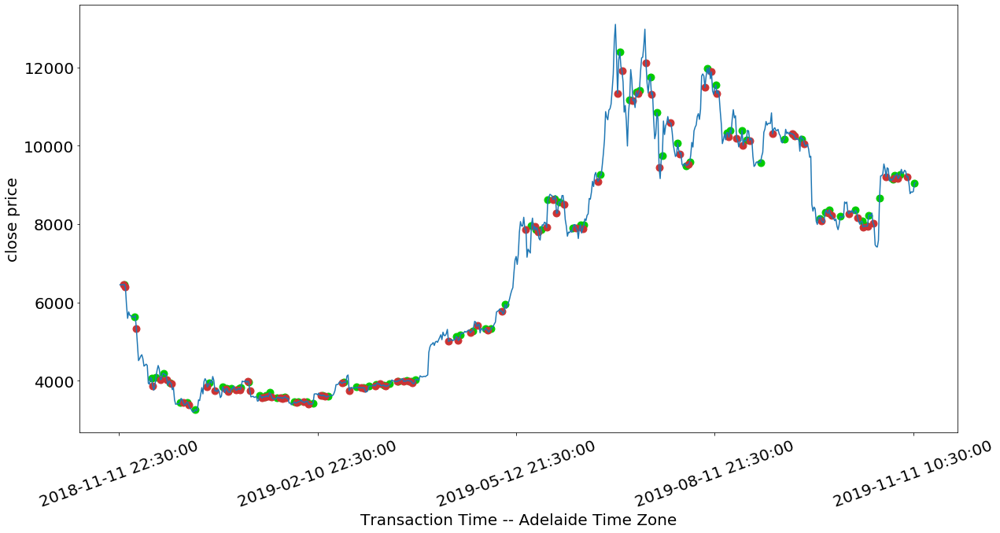

{Timestamp('2018-11-13 22:30:00'): 1, Timestamp('2018-11-14 10:30:00'): 2, Timestamp('2018-11-18 10:30:00'): 1, Timestamp('2018-11-19 10:30:00'): 2, Timestamp('2018-11-26 10:30:00'): 1, Timestamp('2018-11-26 22:30:00'): 2, Timestamp('2018-11-28 10:30:00'): 1, Timestamp('2018-11-30 10:30:00'): 2, Timestamp('2018-12-01 22:30:00'): 1, Timestamp('2018-12-03 10:30:00'): 2, Timestamp('2018-12-04 22:30:00'): 1, Timestamp('2018-12-05 10:30:00'): 2, Timestamp('2018-12-09 10:30:00'): 1, Timestamp('2018-12-10 22:30:00'): 2, Timestamp('2018-12-12 22:30:00'): 1, Timestamp('2018-12-13 10:30:00'): 2, Timestamp('2018-12-16 10:30:00'): 1, Timestamp('2018-12-21 22:30:00'): 2, Timestamp('2018-12-22 22:30:00'): 1, Timestamp('2018-12-25 10:30:00'): 2, Timestamp('2018-12-28 22:30:00'): 1, Timestamp('2018-12-30 10:30:00'): 2, Timestamp('2018-12-30 22:30:00'): 1, Timestamp('2018-12-31 10:30:00'): 2, Timestamp('2019-01-01 22:30:00'): 1, Timestamp('2019-01-03 22:30:00'): 2, Timestamp('2019-01-05 10:30:00'): 1, 

In [58]:
record = {}
run_bot('12h','12 hour','1 year ago UTC',record)

Initial money is:500
Initial bitcoin is:0
Initial bnb is:5
Investment Start Time:2018-11-12 10:30:00
Investment End Time:2019-11-11 10:30:00
Investment Periods: 364
Current Money:0.0045820199998161115
Current Bitcoin: 0.09364299999999999
Current BNB: 2.7592351750058355
Return on Investment is:52.176817644085574%
Current Total Assert is: 897.8432241001049


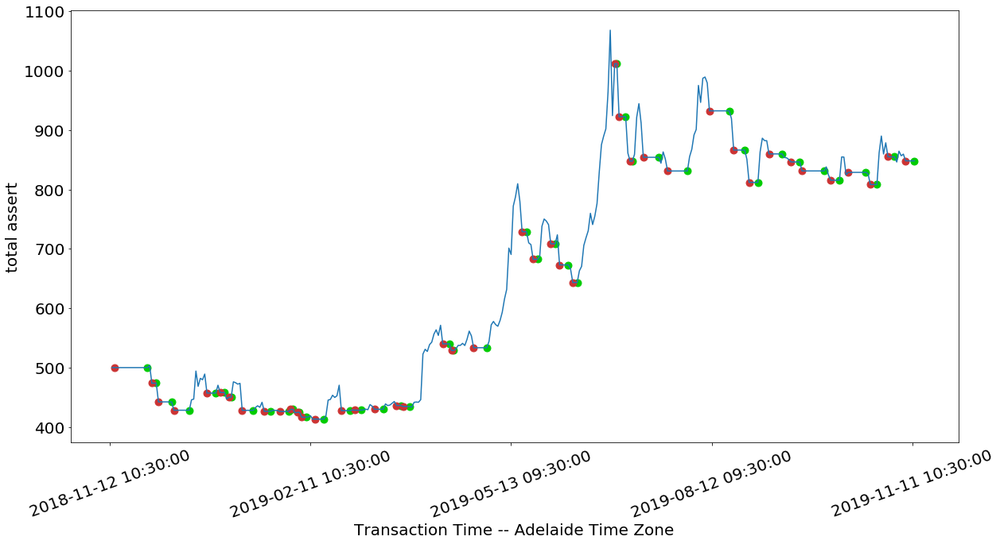

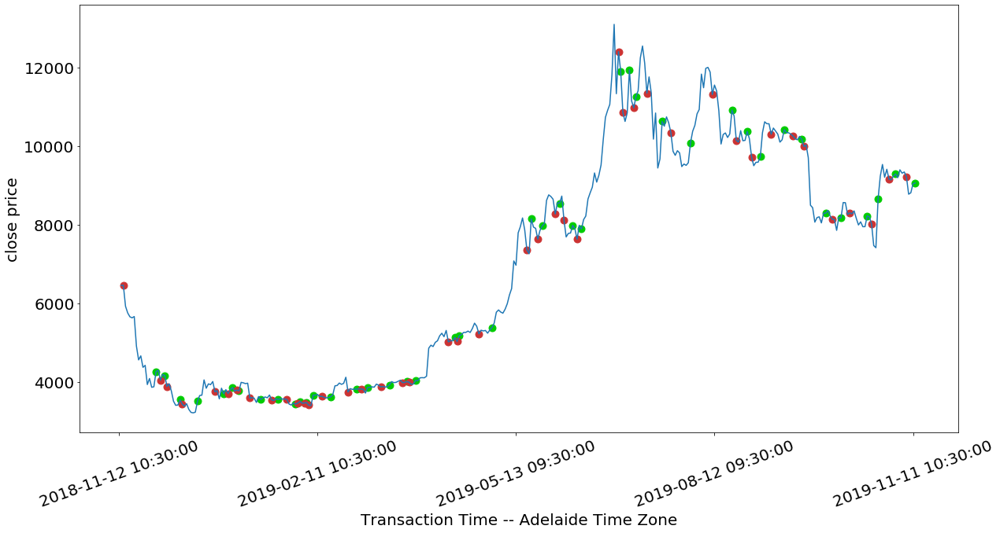

{Timestamp('2018-11-28 10:30:00'): 1, Timestamp('2018-11-30 10:30:00'): 2, Timestamp('2018-12-02 10:30:00'): 1, Timestamp('2018-12-03 10:30:00'): 2, Timestamp('2018-12-09 10:30:00'): 1, Timestamp('2018-12-10 10:30:00'): 2, Timestamp('2018-12-17 10:30:00'): 1, Timestamp('2018-12-25 10:30:00'): 2, Timestamp('2018-12-29 10:30:00'): 1, Timestamp('2018-12-31 10:30:00'): 2, Timestamp('2019-01-02 10:30:00'): 1, Timestamp('2019-01-04 10:30:00'): 2, Timestamp('2019-01-05 10:30:00'): 1, Timestamp('2019-01-10 10:30:00'): 2, Timestamp('2019-01-15 10:30:00'): 1, Timestamp('2019-01-20 10:30:00'): 2, Timestamp('2019-01-23 10:30:00'): 1, Timestamp('2019-01-27 10:30:00'): 2, Timestamp('2019-01-31 10:30:00'): 1, Timestamp('2019-02-01 10:30:00'): 2, Timestamp('2019-02-02 10:30:00'): 1, Timestamp('2019-02-04 10:30:00'): 2, Timestamp('2019-02-05 10:30:00'): 1, Timestamp('2019-02-06 10:30:00'): 2, Timestamp('2019-02-08 10:30:00'): 1, Timestamp('2019-02-12 10:30:00'): 2, Timestamp('2019-02-16 10:30:00'): 1, 

In [59]:
record = {}
run_bot('1d','1 day','1 year ago UTC',record)